In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 

In [2]:
# timesteps from 1h to 24h 
df = pd.read_csv("cleaned_data\\24timestep1h.csv", parse_dates=['tstp'])
df = df.drop(['date'], axis=1) # date column when joined with the holiday

In [3]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

def create_fourier(date_index):
    fourier = CalendarFourier(
        freq='D',
        order=1
    )
    dp = DeterministicProcess(
        index=date_index,
        constant=True,
        order=1,
        seasonal=True,
        additional_terms=[fourier],
        drop=True
    )

    return dp

In [4]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

# label encoding
precip_encoder = OneHotEncoder(sparse_output=False)
holiday_encoder = OneHotEncoder(sparse_output=False)
summary_encoder = OneHotEncoder(sparse_output=False)
household_encoder = LabelEncoder()
stdor_encoder = OneHotEncoder(sparse_output=False)
acorn_encoder = LabelEncoder()

precip_labels = precip_encoder.fit_transform(df[['precipType']])
holiday_labels = holiday_encoder.fit_transform(df[['Type']])
summary_labels = summary_encoder.fit_transform(df[['summary']])
household_labels = household_encoder.fit_transform(df[['LCLid']])
stdor_labels = stdor_encoder.fit_transform(df[['stdorToU']])
acorn_labels = acorn_encoder.fit_transform(df[['Acorn']])

precip_labels = pd.DataFrame(precip_labels, columns=precip_encoder.get_feature_names_out()).astype('int8')
holiday_labels = pd.DataFrame(holiday_labels, columns=holiday_encoder.get_feature_names_out()).astype('int8')
summary_labels = pd.DataFrame(summary_labels, columns=summary_encoder.get_feature_names_out()).astype('int8')
household_labels = pd.DataFrame(household_labels, columns=['household_label']).astype('int8')
stdor_labels = pd.DataFrame(stdor_labels, columns=stdor_encoder.get_feature_names_out()).astype('int8')
acorn_labels = pd.DataFrame(acorn_labels, columns=['acorn_label']).astype('int8')

encoded_df = pd.concat([df, precip_labels, holiday_labels, summary_labels, household_labels, stdor_labels, acorn_labels], axis=1)
encoded_df = encoded_df.drop(['precipType', 'Type', 'summary', 'LCLid', 'stdorToU', 'Acorn'], axis=1)

c:\Users\Usrer\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\Usrer\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\preprocessing\_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [5]:
# process fourier features for each group and saved each group's deterministic process
import math

dps = {}

all_household_ids = encoded_df['household_label'].unique()
households_grp = encoded_df.groupby('household_label')
training_df = []
testing_df = []

for household_id in all_household_ids:
    # get the household from the entire df
    print("Household id:", household_id)
    singlehousehold_df = households_grp.get_group(household_id).sort_values(by='tstp', ascending=True)

    # split into train, test
    cutoff_point = math.floor(singlehousehold_df.shape[0] * 0.9)
    training_singlehousehold_df = singlehousehold_df.iloc[:cutoff_point].reset_index()
    testing_singlehousehold_df = singlehousehold_df.iloc[cutoff_point:].reset_index()

    # create fourier features
    fourier_obj = create_fourier(training_singlehousehold_df.set_index('tstp').asfreq('h').index)
    fourier_train_features = fourier_obj.in_sample().reset_index().drop(['tstp'], axis=1)
    training_singlehousehold_df = pd.concat([training_singlehousehold_df, fourier_train_features], axis=1)
    fourier_test_features = fourier_obj.out_of_sample(testing_singlehousehold_df.shape[0]).reset_index().drop(['index'], axis=1)
    testing_singlehousehold_df = pd.concat([testing_singlehousehold_df.reset_index().drop(['index'], axis=1), fourier_test_features], axis=1)
    
    # save the dp object
    dps[household_id] = fourier_obj

    # append to the household_dfs list
    training_df.append(training_singlehousehold_df)
    testing_df.append(testing_singlehousehold_df)

training_df = pd.concat(training_df, axis=0)
testing_df = pd.concat(testing_df, axis=0)

Household id: 35
Household id: 30
Household id: 14
Household id: 46
Household id: 41
Household id: 24
Household id: 26
Household id: 37
Household id: 6
Household id: 45
Household id: 19
Household id: 3
Household id: 39
Household id: 32
Household id: 8
Household id: 22
Household id: 11
Household id: 38
Household id: 42
Household id: 10
Household id: 15
Household id: 16
Household id: 29
Household id: 36
Household id: 1
Household id: 23
Household id: 31
Household id: 28
Household id: 21
Household id: 7
Household id: 49
Household id: 17
Household id: 27
Household id: 0
Household id: 44
Household id: 5
Household id: 40
Household id: 12
Household id: 48
Household id: 33
Household id: 13
Household id: 2
Household id: 50
Household id: 43
Household id: 25
Household id: 34
Household id: 20
Household id: 18
Household id: 4
Household id: 9
Household id: 47


In [6]:
print("Training shape:", training_df.shape)
print("Testing shape:", testing_df.shape)

Training shape: (686587, 137)
Testing shape: (76315, 137)


In [7]:
# scale the values
from sklearn.preprocessing import MinMaxScaler

# drop unnecessary columns
training_df = training_df.drop(['index', 'tstp'], axis=1)
testing_df = testing_df.drop(['level_0', 'tstp'], axis=1)

# separate into features and target
X_train = training_df.drop(['energy(kWh/hh)'], axis=1)
X_test = testing_df.drop(['energy(kWh/hh)'], axis=1)
y_train = training_df['energy(kWh/hh)']
y_test = testing_df['energy(kWh/hh)']

# store the household ids for future evaluation
test_household_ids = X_test['household_label']
train_household_ids = X_train['household_label']

# Scale with MinMax Normalization
scaler = MinMaxScaler(feature_range=(0, 1)) # scale to 0 and 1
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# reshape for LSTM, CNN-LSTM models
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

print(X_train.shape)
print(X_test.shape)

(686587, 1, 134)
(76315, 1, 134)


## Understanding on the Evaluation Set

In [8]:
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, mean_squared_error, r2_score

def adjusted_r2(y_pred, y_test):
   p = X_train.shape[2]
   r2 = r2_score(y_pred, y_test)
   n = y_test.shape[0]
   
   adjusted_coefficient = 1 - (1 - r2) * (n - 1) / (n - p - 1)

   return adjusted_coefficient

def evaluate_model(y_pred, y_test, deep_learning):
  """
    Evaluate the model predictions with all the regression metrics
  """
  if deep_learning:
    prediction = y_pred.ravel()

  else:
    prediction = y_pred

  print("RMSE:", mean_squared_error(y_test, prediction, squared=False))
  print("MSE:", mean_squared_error(y_test, prediction, squared=True))
  print("MAE:", mean_absolute_error(y_test, prediction))
  print("MAPE:", mean_absolute_percentage_error(y_test, prediction))
  print("R2 Score:", r2_score(y_test, prediction))
  print("Adjusted R2 Score:", adjusted_r2(y_test, prediction))

def plot_forecast(y_pred, y_test, number_of_slices=3, steps=168, skip=0):
    """
      Plot the forecasted values against the truth values for LSTM and CNN-LSTM
    """
    fig, axes = plt.subplots(number_of_slices, 1, sharey=True, figsize=(14, 10))
    timesteps = np.arange(0, steps)
    
    for i in range(number_of_slices):
        start_idx = 0 + (steps * i) + (skip)
        end_idx = steps * (1 + i) + (skip)
        sampled_test = y_test.iloc[start_idx:end_idx]
        sampled_pred = y_pred.iloc[start_idx:end_idx]

        mse = round(mean_squared_error(sampled_test, sampled_pred), 4)
        rmse = round(mean_squared_error(sampled_test, sampled_pred, squared=False), 4)
        mae = round(mean_absolute_error(sampled_test, sampled_pred), 4)
        mape = round(mean_absolute_percentage_error(sampled_test, sampled_pred), 2)
        r2 = round(r2_score(sampled_test, sampled_pred), 4)
        
        sns.lineplot(x=timesteps, y=sampled_test, label="truth-value", marker='o', alpha=0.3, ax=axes[i])
        sns.lineplot(x=timesteps, y=sampled_pred, label="pred-value", marker='o', ax=axes[i])
        axes[i].set_title(f'MSE: {mse}; RMSE: {rmse}; MAE: {mae}; MAPE: {mape}; R2: {r2}')
        axes[i].set_ylabel('Energy (kWh/hh)')

    plt.tight_layout()
    plt.show()
    

In [9]:
# preprare dataset for evaluation
y_test_with_ids = np.hstack((y_test.values.reshape(-1, 1), test_household_ids.values.reshape(-1, 1)))
y_test_with_ids = pd.DataFrame(y_test_with_ids, columns=['y_test', 'household_ids'])
y_test_with_ids

,y_test,household_ids
0,0.751,35.0
1,0.758,35.0
2,0.750,35.0
3,0.856,35.0
4,0.886,35.0
...,...,...
76310,0.076,47.0
76311,0.037,47.0
76312,0.039,47.0
76313,0.041,47.0


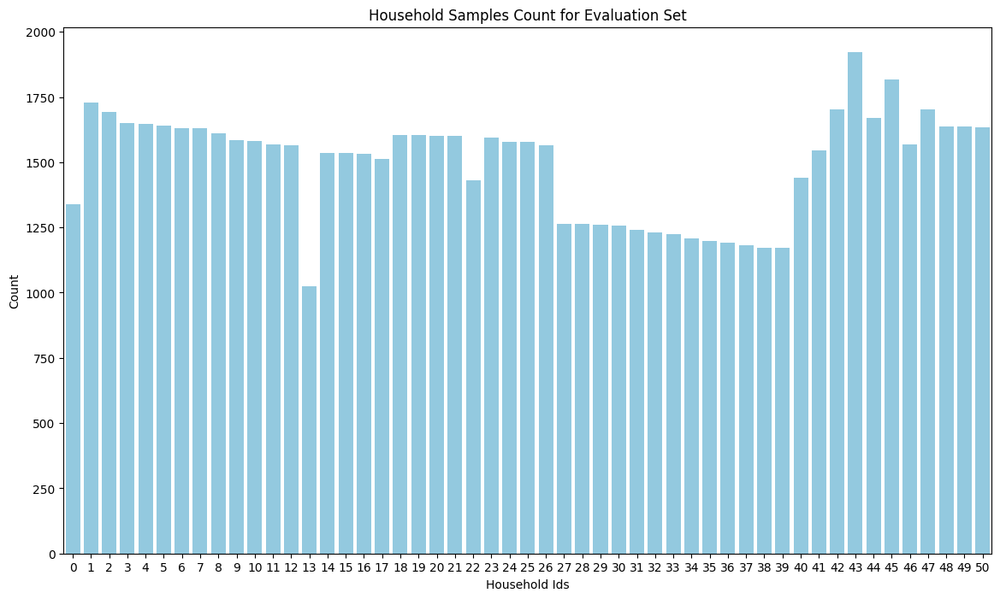

In [36]:
plt.figure(figsize=(14, 8))
household_counts = y_test_with_ids['household_ids'].value_counts().reset_index()
household_counts['index'] = household_counts['index'].astype('int8')
plt.title(f'Household Samples Count for Evaluation Set')
sns.barplot(data=household_counts.sort_values(by='index', ascending=True), x='index', y='household_ids', color='skyblue')
plt.xlabel('Household Ids')
plt.ylabel('Count')
plt.show()

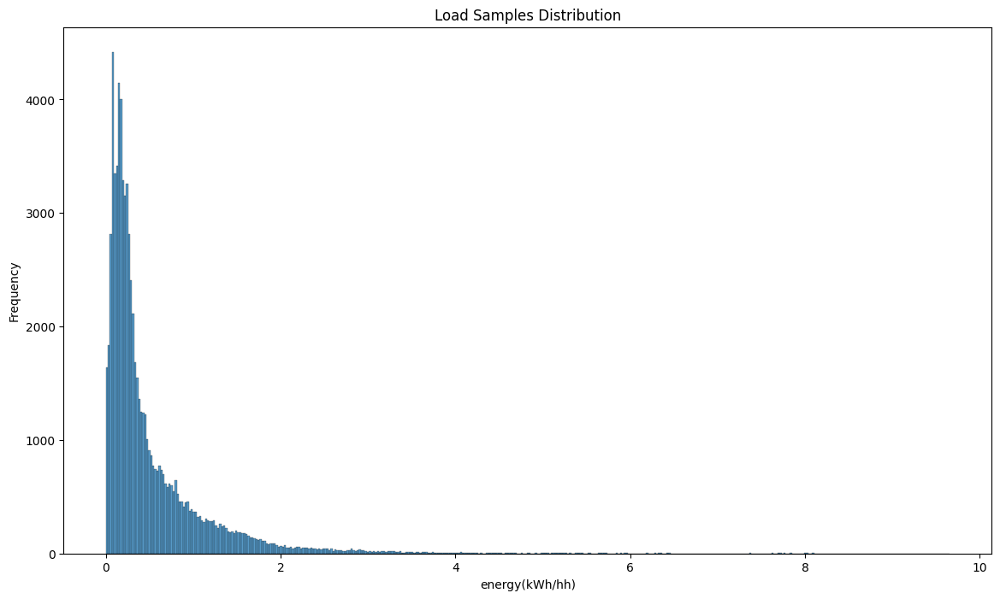

In [41]:
plt.figure(figsize=(14, 8))
plt.title("Load Samples Distribution")
plt.xlabel("energy(kWh/hh)")
plt.ylabel("Frequency")
sns.histplot(x=y_test_with_ids['y_test'])
plt.show()

In [42]:
y_test_with_ids['y_test'].describe()

count    76315.000000
mean         0.513967
std          0.644126
min          0.000000
25%          0.148000
50%          0.278000
75%          0.640000
max          9.655001
Name: y_test, dtype: float64

# Evaluation

## Deterministic Approach

In [17]:
def calculate_error(y_pred, y_test):
  return y_pred - y_test

def plot_error_distribution(residuals):
    plt.figure(figsize=(14, 8))
    plt.title("Residuals Distribution")
    plt.xlabel("Residuals")
    plt.ylabel("Frequency")
    sns.histplot(x=residuals, kde=True)
    plt.show()

def plot_metrics_bar(top5, bottom5, metric_name):
    if metric_name not in ['r2', 'adjusted_r2']:
      plt.figure(figsize=(14, 8))
      _, axes = plt.subplots(1, 2, figsize=(14, 8), sharey=True)
      ax = sns.barplot(data=top5.round(4), x='household_id', y=metric_name, color='tomato', ax=axes[0])
      axes[0].set_title(f'{metric_name.upper()} by Household')
      axes[0].set_ylabel(metric_name.upper())
      axes[0].set_xlabel('Household Ids')
      for i in ax.containers:
        ax.bar_label(i,)

      ax = sns.barplot(data=bottom5.round(4), x='household_id', y=metric_name, color='mediumseagreen', ax=axes[1])
      axes[1].set_title(f'{metric_name.upper()} by Household')
      axes[1].set_ylabel(metric_name.upper())
      axes[1].set_xlabel('Household Ids')
      for i in ax.containers:
        ax.bar_label(i,)

      plt.show()

    else:
      plt.figure(figsize=(14, 8))
      _, axes = plt.subplots(1, 2, figsize=(14, 8), sharey=True)
      axes[0].set_title(f'{metric_name.upper()} by Household')
      axes[0].set_ylabel(metric_name.upper())
      axes[0].set_xlabel('Household Ids')
      ax = sns.barplot(data=top5.round(4), x='household_id', y=metric_name, color='mediumseagreen', ax=axes[0])
      for i in ax.containers:
        ax.bar_label(i,)

      ax = sns.barplot(data=bottom5.round(4), x='household_id', y=metric_name, color='tomato', ax=axes[1])
      axes[1].set_title(f'{metric_name.upper()} by Household')
      axes[1].set_ylabel(metric_name.upper())
      axes[1].set_xlabel('Household Ids')
      for i in ax.containers:
        ax.bar_label(i,)

      plt.tight_layout()
      plt.show()

def plot_training_metrics(history):
  training_metrics = history.history
  loss = training_metrics['loss']
  val_loss = training_metrics['val_loss']
  mae = training_metrics['mae']
  val_mae = training_metrics['val_mae']


  timesteps = np.arange(len(loss))
  plt.figure(figsize=(14, 8))
  plt.subplot(1, 2, 1)
  sns.lineplot(x=timesteps, y=loss, label='loss', marker='o')
  sns.lineplot(x=timesteps, y=val_loss, label='val_loss', marker='o')
  plt.title("Loss vs Validation Loss")
  plt.xlabel("Epochs")  
  plt.ylabel("Loss")

  plt.subplot(1, 2, 2) 
  sns.lineplot(x=timesteps, y=mae, label='mae', marker='o')
  sns.lineplot(x=timesteps, y=val_mae, label='val_mae', marker='o')
  plt.title("Mean Absolute Error vs Validation Mean Absolute Error")
  plt.xlabel("Epochs")
  plt.ylabel("Mean Absolute Error")

  plt.tight_layout()
  plt.show()
    

### XGBoost

In [11]:
from xgboost import XGBRegressor

# reshape back to the original shape for XGBoost
ml_train = X_train.reshape(X_train.shape[0], X_train.shape[2]) 
ml_test = X_test.reshape(X_test.shape[0], X_test.shape[2])

hyperparams = {'learning_rate': 0.003, 'max_depth': 9, 'n_estimators': 1000, 'reg_alpha': 0.5}
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42, n_jobs=5, **hyperparams) # uses 5 CPU cores
xgb_model.fit(ml_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.003, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=9, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=5,
             num_parallel_tree=None, random_state=42, ...)

In [12]:
y_pred = xgb_model.predict(ml_test)
evaluate_model(y_pred, y_test, deep_learning=False)

RMSE: 0.3414873987032901
MSE: 0.11661364347313982
MAE: 0.17775628625776424
MAPE: 2622585884073.339
R2 Score: 0.7189306268661859
Adjusted R2 Score: 0.7184362281263601


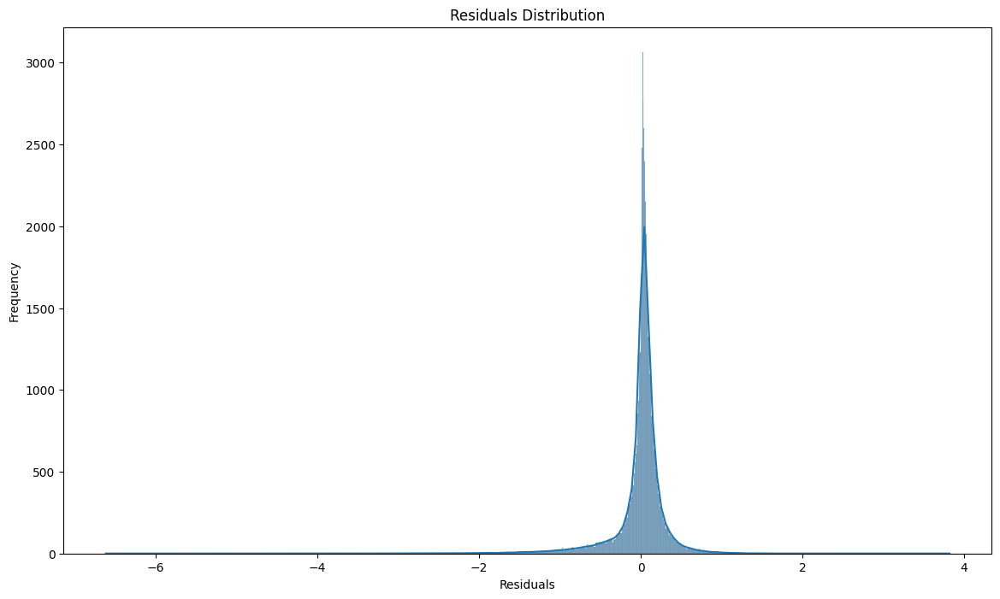

In [13]:
xgb_residuals = calculate_error(y_pred, y_test)
plot_error_distribution(xgb_residuals)

In [14]:
# prepare the prediction dataframe with household and testing data
xgb_pred_by_household = pd.DataFrame(np.hstack([y_pred.reshape(-1, 1), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['y_pred', 'household_id', 'y_test'])
xgb_pred_by_household['household_id'] = xgb_pred_by_household['household_id'].astype('int8')

# prepare the household grp
xgb_hhgrp = xgb_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
xgb_metrics = xgb_hhgrp.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'])).reset_index()
xgb_metrics['rmse'] = xgb_hhgrp.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'], squared=False)).values
xgb_metrics['mae'] = xgb_hhgrp.apply(lambda x: mean_absolute_error(x['y_test'], x['y_pred'])).values
xgb_metrics['mape'] = xgb_hhgrp.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['y_pred'])).values
xgb_metrics['r2'] = xgb_hhgrp.apply(lambda x: r2_score(x['y_test'], x['y_pred'])).values
xgb_metrics['adjusted_r2'] = xgb_hhgrp.apply(lambda x: adjusted_r2(x['y_test'], x['y_pred'])).values
xgb_metrics = xgb_metrics.rename(columns={ 0: 'mse'})


<Figure size 1400x800 with 0 Axes>

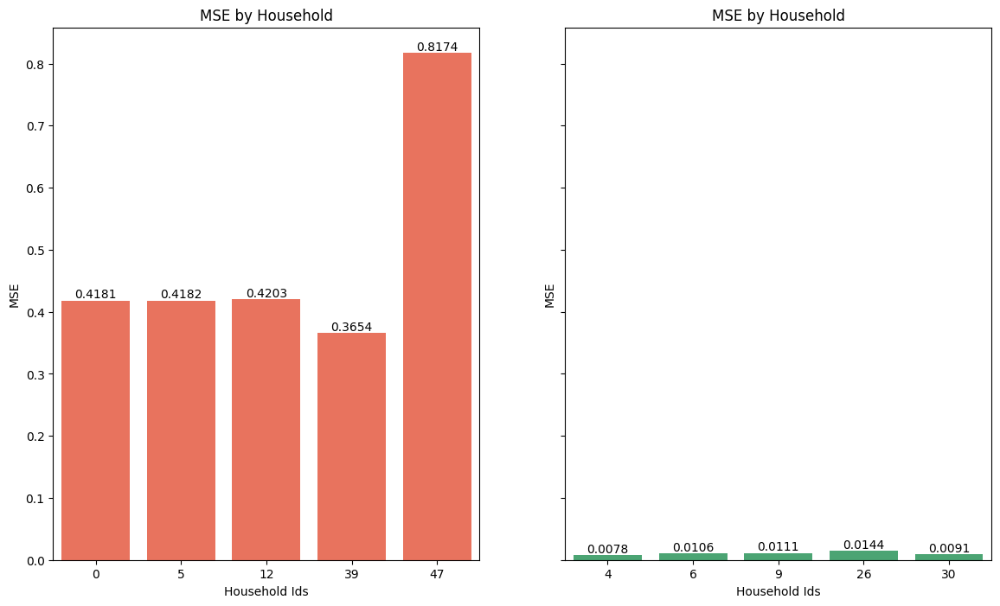

In [15]:
top5_metric = xgb_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = xgb_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

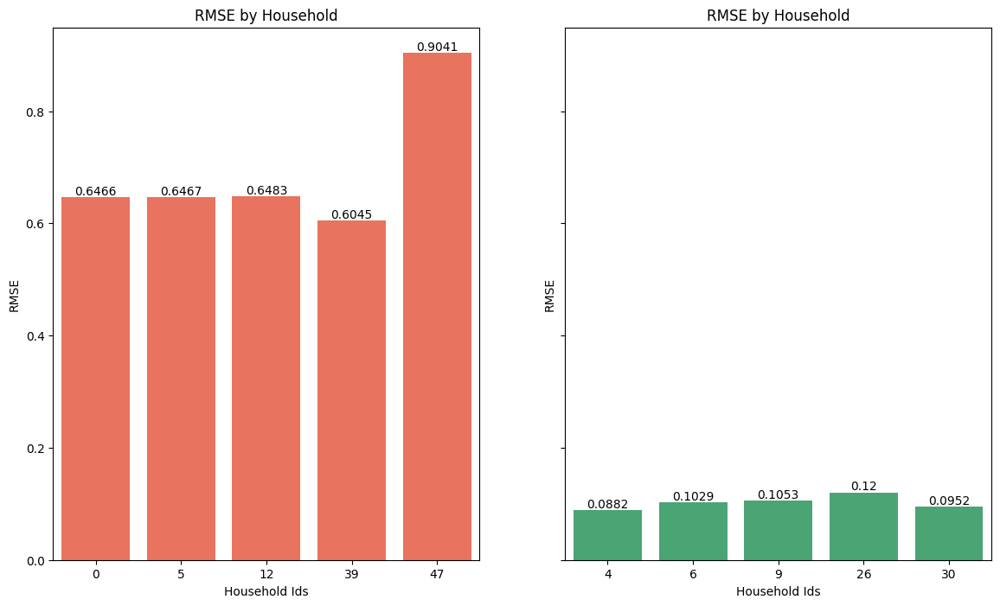

In [16]:
top5_metric = xgb_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = xgb_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

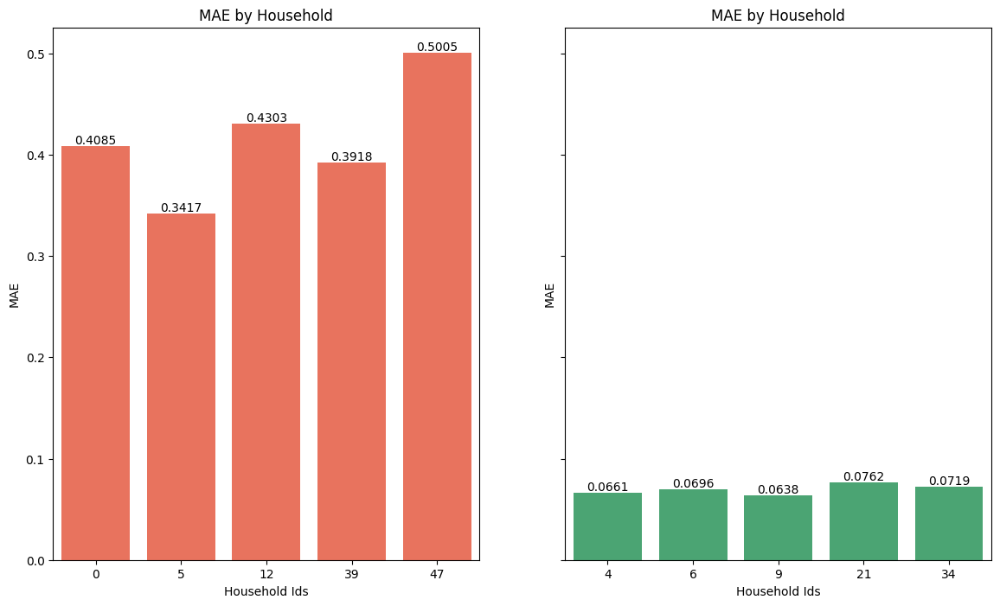

In [17]:
top5_metric = xgb_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = xgb_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

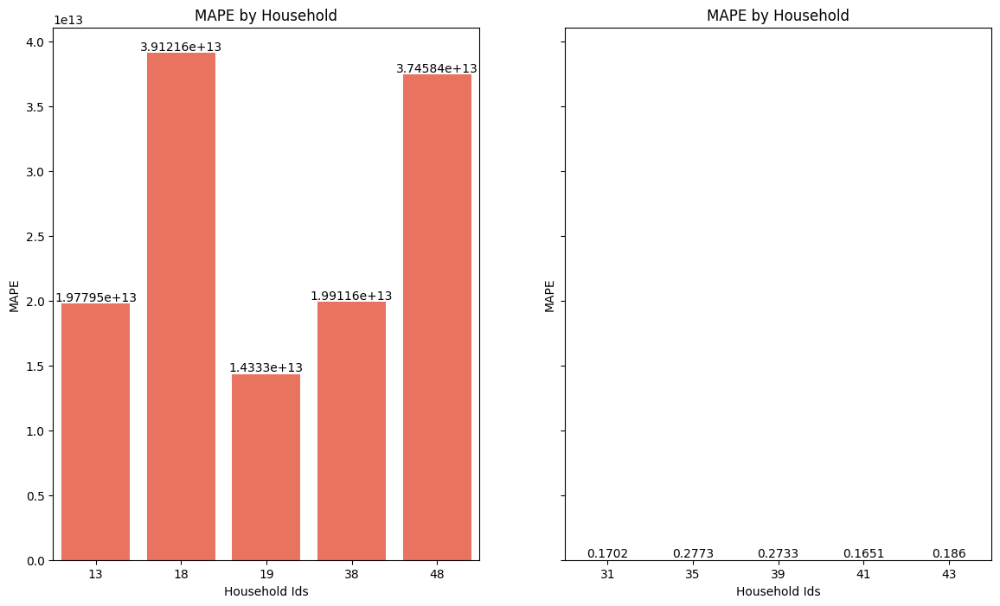

In [18]:
top5_metric = xgb_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = xgb_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

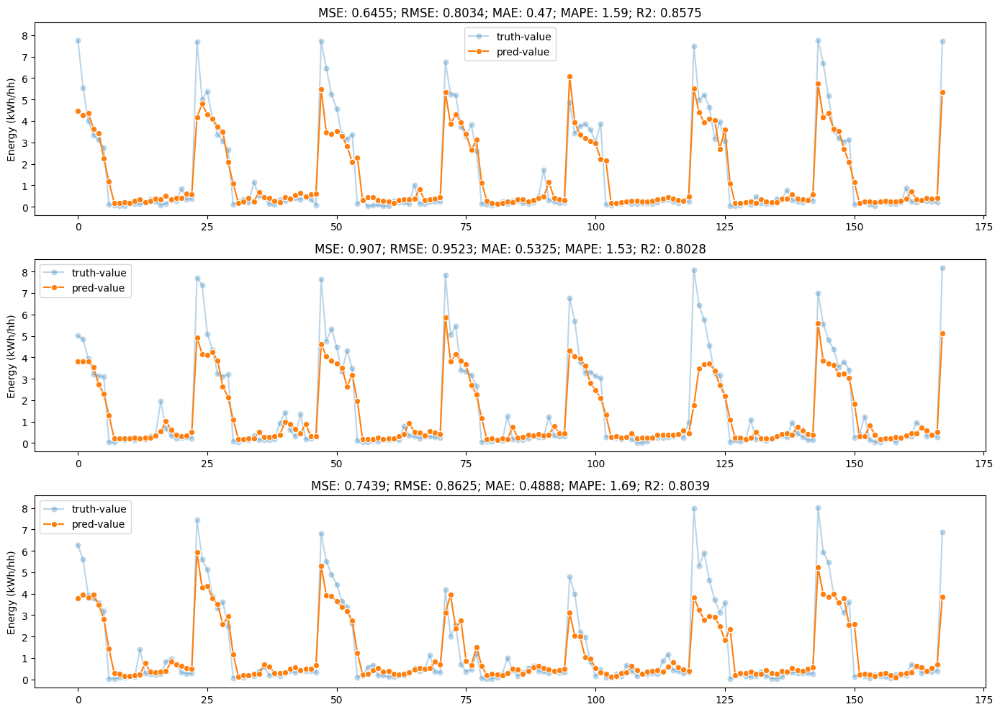

In [19]:
filtered_data = xgb_pred_by_household.loc[xgb_pred_by_household['household_id'] == 47]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

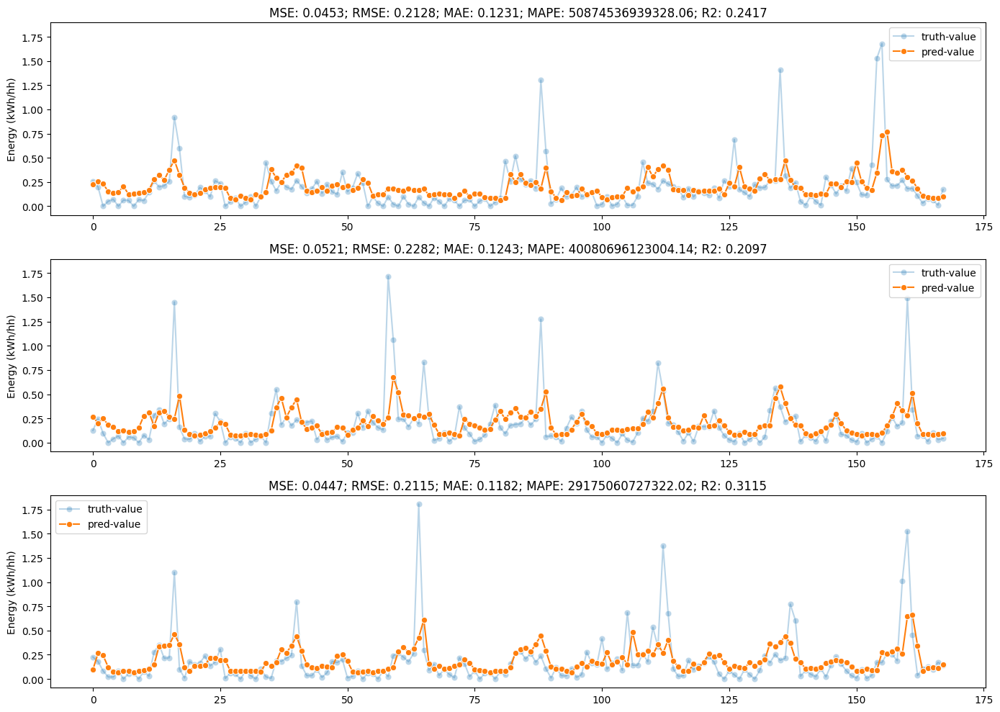

In [23]:
filtered_data = xgb_pred_by_household.loc[xgb_pred_by_household['household_id'] == 18]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

### Random Forest

In [10]:
import pickle

with open('rf_model.pkl', 'rb') as f:
    rf_model = pickle.load(f)

In [19]:
from sklearn.ensemble import RandomForestRegressor

# reshape back to the original shape for XGBoost
ml_train = X_train.reshape(X_train.shape[0], X_train.shape[2]) 
ml_test = X_test.reshape(X_test.shape[0], X_test.shape[2])

hyperparams = {'max_depth': 9, 'min_samples_split': 2, 'n_estimators': 702}
rf_model = RandomForestRegressor(random_state=42, n_jobs=5, **hyperparams) # uses 5 CPU cores
rf_model.fit(ml_train, y_train)

RandomForestRegressor(max_depth=9, min_samples_split=3, n_estimators=506,
                      n_jobs=5, random_state=42)

In [11]:
y_pred = rf_model.predict(ml_test)

evaluate_model(y_pred, y_test, deep_learning=False)

RMSE: 0.34802676772543284
MSE: 0.1211226310534124
MAE: 0.18118912614737806
MAPE: 0.39654772547942924
R2 Score: 0.560519720542086
Adjusted R2 Score: 0.5597466783072821


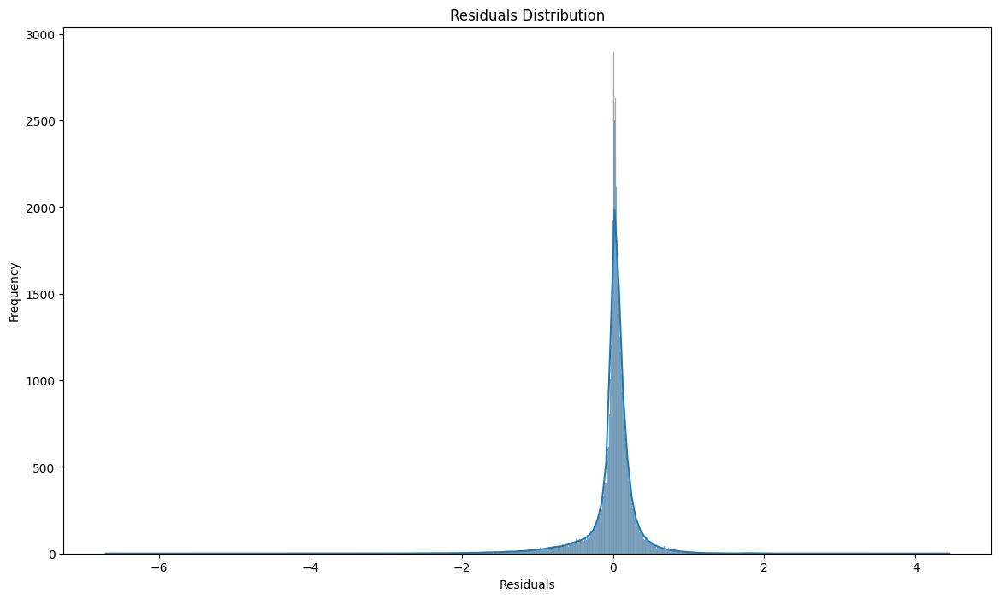

In [14]:
rf_residuals = calculate_error(y_pred, y_test)

plot_error_distribution(rf_residuals)

In [17]:
# prepare the prediction dataframe with household and testing data
rf_pred_by_household = pd.DataFrame(np.hstack([y_pred.reshape(-1, 1), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['y_pred', 'household_id', 'y_test'])
rf_pred_by_household['household_id'] = rf_pred_by_household['household_id'].astype('int8')

# prepare the household grp
rf_hhgroup = rf_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
rf_metrics = rf_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'])).reset_index()
rf_metrics['rmse'] = rf_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'], squared=False)).values
rf_metrics['mae'] = rf_hhgroup.apply(lambda x: mean_absolute_error(x['y_test'], x['y_pred'])).values
rf_metrics['mape'] = rf_hhgroup.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['y_pred'])).values
rf_metrics['r2'] = rf_hhgroup.apply(lambda x: r2_score(x['y_test'], x['y_pred'])).values
rf_metrics['adjusted_r2'] = rf_hhgroup.apply(lambda x: adjusted_r2(x['y_test'], x['y_pred'])).values
rf_metrics = rf_metrics.rename(columns={ 0: 'mse'})


<Figure size 1400x800 with 0 Axes>

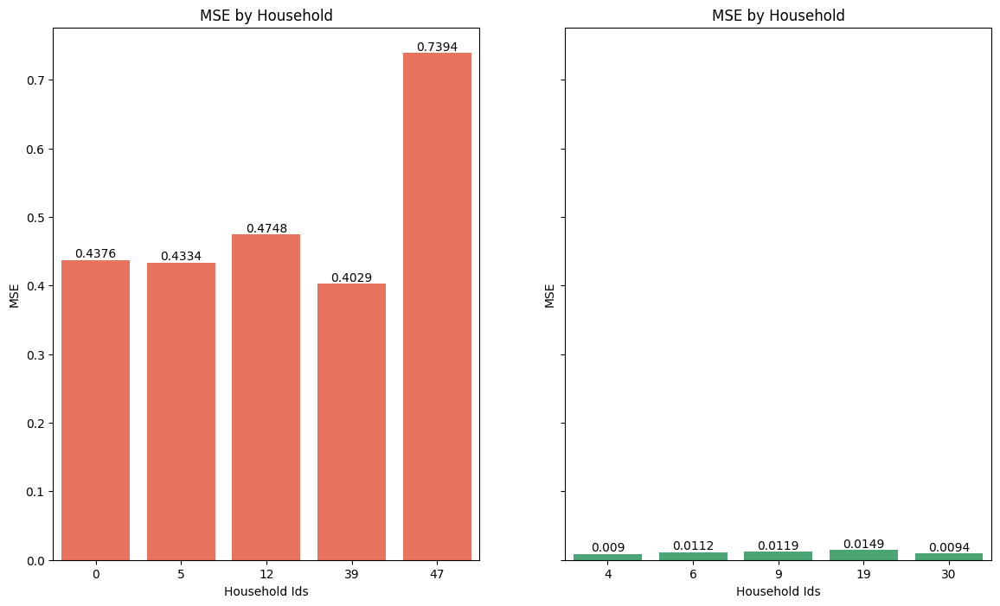

In [18]:
top5_metric = rf_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = rf_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

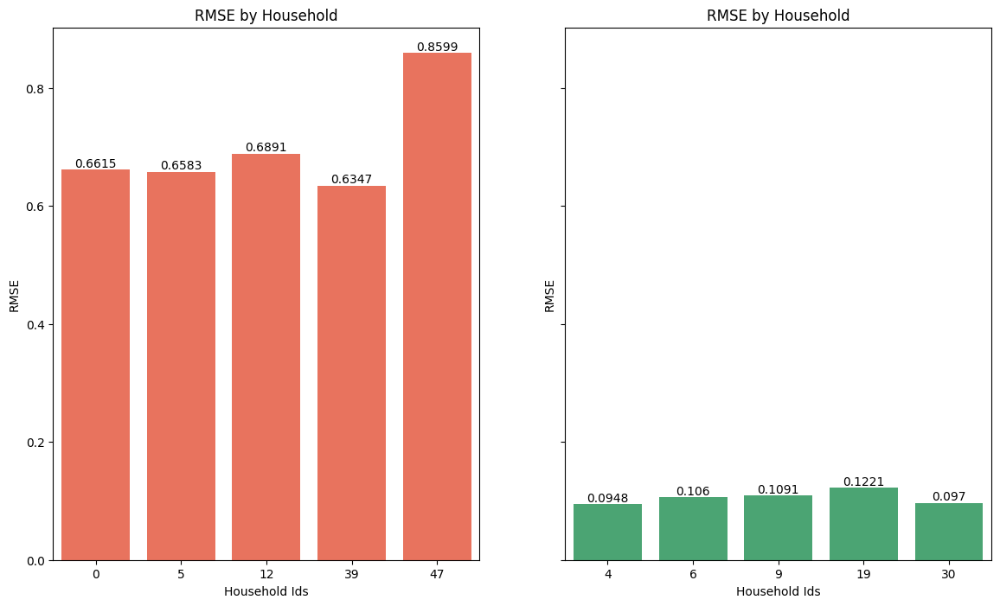

In [19]:
top5_metric = rf_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = rf_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

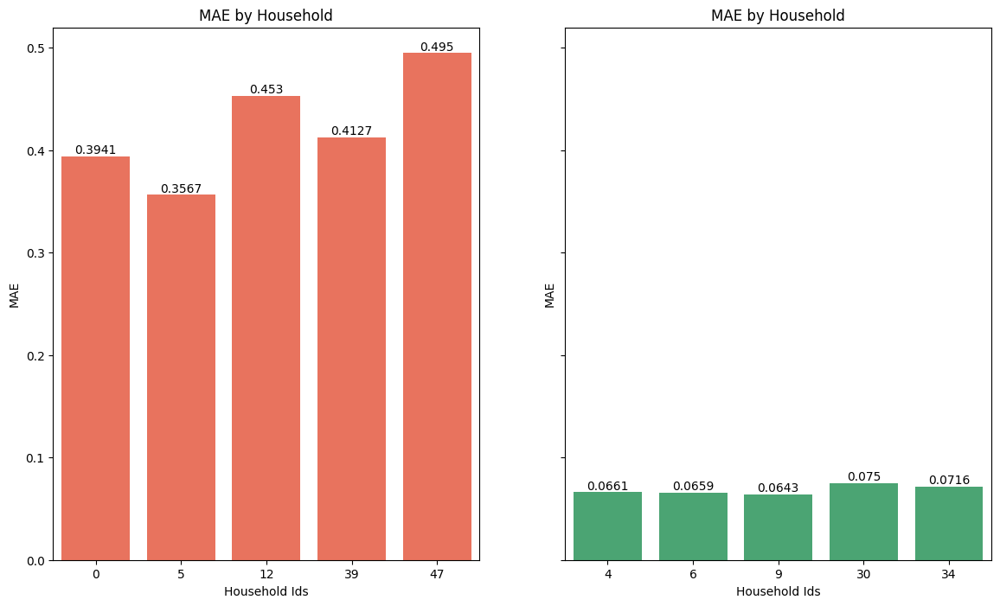

In [20]:
top5_metric = rf_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = rf_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

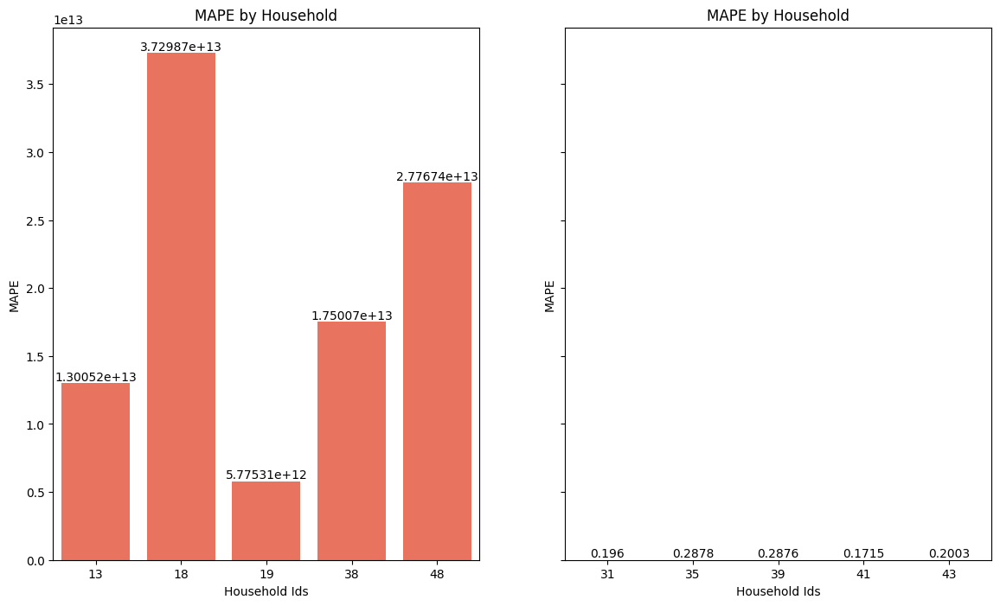

In [21]:
top5_metric = rf_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = rf_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

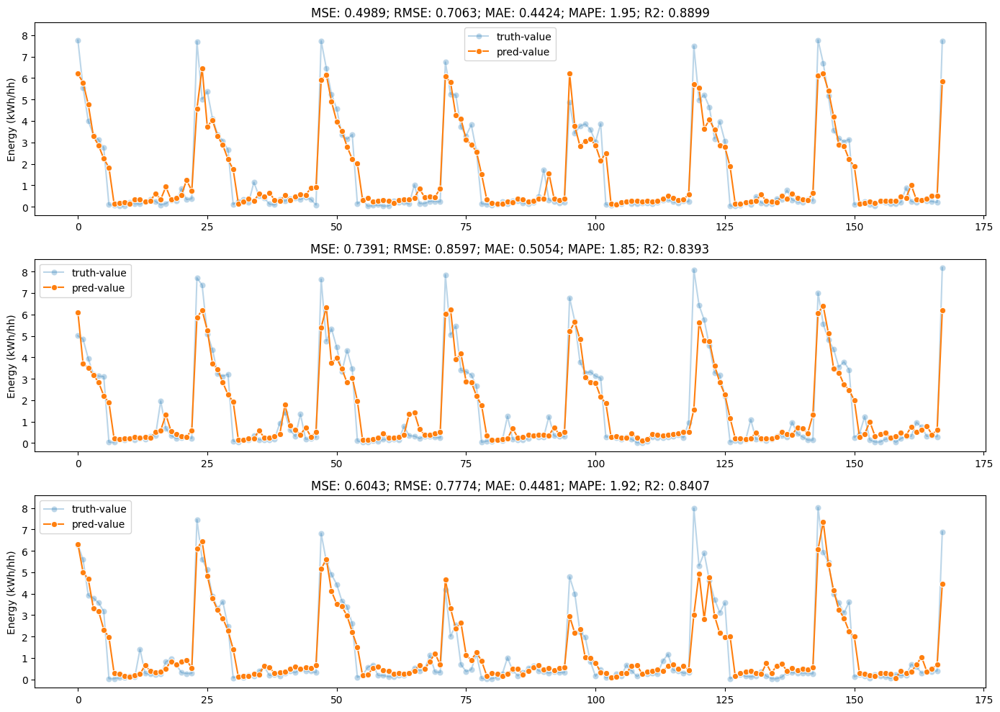

In [22]:
filtered_data = rf_pred_by_household.loc[rf_pred_by_household['household_id'] == 47]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

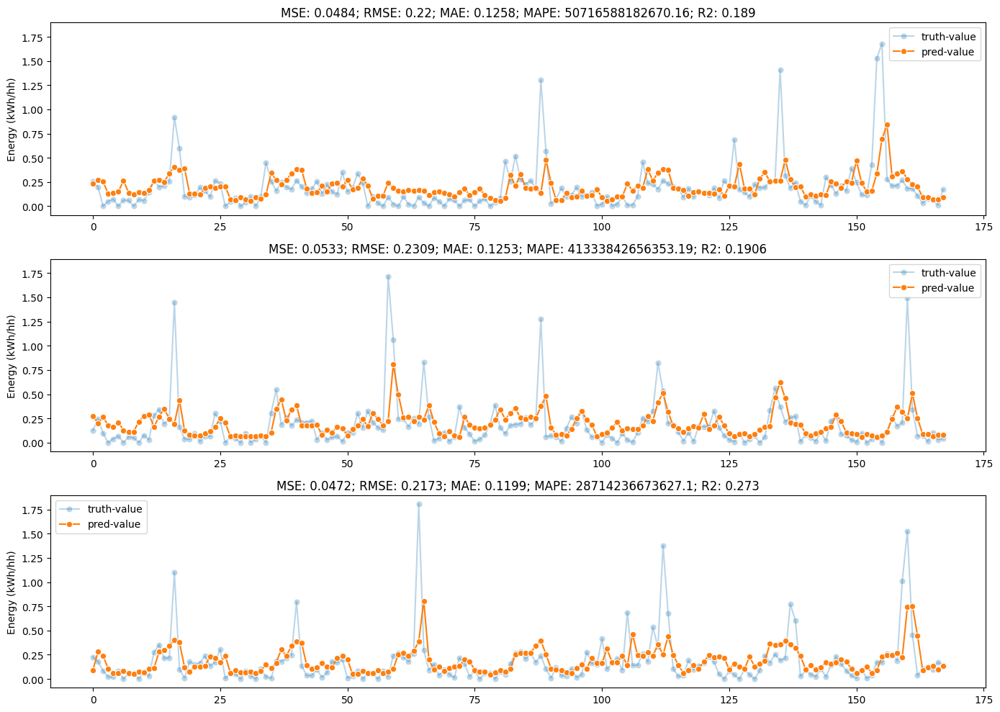

In [23]:
filtered_data = rf_pred_by_household.loc[rf_pred_by_household['household_id'] == 18]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

### LSTM

In [12]:
# Train with the best hyperparameter set
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Dense, LSTM,
    TimeDistributed, Dropout, Input
)

# for reproducibility
tf.random.set_seed(42)
tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_mse', patience=5, restore_best_weights=True)

# input 
input_layer = Input(shape=(1, X_train.shape[2]))

# stacked lstm
layer = LSTM(100, return_sequences=True)(input_layer)
layer = LSTM(100, return_sequences=True)(layer)
layer = Dropout(0.4)(layer)

# full connected layer
layer = TimeDistributed(Dense(168, activation='relu', kernel_regularizer='l1'))(layer)
layer = TimeDistributed(Dense(64, activation='relu'))(layer)

# output
output_layer = TimeDistributed(Dense(1))(layer)  
model = Model(inputs=input_layer, outputs=output_layer)


model.compile(
    loss=tf.keras.losses.MSE,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=['mae', 'mse', 'mape']
)

history = model.fit(
    X_train,
    y_train,
    epochs=50,
    validation_data=(X_test, y_test),
    batch_size=168,
    callbacks=[earlystop]
)

Epoch 1/50
4087/4087 [==============================] - 33s 8ms/step - loss: 0.3232 - mae: 0.2024 - mse: 0.1315 - mape: 1337294.7500 - val_loss: 0.1659 - val_mae: 0.2068 - val_mse: 0.1356 - val_mape: 978866.6875
Epoch 2/50
4087/4087 [==============================] - 30s 7ms/step - loss: 0.1432 - mae: 0.1890 - mse: 0.1144 - mape: 1187747.6250 - val_loss: 0.1556 - val_mae: 0.1942 - val_mse: 0.1266 - val_mape: 982281.6250
Epoch 3/50
4087/4087 [==============================] - 32s 8ms/step - loss: 0.1382 - mae: 0.1853 - mse: 0.1106 - mape: 1124702.1250 - val_loss: 0.1564 - val_mae: 0.1952 - val_mse: 0.1287 - val_mape: 981285.7500
Epoch 4/50
4087/4087 [==============================] - 30s 7ms/step - loss: 0.1357 - mae: 0.1832 - mse: 0.1085 - mape: 1088739.5000 - val_loss: 0.1550 - val_mae: 0.1988 - val_mse: 0.1300 - val_mape: 982453.8125
Epoch 5/50
4087/4087 [==============================] - 29s 7ms/step - loss: 0.1336 - mae: 0.1813 - mse: 0.1067 - mape: 1051060.2500 - val_loss: 0.1538 

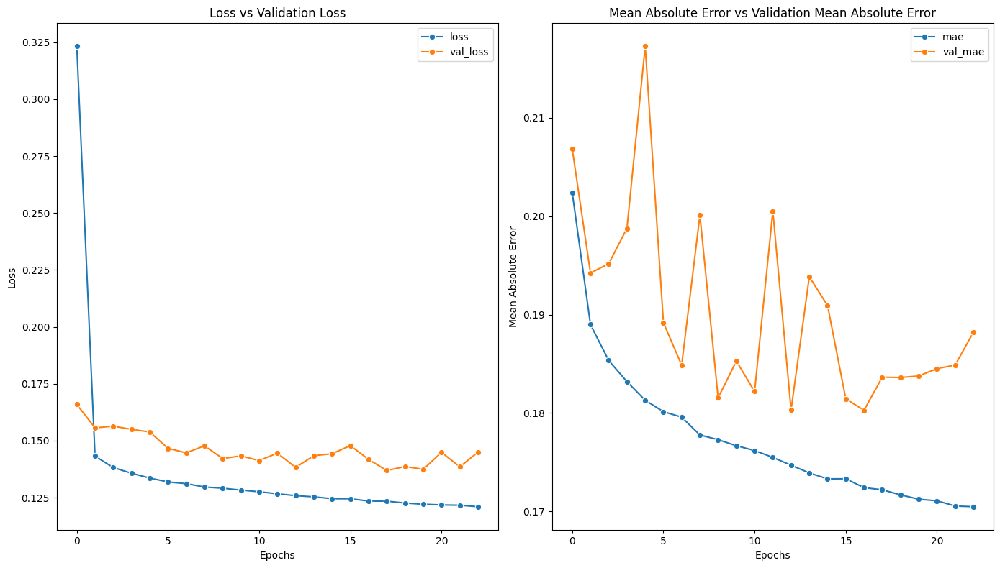

In [13]:
plot_training_metrics(history)

In [16]:
y_pred = model.predict(X_test)
residuals = calculate_error(y_pred.ravel(), y_test)

evaluate_model(y_pred, y_test, deep_learning=True)

2385/2385 [==============================] - 5s 2ms/step
RMSE: 0.33291666308574325
MSE: 0.11083350456014629
MAE: 0.18363685298607513
MAPE: 3711966011619.3623
R2 Score: 0.732862273048527
Adjusted R2 Score: 0.7323923799609515


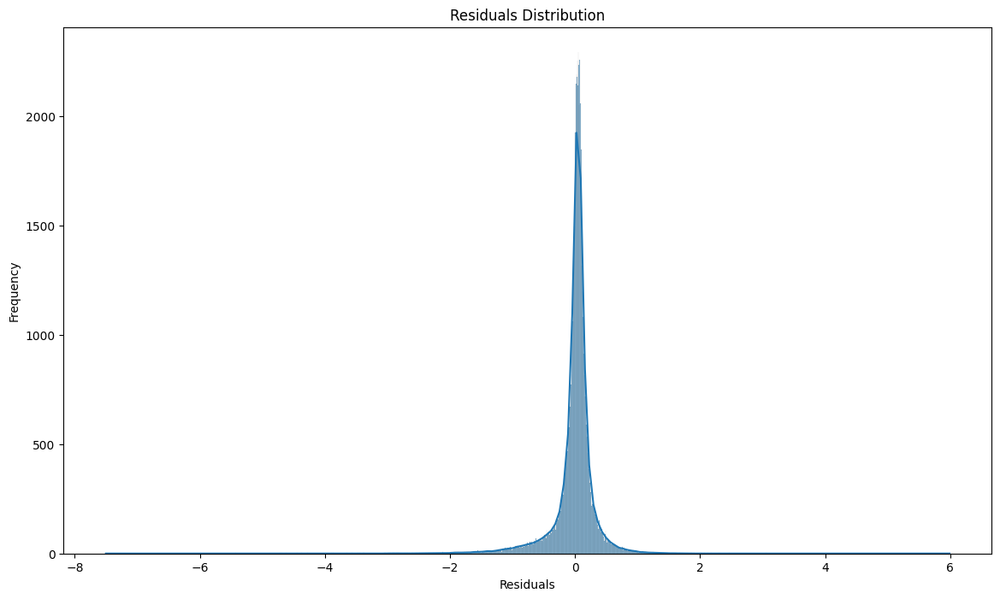

In [17]:
plot_error_distribution(residuals)

In [18]:
# prepare the prediction dataframe with household and testing data
lstm_pred_by_household = pd.DataFrame(np.hstack([y_pred.reshape(y_pred.shape[0], 1), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['y_pred', 'household_id', 'y_test'])
lstm_pred_by_household['household_id'] = lstm_pred_by_household['household_id'].astype('int8')

# prepare the household grp
lstm_hhgroup = lstm_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
lstm_metrics = lstm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'])).reset_index()
lstm_metrics['rmse'] = lstm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'], squared=False)).values
lstm_metrics['mae'] = lstm_hhgroup.apply(lambda x: mean_absolute_error(x['y_test'], x['y_pred'])).values
lstm_metrics['mape'] = lstm_hhgroup.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['y_pred'])).values
lstm_metrics['r2'] = lstm_hhgroup.apply(lambda x: r2_score(x['y_test'], x['y_pred'])).values
lstm_metrics['adjusted_r2'] = lstm_hhgroup.apply(lambda x: adjusted_r2(x['y_test'], x['y_pred'])).values
lstm_metrics = lstm_metrics.rename(columns={ 0: 'mse'})


<Figure size 1400x800 with 0 Axes>

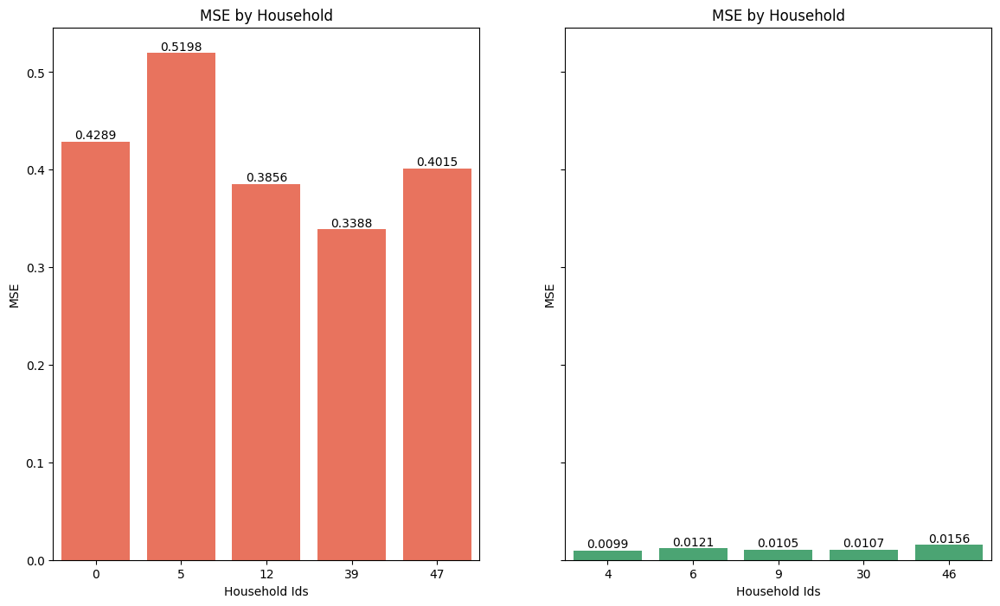

In [19]:
top5_metric = lstm_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = lstm_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

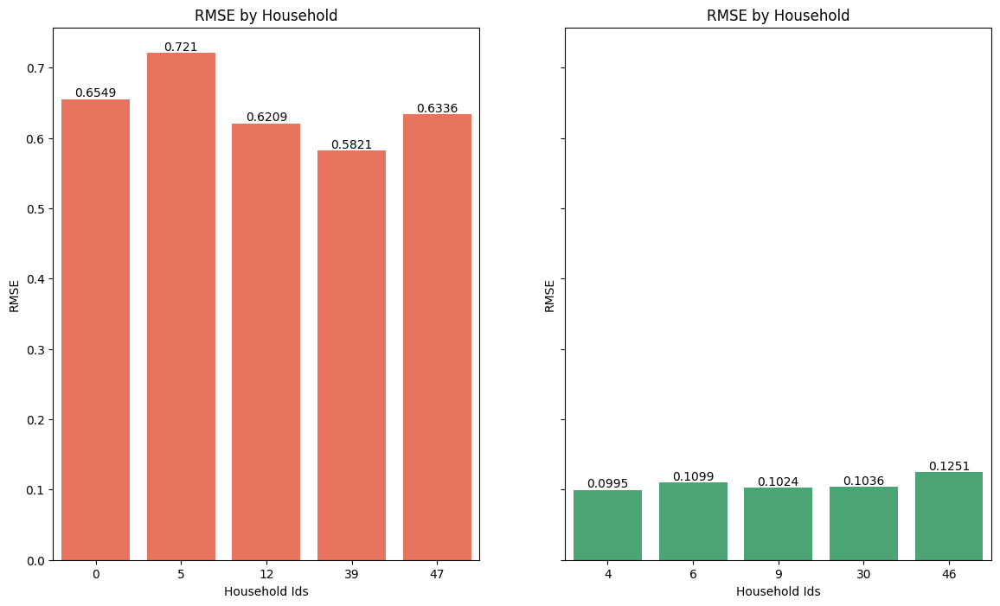

In [20]:
top5_metric = lstm_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = lstm_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

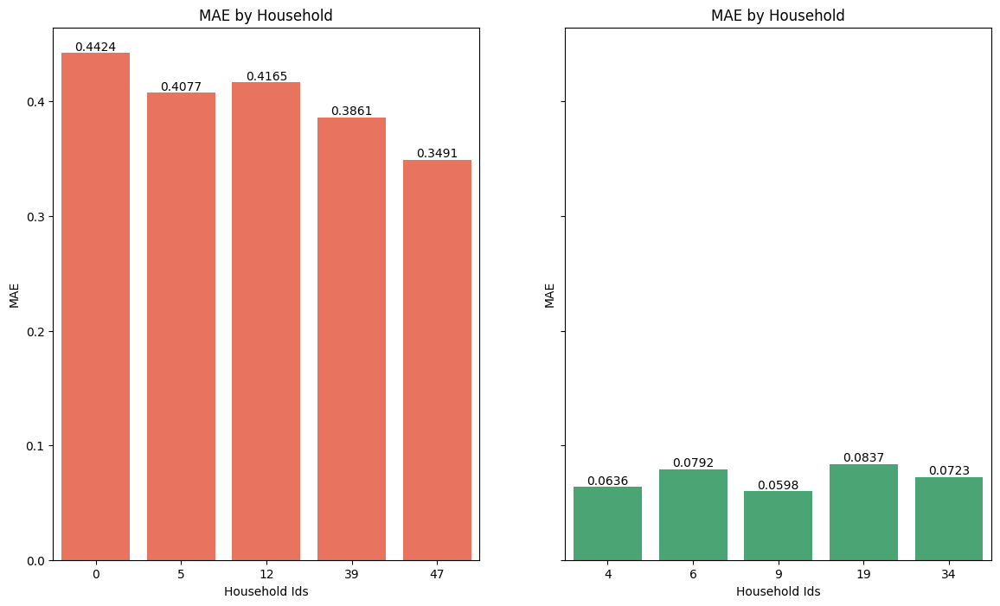

In [21]:
top5_metric = lstm_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = lstm_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

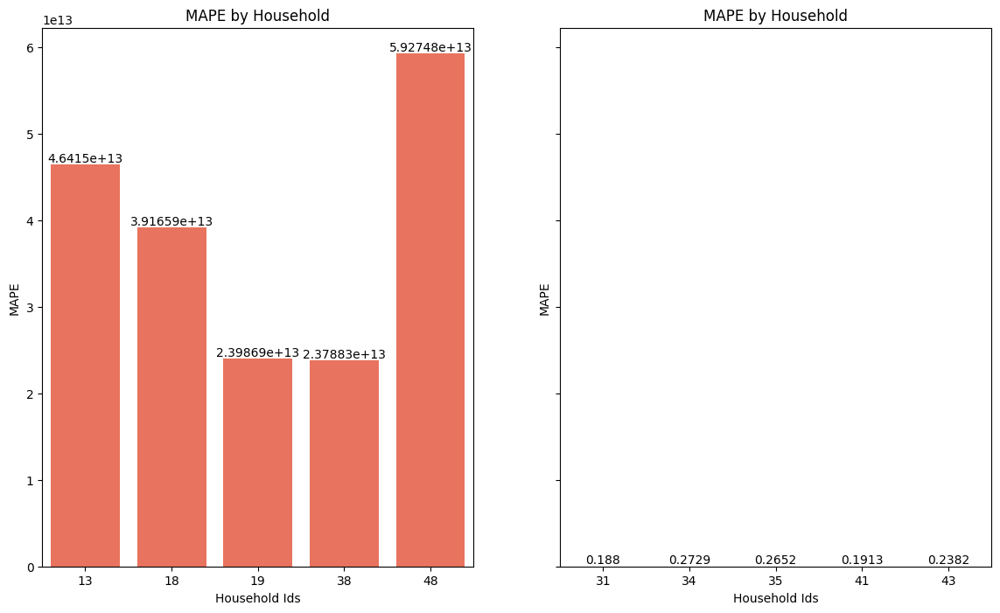

In [23]:
top5_metric = lstm_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = lstm_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

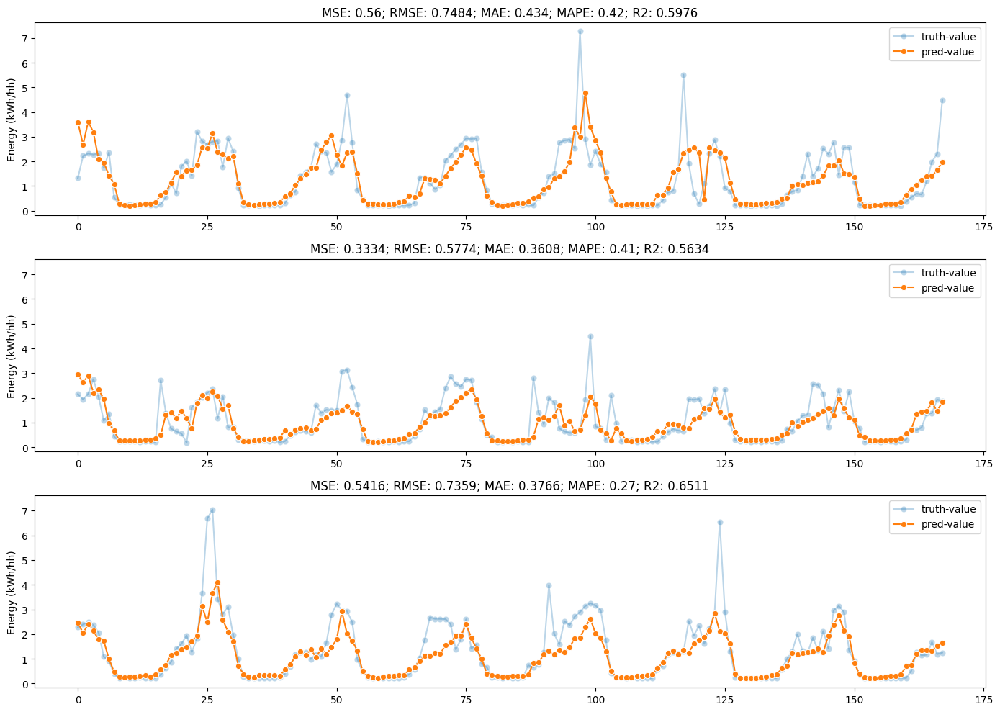

In [24]:
filtered_data = lstm_pred_by_household.loc[lstm_pred_by_household['household_id'] == 5]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

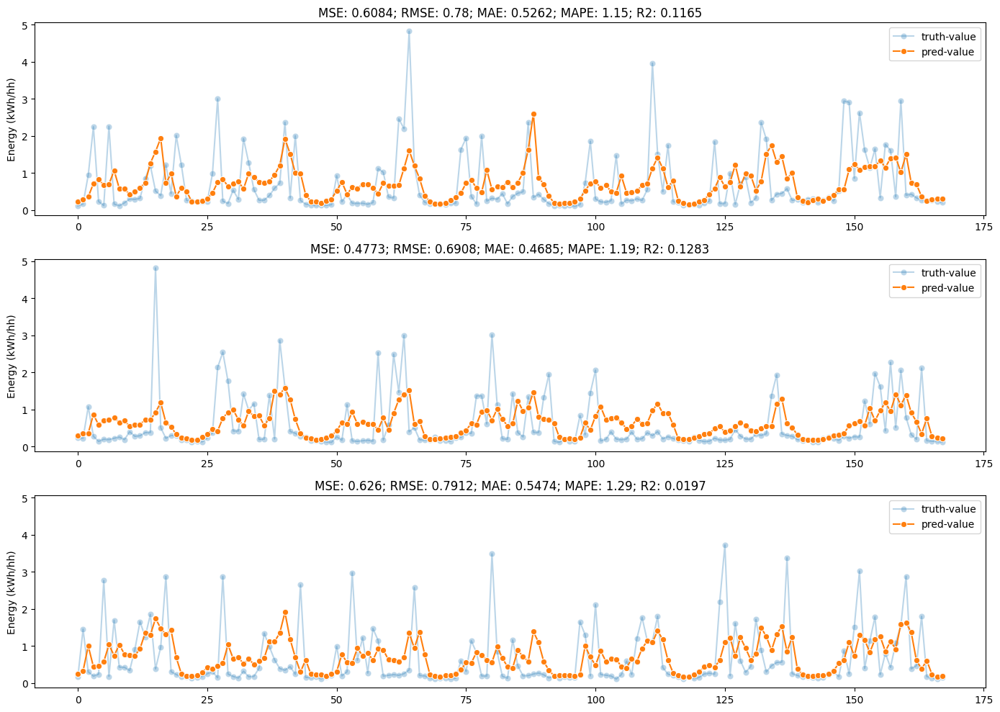

In [25]:
filtered_data = lstm_pred_by_household.loc[lstm_pred_by_household['household_id'] == 0]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

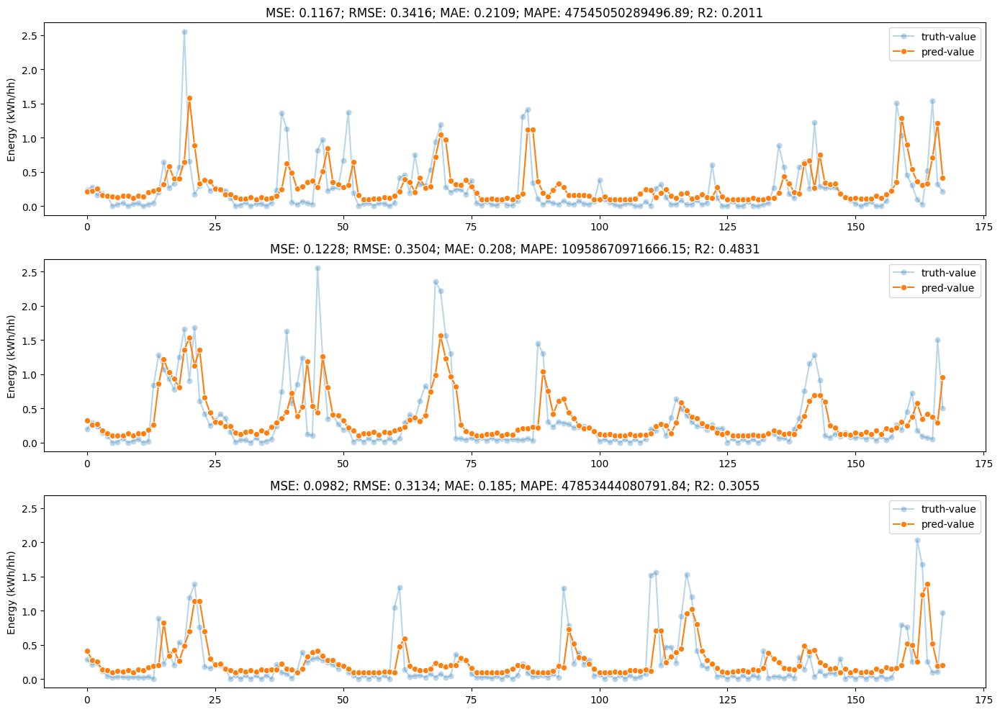

In [28]:
filtered_data = lstm_pred_by_household.loc[lstm_pred_by_household['household_id'] == 48]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

### CNN-LSTM

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Dense, LSTM, TimeDistributed, Conv1D, Dropout, Input
)

# for reproducibility
tf.random.set_seed(42)
tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_mse', patience=5, restore_best_weights=True)

input_layer = Input(shape=(1, X_train.shape[2]))
layer = Conv1D(200, kernel_size=1)(input_layer)
layer = LSTM(300, return_sequences=True)(layer)
layer = LSTM(300, return_sequences=True)(layer)
layer = Dropout(0.2)(layer)
layer = TimeDistributed(Dense(168, activation='relu', kernel_regularizer='l1'))(layer)
layer = TimeDistributed(Dense(64, activation='relu'))(layer)
output_layer = TimeDistributed(Dense(1))(layer)

model = Model(inputs=input_layer, outputs=output_layer)

model.compile(
    loss=tf.keras.losses.MSE,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=['mae', 'mse', 'mape']
)

history = model.fit(
    X_train,
    y_train,
    epochs=50,
    validation_data=(X_test, y_test),
    batch_size=504,
    callbacks=[earlystop]
)

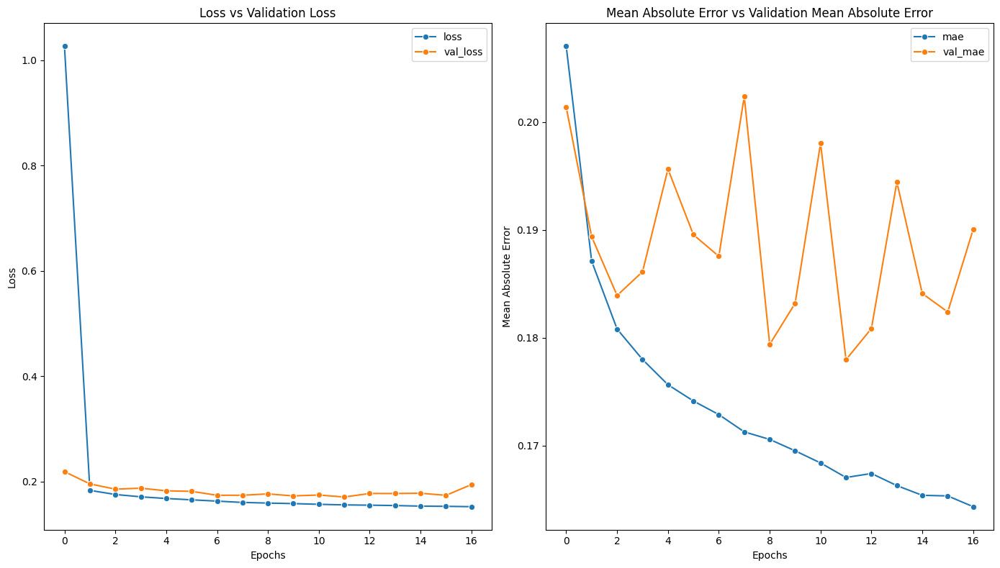

In [30]:
plot_training_metrics(history)

In [31]:
y_pred = model.predict(X_test)
residuals = calculate_error(y_pred.ravel(), y_test)

evaluate_model(y_pred, y_test, deep_learning=True)

2385/2385 [==============================] - 6s 2ms/step
RMSE: 0.3318305559817452
MSE: 0.11011151788315414
MAE: 0.17794369203257543
MAPE: 2592141137473.3906
R2 Score: 0.7346024497265664
Adjusted R2 Score: 0.734135617595605


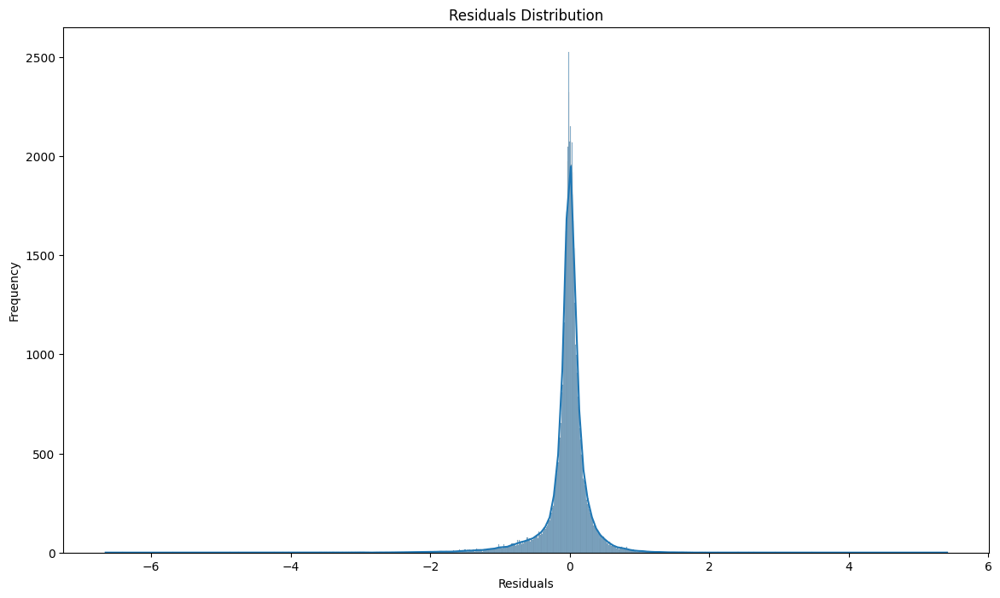

In [32]:
plot_error_distribution(residuals)

In [33]:
# prepare the prediction dataframe with household and testing data
cnnlstm_pred_by_household = pd.DataFrame(np.hstack([y_pred.reshape(y_pred.shape[0], 1), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['y_pred', 'household_id', 'y_test'])
cnnlstm_pred_by_household['household_id'] = cnnlstm_pred_by_household['household_id'].astype('int8')

# prepare the household grp
cnnlstm_hhgroup = cnnlstm_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
cnnlstm_metrics = cnnlstm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'])).reset_index()
cnnlstm_metrics['rmse'] = cnnlstm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['y_pred'], squared=False)).values
cnnlstm_metrics['mae'] = cnnlstm_hhgroup.apply(lambda x: mean_absolute_error(x['y_test'], x['y_pred'])).values
cnnlstm_metrics['mape'] = cnnlstm_hhgroup.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['y_pred'])).values
cnnlstm_metrics['r2'] = cnnlstm_hhgroup.apply(lambda x: r2_score(x['y_test'], x['y_pred'])).values
cnnlstm_metrics['adjusted_r2'] = cnnlstm_hhgroup.apply(lambda x: adjusted_r2(x['y_test'], x['y_pred'])).values
cnnlstm_metrics = cnnlstm_metrics.rename(columns={ 0: 'mse'})


<Figure size 1400x800 with 0 Axes>

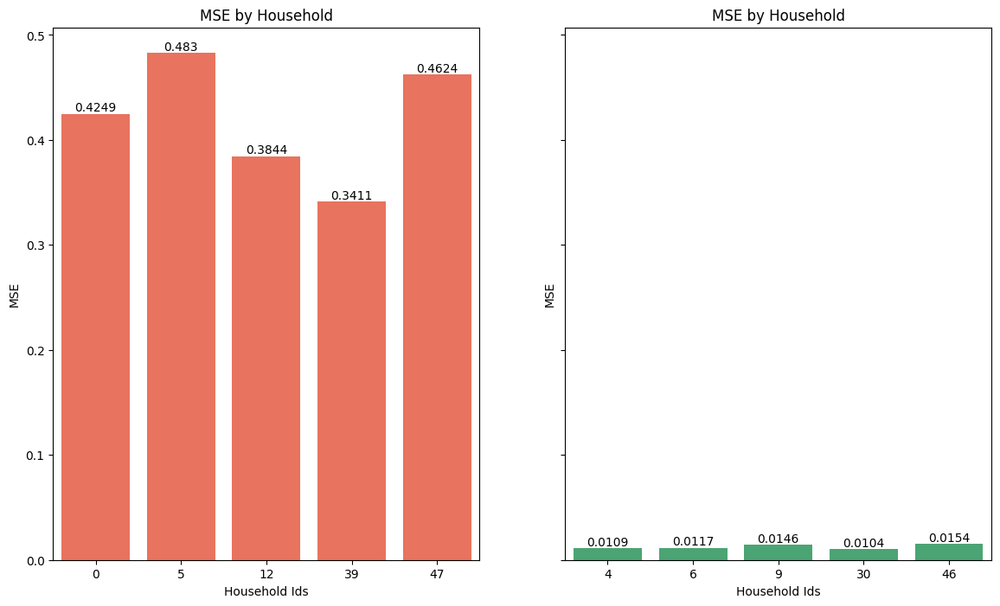

In [34]:
top5_metric = cnnlstm_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = cnnlstm_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

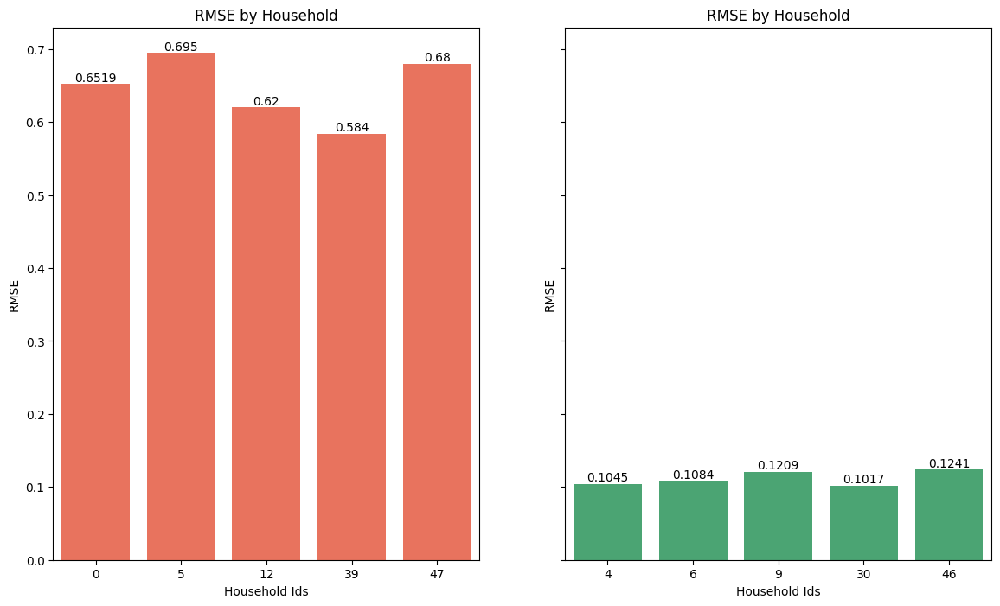

In [35]:
top5_metric = cnnlstm_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = cnnlstm_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

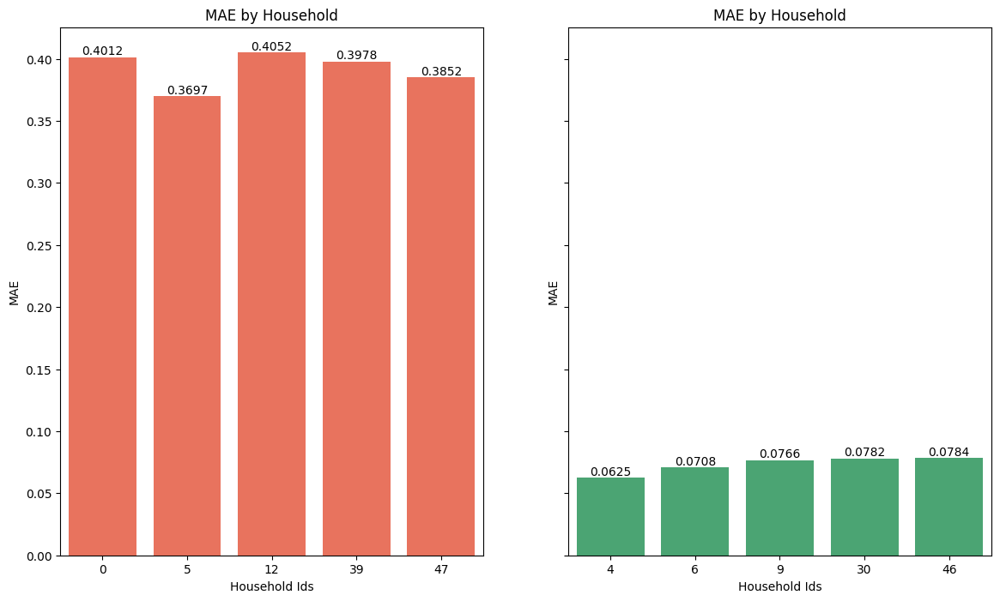

In [36]:
top5_metric = cnnlstm_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = cnnlstm_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

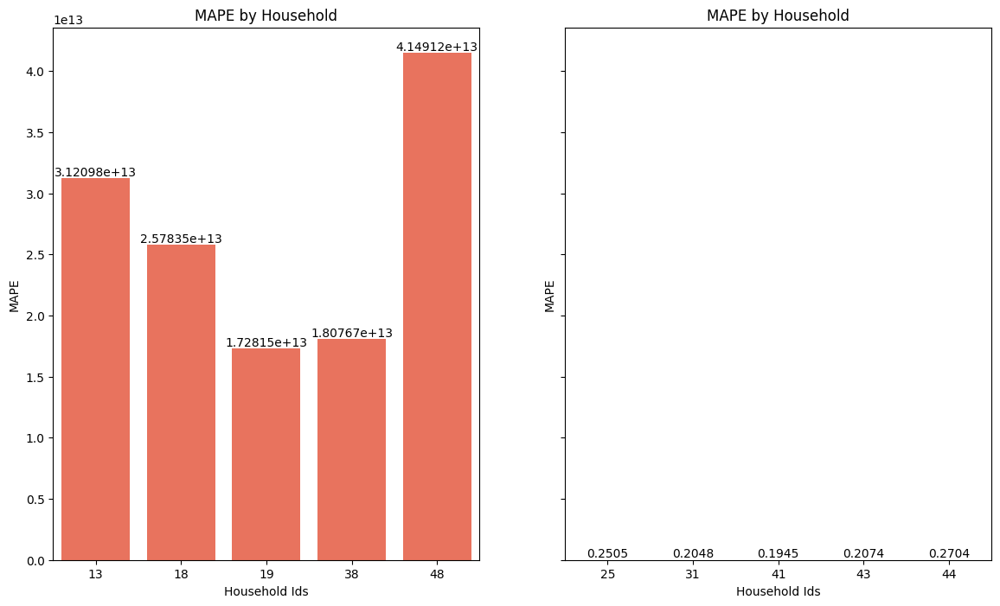

In [37]:
top5_metric = cnnlstm_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = cnnlstm_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

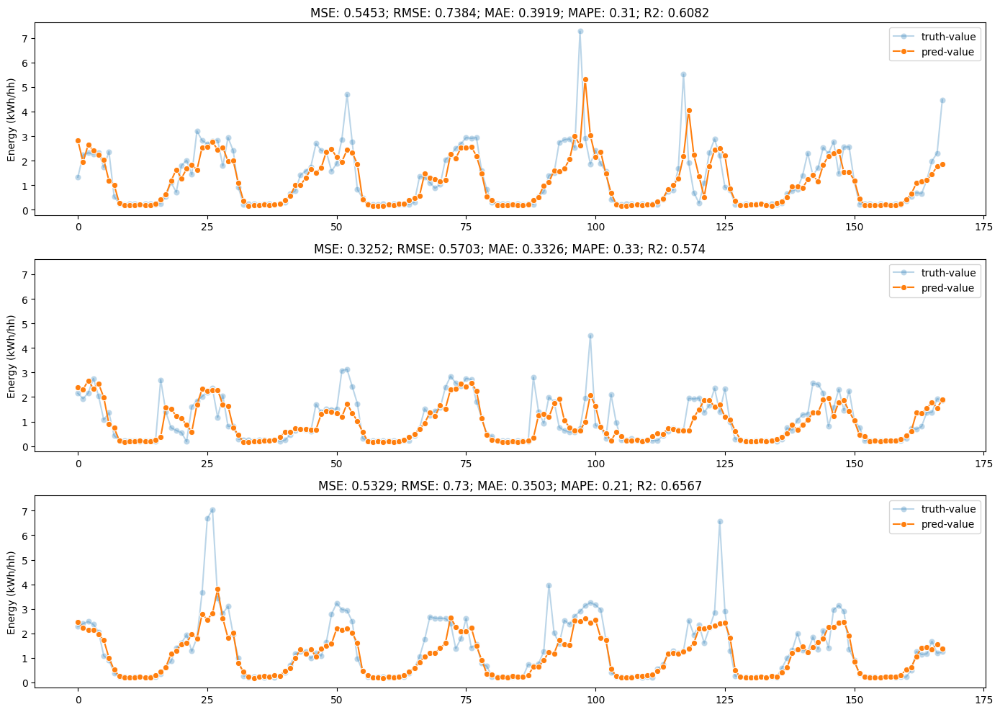

In [38]:
filtered_data = cnnlstm_pred_by_household.loc[cnnlstm_pred_by_household['household_id'] == 5]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

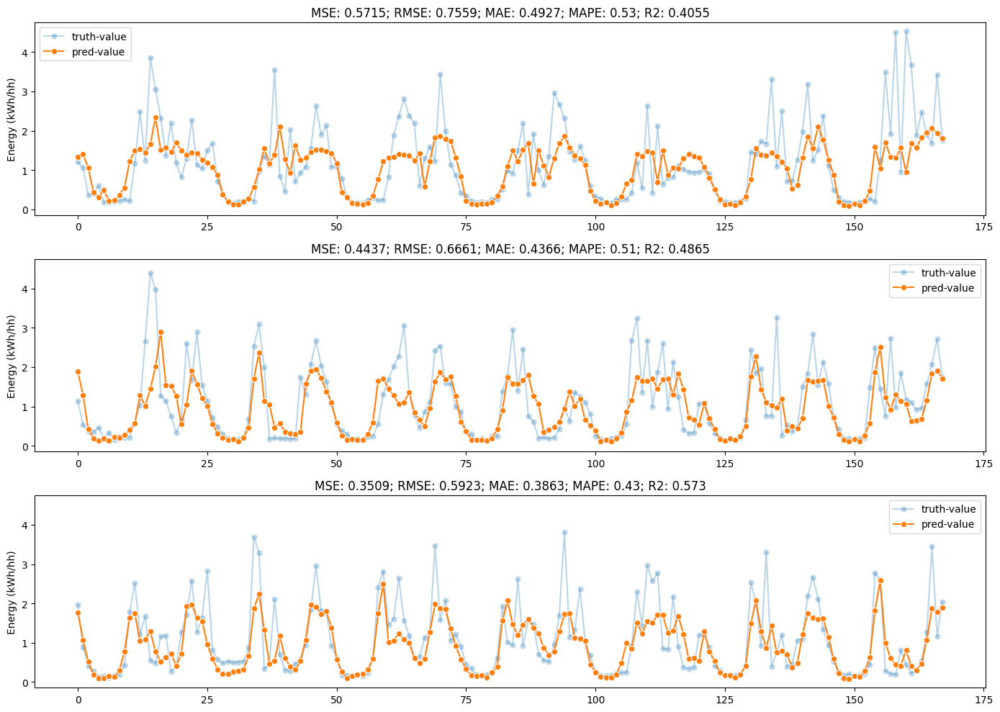

In [39]:
filtered_data = cnnlstm_pred_by_household.loc[cnnlstm_pred_by_household['household_id'] == 12]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

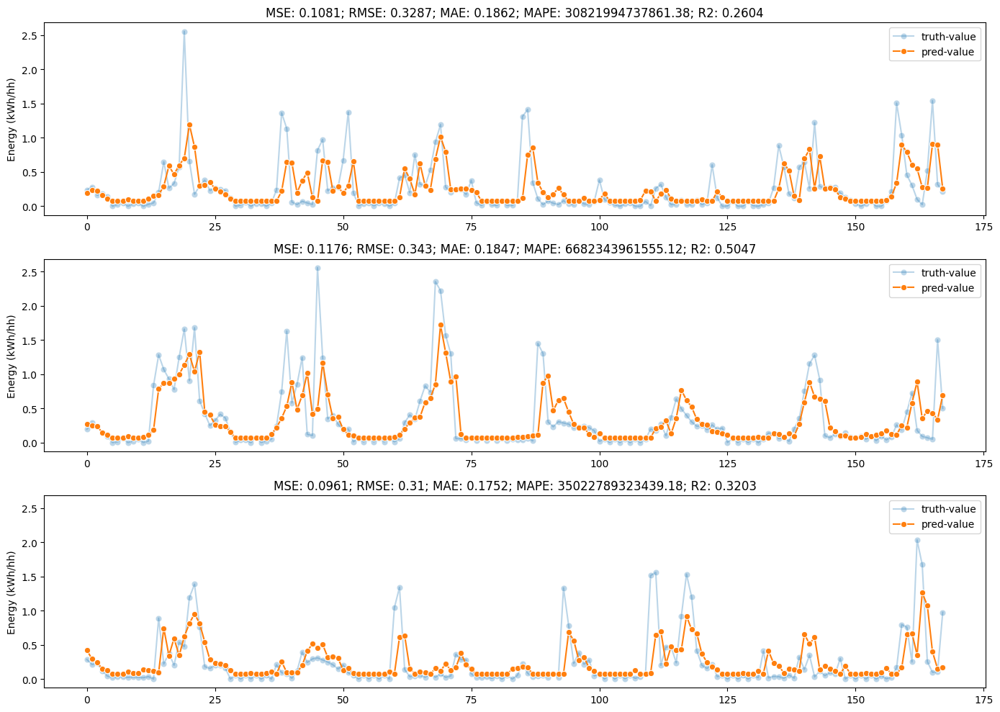

In [41]:
filtered_data = cnnlstm_pred_by_household.loc[cnnlstm_pred_by_household['household_id'] == 48]
plot_forecast(filtered_data['y_pred'], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

## Probabilistic Approach

In [14]:
from sklearn.metrics import (
   mean_absolute_percentage_error, 
   mean_absolute_error, 
   mean_squared_error, 
   r2_score,
   mean_pinball_loss
)

def adjusted_r2(y_pred, y_test):
   p = X_train.shape[1]
   r2 = r2_score(y_pred, y_test)
   n = y_test.shape[0]
   
   adjusted_coefficient = 1 - (1 - r2) * (n - 1) / (n - p - 1)

   return adjusted_coefficient

def evaluate_model(y_pred, y_test):
  """
    Evaluate the model predictions with all the regression metrics
  """

  print("RMSE:", mean_squared_error(y_test, y_pred['pred_0.5'], squared=False))
  print("MSE:", mean_squared_error(y_test, y_pred['pred_0.5'], squared=True))
  print("MAE:", mean_absolute_error(y_test, y_pred['pred_0.5']))
  print("MAPE:", mean_absolute_percentage_error(y_test, y_pred['pred_0.5']))
  print("R2 Score:", r2_score(y_test, y_pred['pred_0.5']))
  print("Adjusted R2 Score:", adjusted_r2(y_test, y_pred['pred_0.5']))

  print("Pinball loss with alpha 0.1:", mean_pinball_loss(y_test, y_pred['pred_0.1'], alpha=0.1))
  print("Pinball loss with alpha 0.3:", mean_pinball_loss(y_test, y_pred['pred_0.3'], alpha=0.3))
  print("Pinball loss with alpha 0.5:", mean_pinball_loss(y_test, y_pred['pred_0.5'], alpha=0.5))
  print("Pinball loss with alpha 0.7:", mean_pinball_loss(y_test, y_pred['pred_0.7'], alpha=0.7))
  print("Pinball loss with alpha 0.9:", mean_pinball_loss(y_test, y_pred['pred_0.9'], alpha=0.9))

def plot_forecast(y_pred, y_test, number_of_slices=3, steps=168, skip=0):
    """
      Plot the forecasted values against the truth values for LSTM and CNN-LSTM
    """
    fig, axes = plt.subplots(number_of_slices, 1, sharey=True, figsize=(14, 10))
    timesteps = np.arange(0, steps)
    
    for i in range(number_of_slices):
        start_idx = 0 + (steps * i) + (skip)
        end_idx = steps * (1 + i) + (skip)
        sampled_test = y_test.iloc[start_idx:end_idx]
        sampled_pred = y_pred.iloc[start_idx:end_idx]

        mse = round(mean_squared_error(sampled_test, sampled_pred['pred_0.5']), 4)
        rmse = round(mean_squared_error(sampled_test, sampled_pred['pred_0.5'], squared=False), 4)
        mae = round(mean_absolute_error(sampled_test, sampled_pred['pred_0.5']), 4)
        mape = round(mean_absolute_percentage_error(sampled_test, sampled_pred['pred_0.5']), 2)
        r2 = round(r2_score(sampled_test, sampled_pred['pred_0.5']), 4)
        mape = round(mean_absolute_percentage_error(sampled_test, sampled_pred['pred_0.5']), 2)
        
        sns.lineplot(x=timesteps, y=sampled_test, label="truth-value", marker='o', alpha=0.3, ax=axes[i])
        sns.lineplot(x=timesteps, y=sampled_pred['pred_0.5'], label="forecasted-median", marker='o', ax=axes[i])
        axes[i].fill_between(x=timesteps, y1=sampled_pred['pred_0.1'], y2=sampled_pred['pred_0.9'], alpha=0.1, color='blue', label="10th-90th")
        axes[i].fill_between(x=timesteps, y1=sampled_pred['pred_0.3'], y2=sampled_pred['pred_0.7'], alpha=0.15, color='blue', label="30th-70th")
        axes[i].set_title(f'MSE: {mse}; RMSE: {rmse}; MAE: {mae}; MAPE: {mape}; R2: {r2}')
        axes[i].legend()

    plt.tight_layout()
    plt.show()
    

### Quantile-XGBoost

In [12]:
from xgboost import XGBRegressor

# reshape back to the original shape for XGBoost
ml_train = X_train.reshape(X_train.shape[0], X_train.shape[2]) 
ml_test = X_test.reshape(X_test.shape[0], X_test.shape[2])

alphas = [0.1, 0.3, 0.5, 0.7, 0.9]
hyperparams = {"learning_rate": 0.03, "max_depth": 9, "n_estimators": 1000, "reg_alpha": 0.7}
quantile_xgb = XGBRegressor(objective='reg:quantileerror', random_state=42, n_jobs=5, quantile_alpha=alphas, **hyperparams) # uses 5 CPU cores
quantile_xgb.fit(ml_train, y_train)

y_pred = quantile_xgb.predict(ml_test)
y_pred = pd.DataFrame(y_pred, columns=['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9'])


In [15]:
evaluate_model(y_pred, y_test)

RMSE: 0.3598358227996341
MSE: 0.12948181936988967
MAE: 0.1624531048622687
MAPE: 1264087477273.2043
R2 Score: 0.6879149581592201
Adjusted R2 Score: 0.687910868619537
Pinball loss with alpha 0.1: 0.027838959158940683
Pinball loss with alpha 0.3: 0.06279721542462897
Pinball loss with alpha 0.5: 0.08122655243113434
Pinball loss with alpha 0.7: 0.08376790136964037
Pinball loss with alpha 0.9: 0.05490670434525241


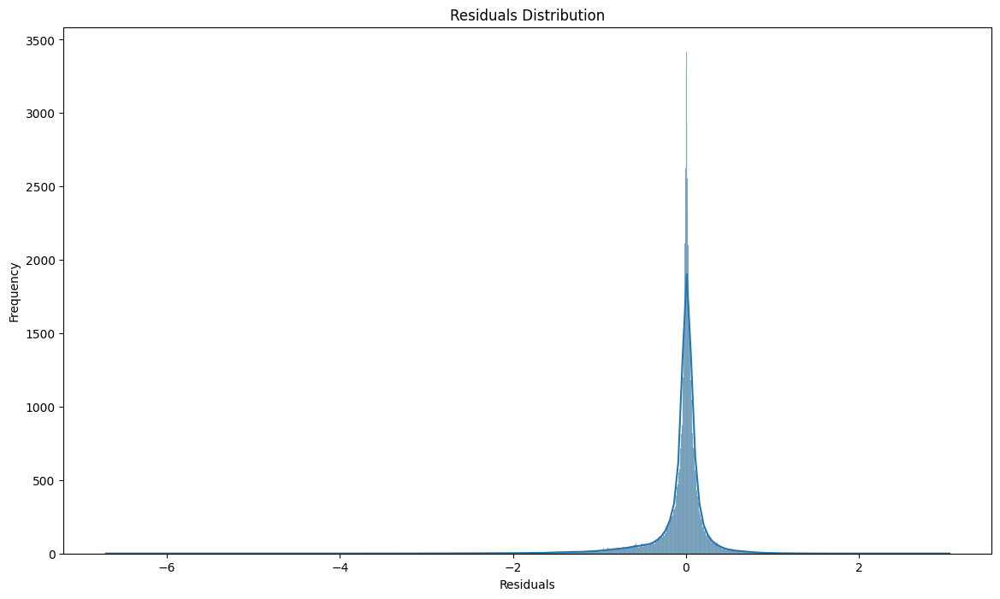

In [18]:
residuals = calculate_error(y_pred['pred_0.5'], y_test.reset_index()['energy(kWh/hh)'])

plot_error_distribution(residuals)

In [19]:
# prepare the prediction dataframe with household and testing data
quantile_xgb_pred_by_household = pd.DataFrame(np.hstack([y_pred.values.reshape(-1, 5), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9', 'household_id', 'y_test'])
quantile_xgb_pred_by_household['household_id'] = quantile_xgb_pred_by_household['household_id'].astype('int8')

# prepare the household grp
quantile_xgb_hhgroup = quantile_xgb_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
quantile_xgb_metrics = quantile_xgb_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'])).reset_index()
quantile_xgb_metrics['rmse'] = quantile_xgb_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'], squared=False)).values
quantile_xgb_metrics['mae'] = quantile_xgb_hhgroup.apply(lambda x: mean_absolute_error(x['y_test'], x['pred_0.5'])).values
quantile_xgb_metrics['mape'] = quantile_xgb_hhgroup.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['pred_0.5'])).values
quantile_xgb_metrics['r2'] = quantile_xgb_hhgroup.apply(lambda x: r2_score(x['y_test'], x['pred_0.5'])).values
quantile_xgb_metrics['adjusted_r2'] = quantile_xgb_hhgroup.apply(lambda x: adjusted_r2(x['y_test'], x['pred_0.5'])).values
quantile_xgb_metrics = quantile_xgb_metrics.rename(columns={ 0: 'mse'})

# pinball losses
quantile_xgb_metrics['pinball_0.1'] = quantile_xgb_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.1'], alpha=0.1)).values
quantile_xgb_metrics['pinball_0.3'] = quantile_xgb_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.3'], alpha=0.3)).values
quantile_xgb_metrics['pinball_0.5'] = quantile_xgb_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.5'], alpha=0.5)).values
quantile_xgb_metrics['pinball_0.7'] = quantile_xgb_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.7'], alpha=0.7)).values
quantile_xgb_metrics['pinball_0.9'] = quantile_xgb_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.9'], alpha=0.9)).values


<Figure size 1400x800 with 0 Axes>

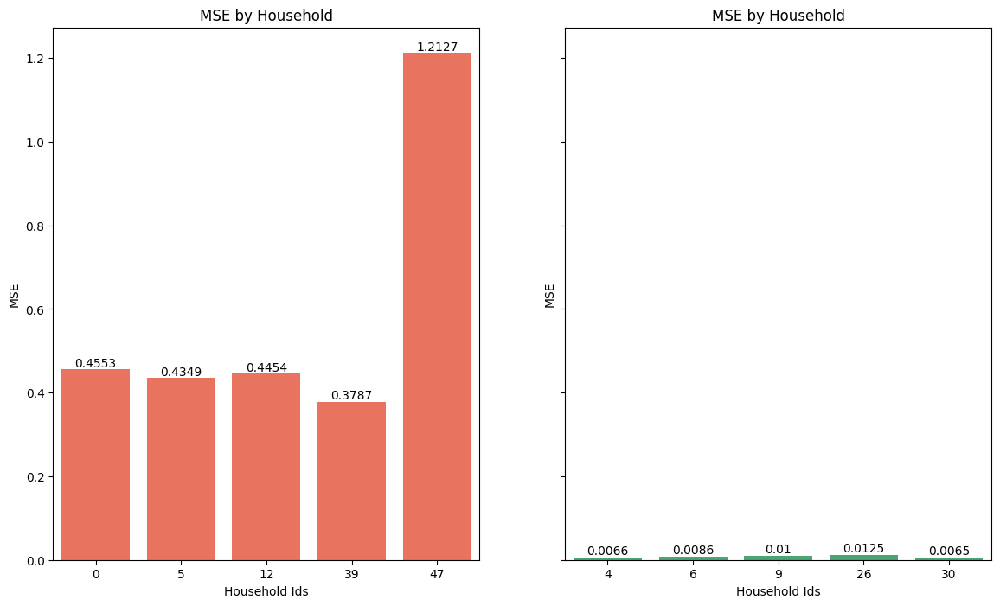

In [21]:
top5_metric = quantile_xgb_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

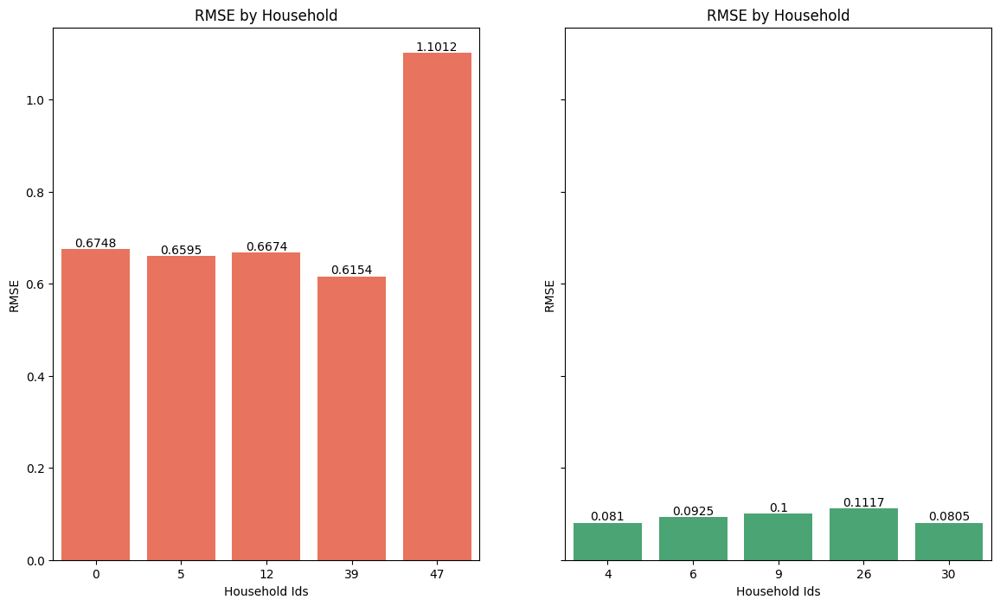

In [22]:
top5_metric = quantile_xgb_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

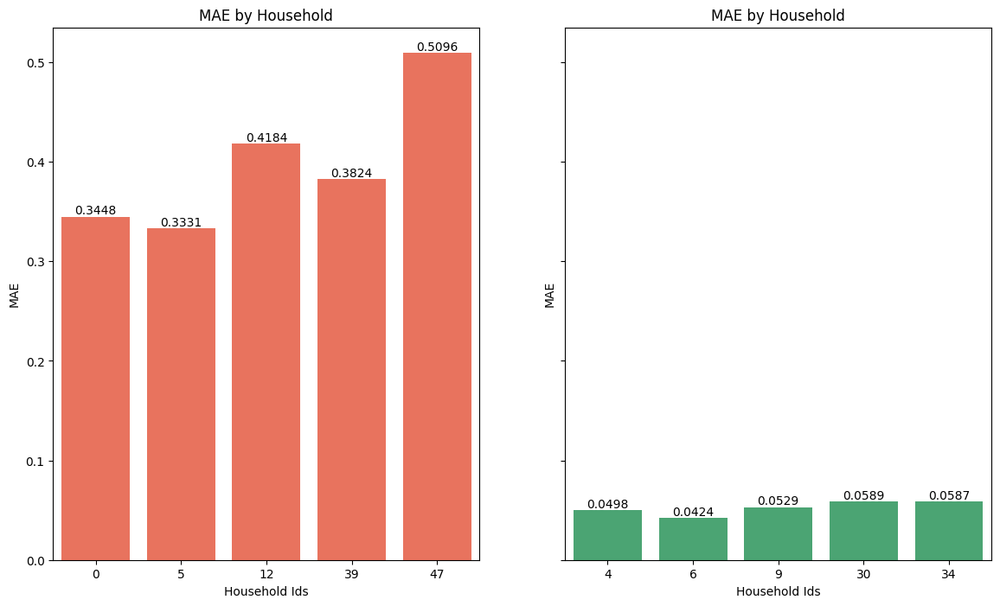

In [23]:
top5_metric = quantile_xgb_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

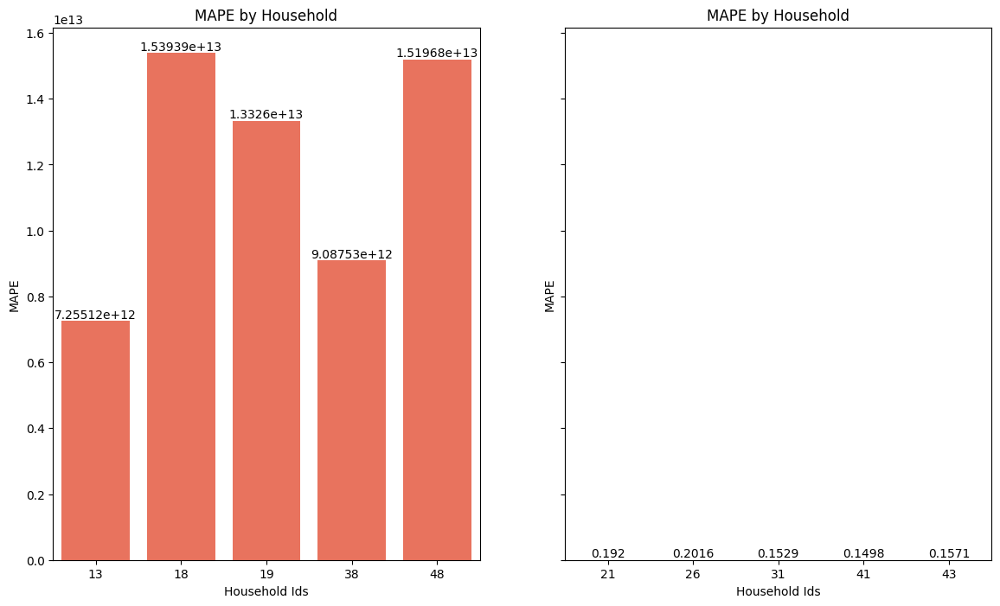

In [24]:
top5_metric = quantile_xgb_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

<Figure size 1400x800 with 0 Axes>

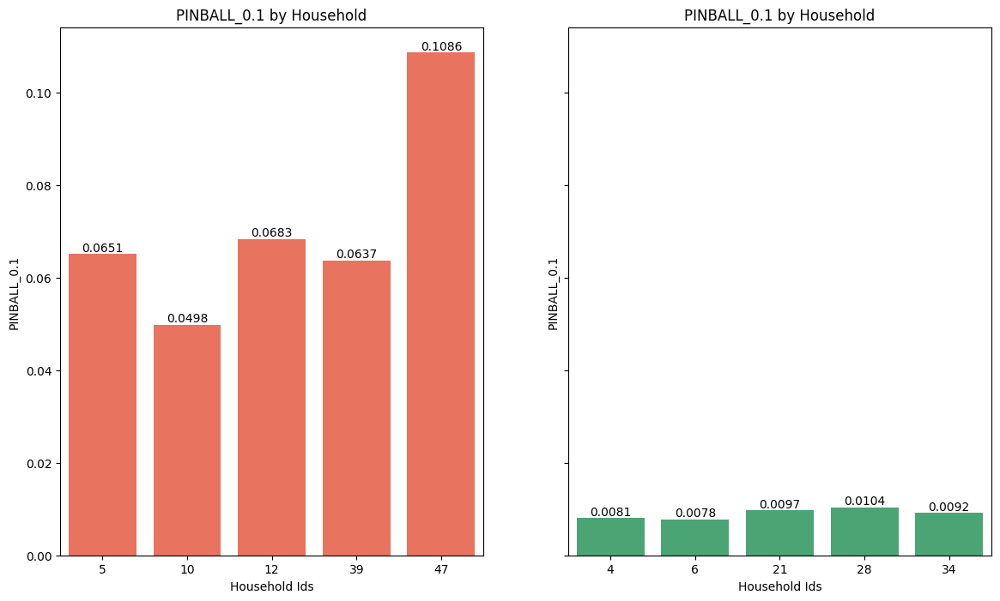

In [25]:
top5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.1', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.1', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.1')

<Figure size 1400x800 with 0 Axes>

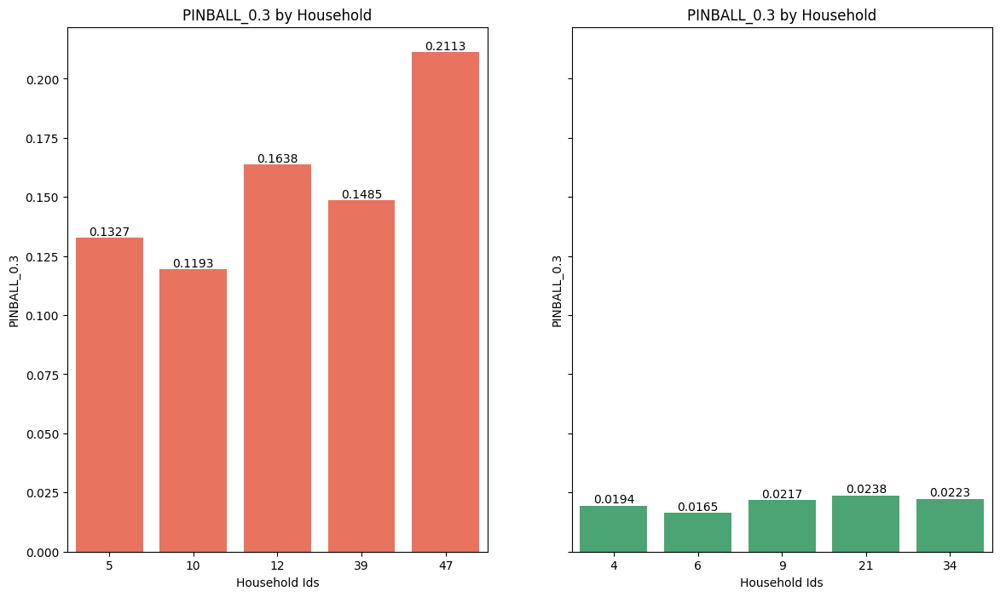

In [26]:
top5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.3', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.3', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.3')

<Figure size 1400x800 with 0 Axes>

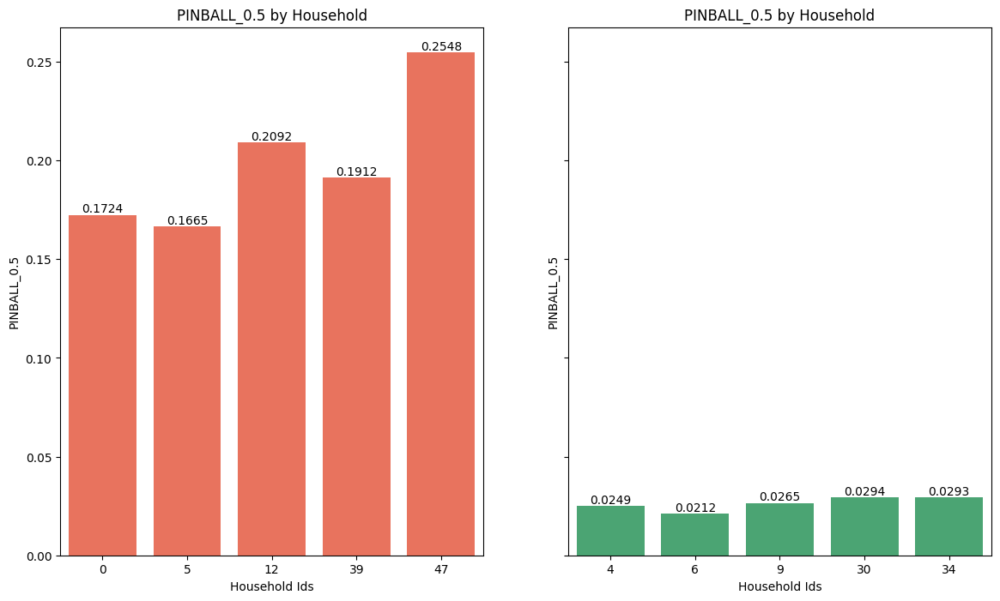

In [28]:
top5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.5', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.5', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.5')

<Figure size 1400x800 with 0 Axes>

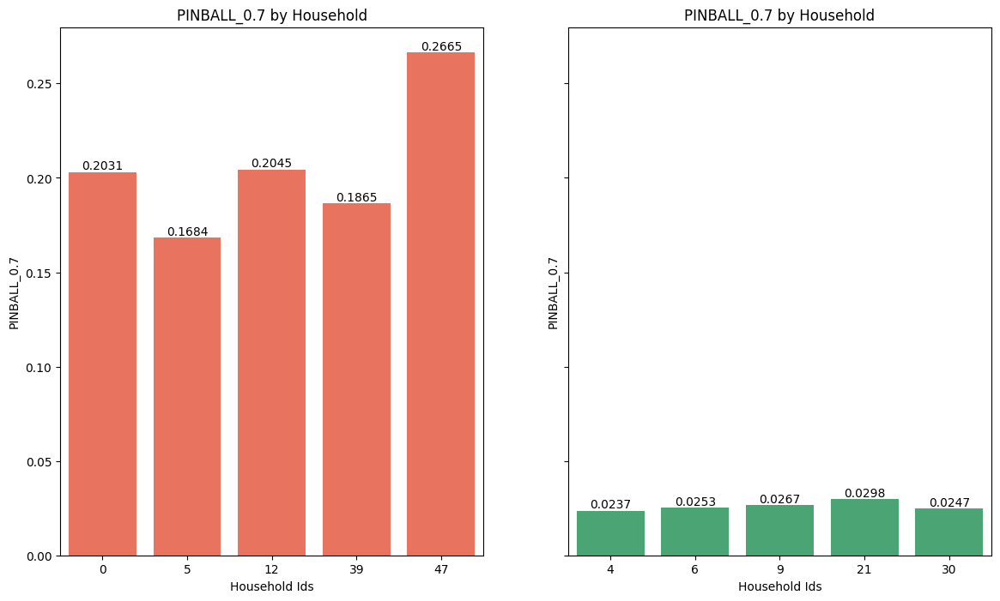

In [29]:
top5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.7', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.7', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.7')

<Figure size 1400x800 with 0 Axes>

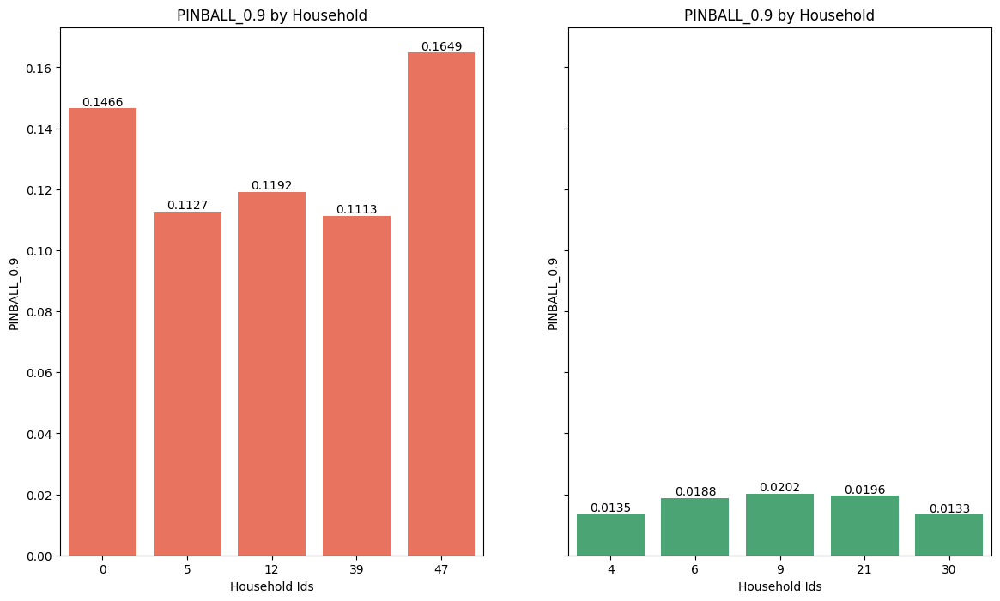

In [30]:
top5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.9', ascending=False).head(5)
bottom5_metric = quantile_xgb_metrics.sort_values(by='pinball_0.9', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.9')

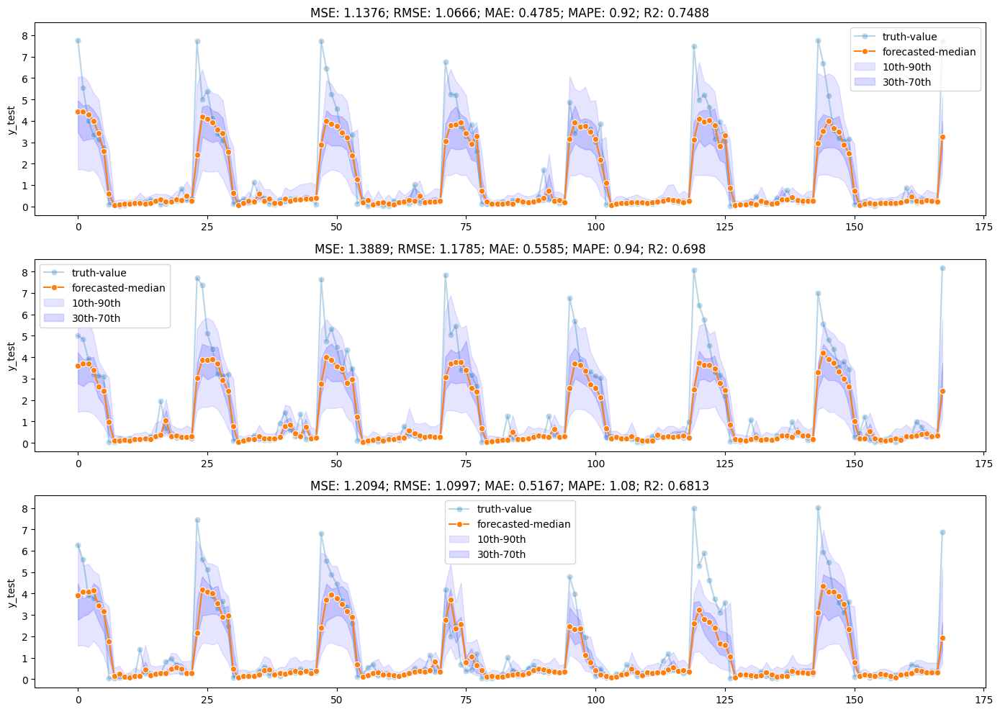

In [31]:
filtered_data = quantile_xgb_pred_by_household.loc[quantile_xgb_pred_by_household['household_id'] == 47]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

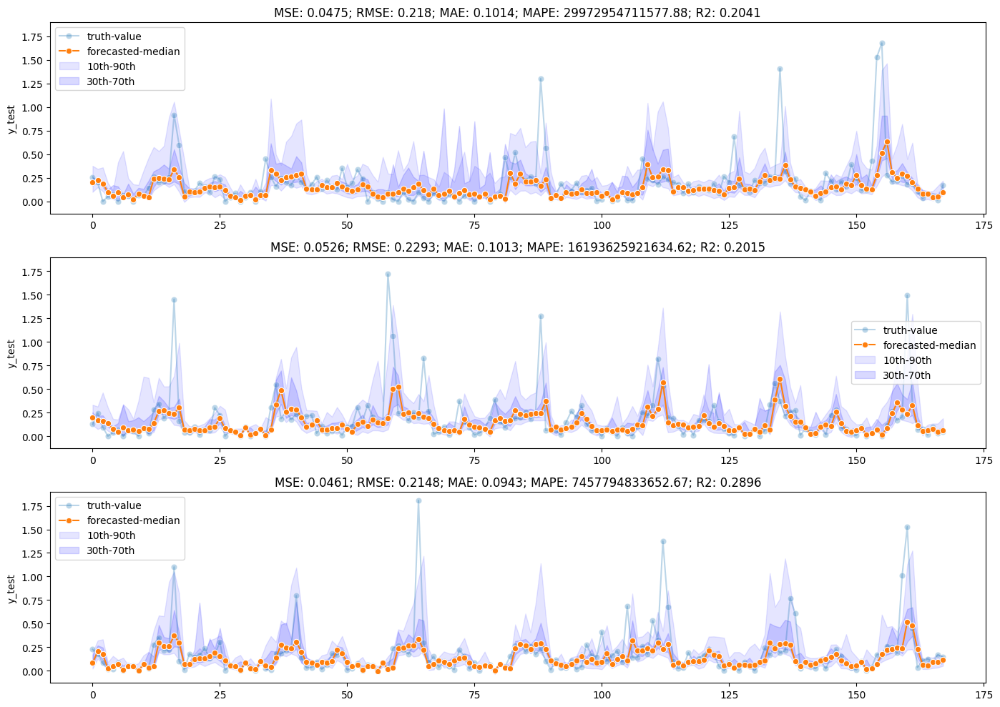

In [32]:
filtered_data = quantile_xgb_pred_by_household.loc[quantile_xgb_pred_by_household['household_id'] == 18]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

### Quantile-LightGBM

In [43]:
from lightgbm import LGBMRegressor
from sklearn.metrics import (
  mean_absolute_percentage_error, 
  mean_absolute_error, 
  mean_squared_error, 
  r2_score,
  mean_pinball_loss
)

class QuantileLightGBM:
  def __init__(self, alphas=[0.1, 0.3, 0.5, 0.7, 0.9], **keyword_args):
    self.models = {}
    self.alphas = alphas
    self.hyperparams = keyword_args

  def fit(self, X_train, y_train):
    # train respective models for each quantile
    for alpha in self.alphas:
      model = LGBMRegressor(
        random_state=42, 
        objective='quantile', 
        alpha=alpha,
        n_jobs=5, # use 5 CPU cores
        **self.hyperparams
      )
      
      # fit the model
      model.fit(X_train, y_train)
      self.models[f'model_{str(alpha)}'] = model # save the model

  def predict(self, X_test):
    y_pred = {}
    for i in range(len(self.alphas)):
      alpha = self.alphas[i]
      model = self.models[f'model_{str(alpha)}']
      y_pred[f'pred_{str(alpha)}'] = model.predict(X_test)

    return pd.DataFrame(y_pred)
  
  def evaluate(self, X_test, y_test):
      y_pred = self.predict(X_test)

      # point metrics
      mape = mean_absolute_percentage_error(y_test, y_pred['pred_0.5'])
      mae = mean_absolute_error(y_test, y_pred['pred_0.5'])
      mse = mean_squared_error(y_test, y_pred['pred_0.5'])
      rmse = mean_squared_error(y_test, y_pred['pred_0.5'], squared=False)
      r2 = r2_score(y_test, y_pred['pred_0.5'])
      adj_r2 = adjusted_r2(y_test, y_pred['pred_0.5'])

      # quantile loss
      loss_10 = mean_pinball_loss(y_test, y_pred['pred_0.1'], alpha=0.1)
      loss_30 = mean_pinball_loss(y_test, y_pred['pred_0.3'], alpha=0.3)
      loss_50 = mean_pinball_loss(y_test, y_pred['pred_0.5'], alpha=0.5)
      loss_70 = mean_pinball_loss(y_test, y_pred['pred_0.7'], alpha=0.7)
      loss_90 = mean_pinball_loss(y_test, y_pred['pred_0.9'], alpha=0.9)

      return {
        'mape': mape, 'mse': mse, 'rmse': rmse,
        'mae': mae, 'r2': r2, 'adjusted_r2': adj_r2,
        'pinball_loss_10': loss_10, 'pinball_loss_30': loss_30, 'pinball_loss_50': loss_50,
        'pinball_loss_70': loss_70, 'pinball_loss_90': loss_90
      }

In [45]:
# reshape back to the original shape for LightGBM
ml_train = X_train.reshape(X_train.shape[0], X_train.shape[2]) 
ml_test = X_test.reshape(X_test.shape[0], X_test.shape[2])

alphas = [0.1, 0.3, 0.5, 0.7, 0.9]
hyperparameters = {"learning_rate": 0.03, "max_depth": 10, "n_estimators": 1000, "reg_alpha": 0.5}
lgbm_model = QuantileLightGBM(alphas=alphas, **hyperparameters)
lgbm_model.fit(ml_train, y_train)

y_pred = lgbm_model.predict(ml_test)
evaluate_model(y_pred, y_test)

RMSE: 0.36790595402570164
MSE: 0.1353547910075617
MAE: 0.16787311773461688
MAPE: 1059490602171.1047
R2 Score: 0.6737595608363214
Adjusted R2 Score: 0.6737552858053415
Pinball loss with alpha 0.1: 0.028465782989460578
Pinball loss with alpha 0.3: 0.06437942925006283
Pinball loss with alpha 0.5: 0.08393655886730844
Pinball loss with alpha 0.7: 0.08574723115995007
Pinball loss with alpha 0.9: 0.05551812571630438


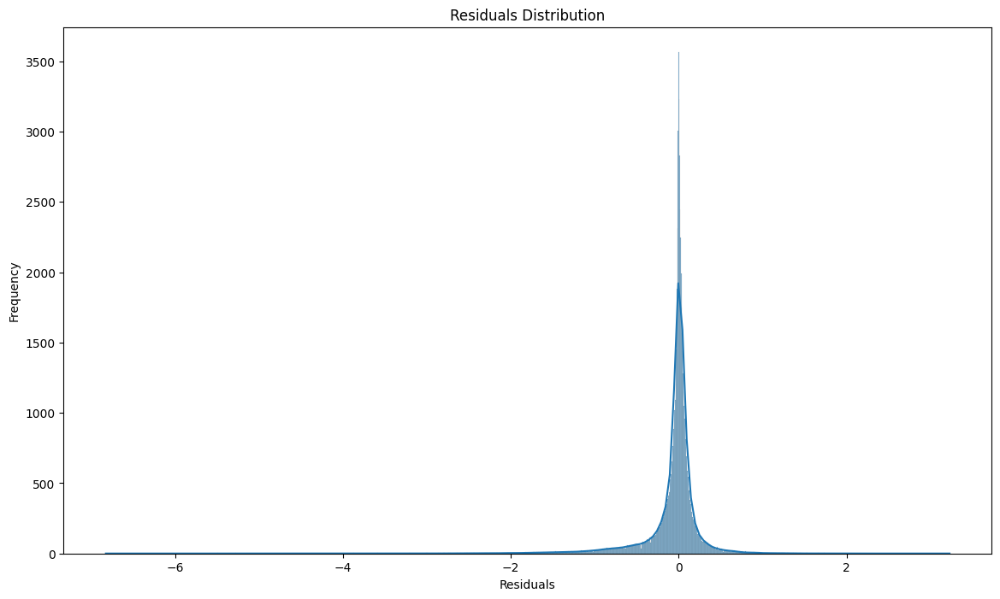

In [83]:
residuals = calculate_error(y_pred['pred_0.5'], y_test.reset_index()['energy(kWh/hh)'])

plot_error_distribution(residuals)

In [46]:
# prepare the prediction dataframe with household and testing data
quantile_lightgbm_pred_by_household = pd.DataFrame(np.hstack([y_pred.values.reshape(-1, 5), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9', 'household_id', 'y_test'])
quantile_lightgbm_pred_by_household['household_id'] = quantile_lightgbm_pred_by_household['household_id'].astype('int8')

# prepare the household grp
quantile_lightgbm_hhgroup = quantile_lightgbm_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
quantile_lightgbm_metrics = quantile_lightgbm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'])).reset_index()
quantile_lightgbm_metrics['rmse'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'], squared=False)).values
quantile_lightgbm_metrics['mae'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_absolute_error(x['y_test'], x['pred_0.5'])).values
quantile_lightgbm_metrics['mape'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['pred_0.5'])).values
quantile_lightgbm_metrics['r2'] = quantile_lightgbm_hhgroup.apply(lambda x: r2_score(x['y_test'], x['pred_0.5'])).values
quantile_lightgbm_metrics['adjusted_r2'] = quantile_lightgbm_hhgroup.apply(lambda x: adjusted_r2(x['y_test'], x['pred_0.5'])).values
quantile_lightgbm_metrics = quantile_lightgbm_metrics.rename(columns={ 0: 'mse'})

# pinball losses
quantile_lightgbm_metrics['pinball_0.1'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.1'], alpha=0.1)).values
quantile_lightgbm_metrics['pinball_0.3'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.3'], alpha=0.3)).values
quantile_lightgbm_metrics['pinball_0.5'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.5'], alpha=0.5)).values
quantile_lightgbm_metrics['pinball_0.7'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.7'], alpha=0.7)).values
quantile_lightgbm_metrics['pinball_0.9'] = quantile_lightgbm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.9'], alpha=0.9)).values


<Figure size 1400x800 with 0 Axes>

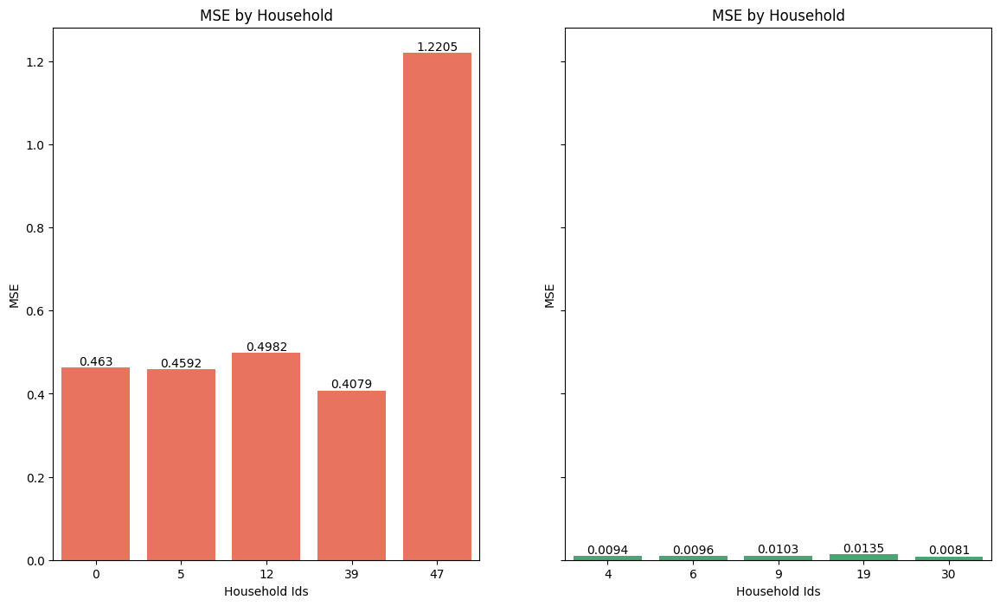

In [87]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

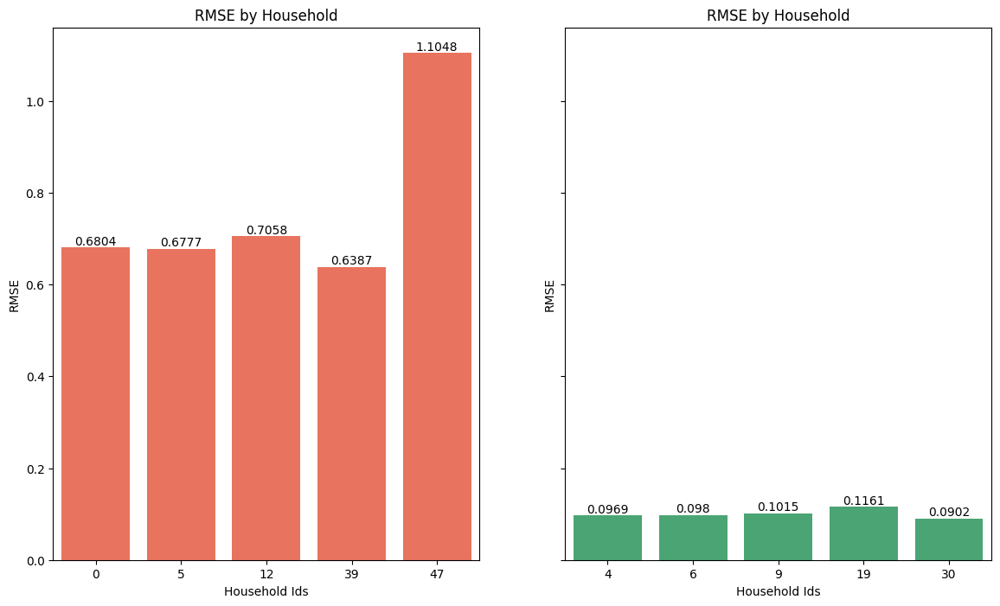

In [88]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

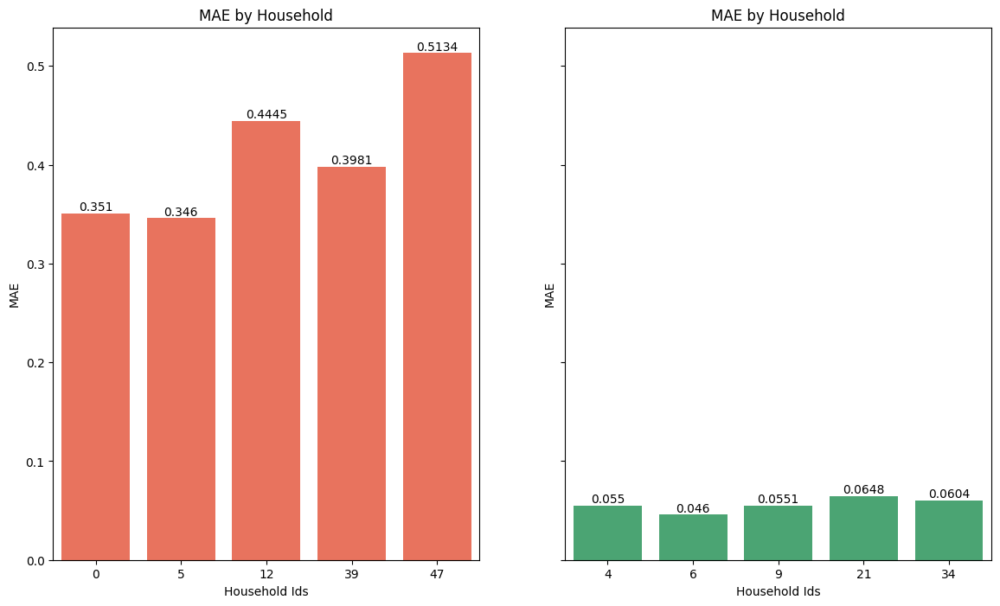

In [89]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

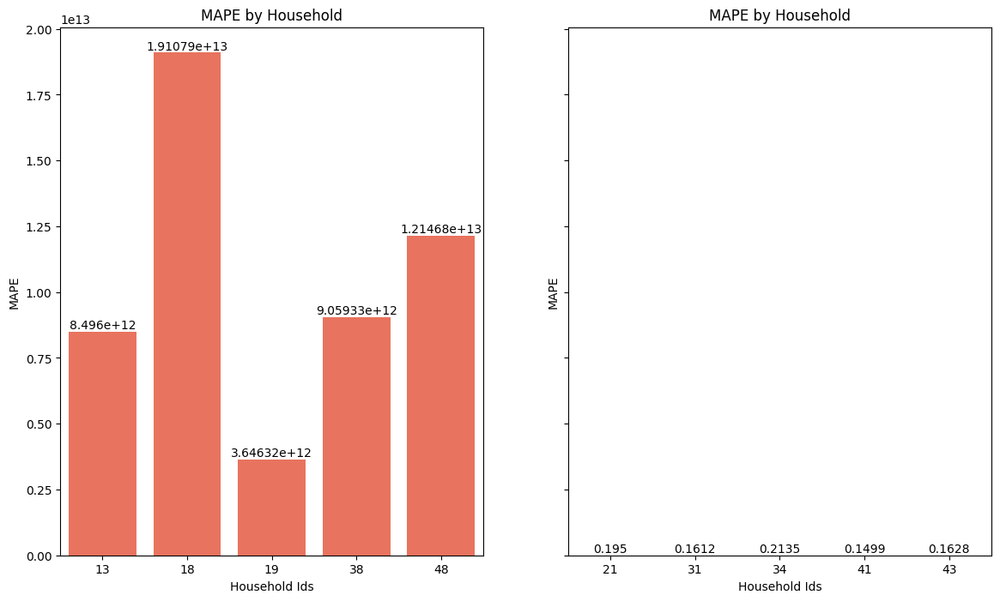

In [47]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

<Figure size 1400x800 with 0 Axes>

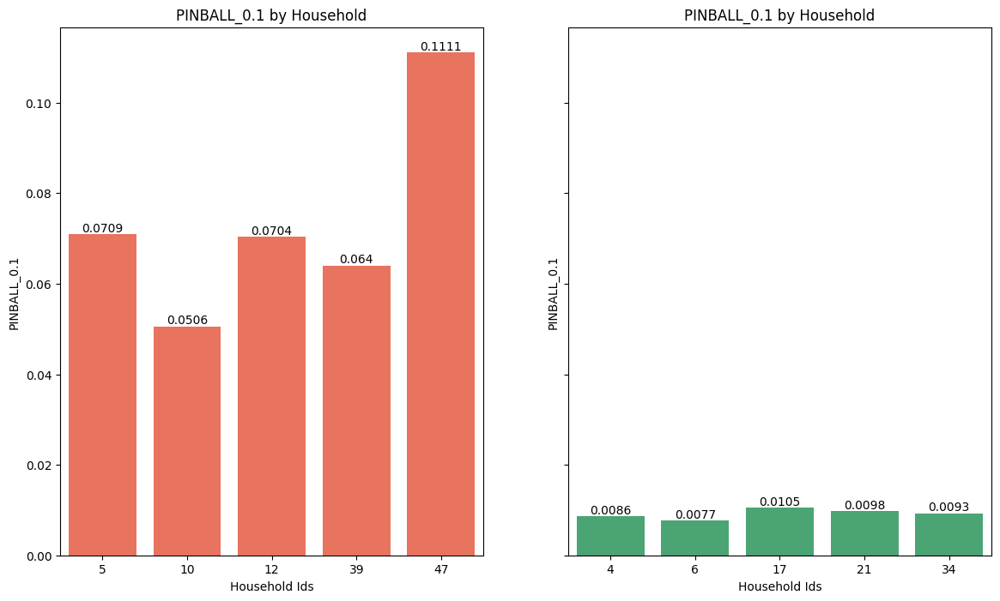

In [91]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.1', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.1', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.1')

<Figure size 1400x800 with 0 Axes>

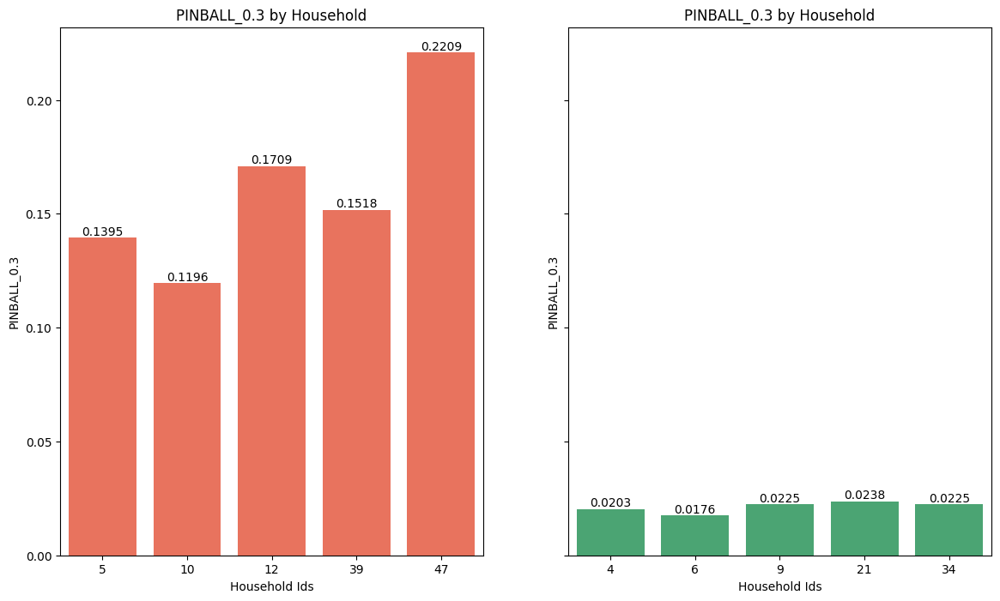

In [92]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.3', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.3', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.3')

<Figure size 1400x800 with 0 Axes>

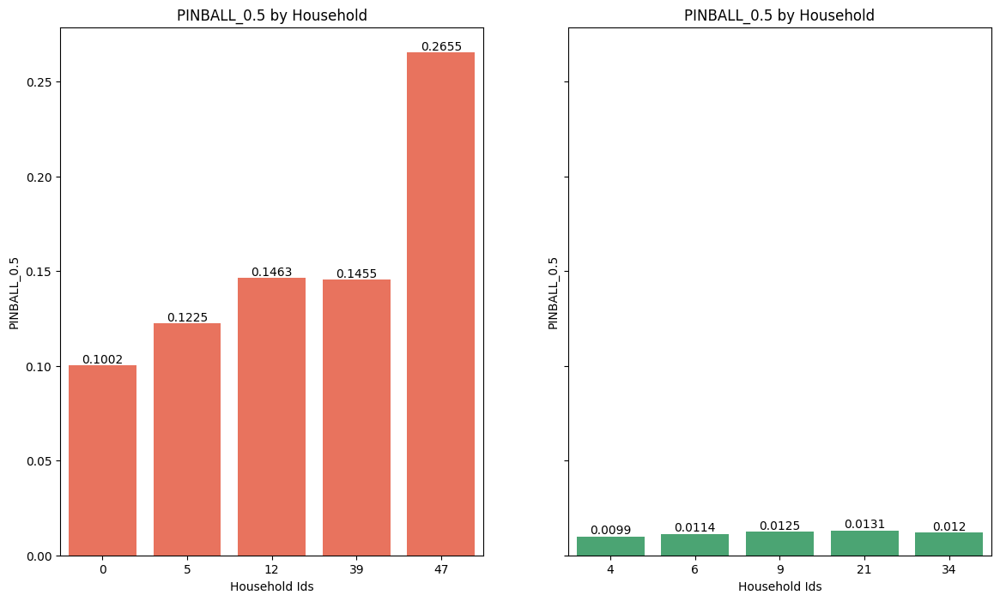

In [128]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.5', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.5', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.5')

<Figure size 1400x800 with 0 Axes>

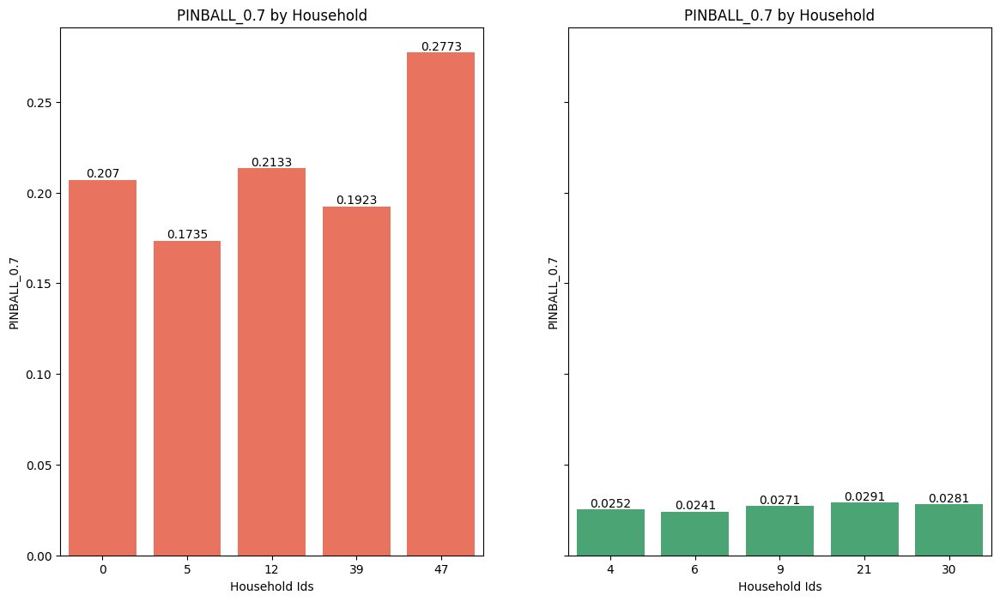

In [93]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.7', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.7', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.7')

<Figure size 1400x800 with 0 Axes>

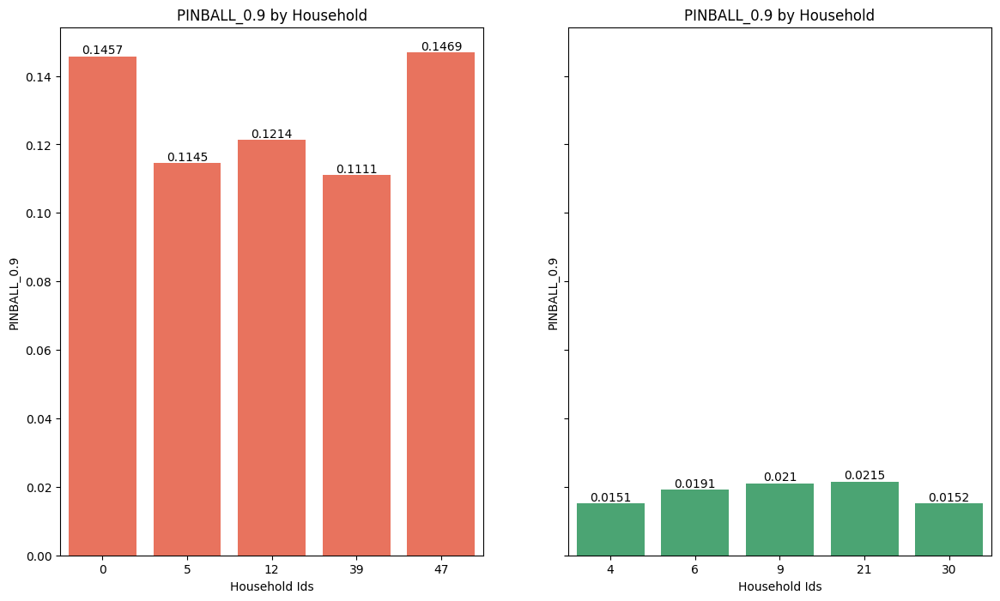

In [94]:
top5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.9', ascending=False).head(5)
bottom5_metric = quantile_lightgbm_metrics.sort_values(by='pinball_0.9', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.9')

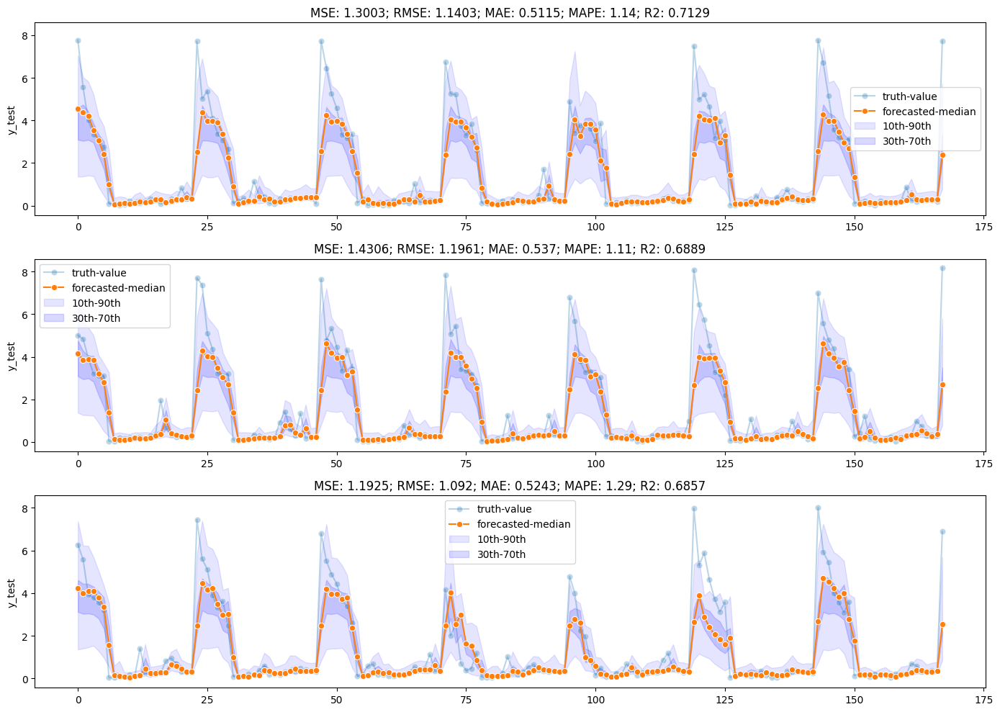

In [48]:
filtered_data = quantile_lightgbm_pred_by_household.loc[quantile_lightgbm_pred_by_household['household_id'] == 47]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

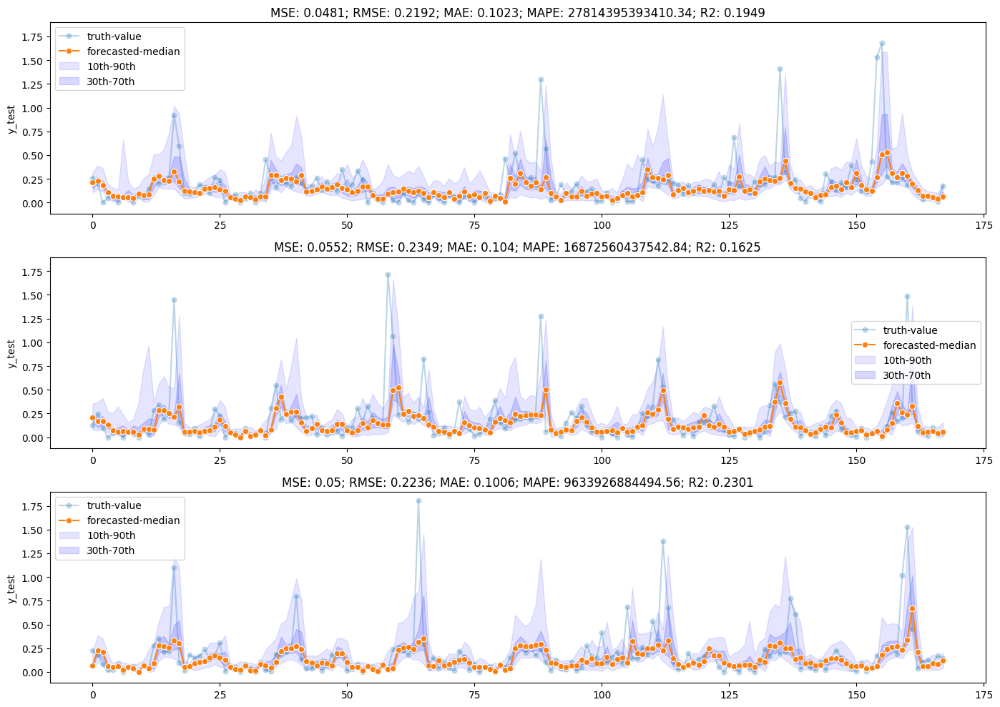

In [50]:
filtered_data = quantile_lightgbm_pred_by_household.loc[quantile_lightgbm_pred_by_household['household_id'] == 18]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

### Quantile-LSTM

In [11]:
import tensorflow as tf

def pinball_loss(y, y_hat, alpha):
  """
    Loss function for the deep learning models
  """

  error = (y - y_hat)
  loss = tf.keras.backend.mean(
    tf.keras.backend.maximum(alpha * error, (alpha - 1) * error), 
    axis=-1
  )

  return loss

def plot_training_metrics(history):
  """
    Function to plot the training metrics of the deep learning models
  """
  training_metrics = history.history
  loss = training_metrics['loss']
  val_loss = training_metrics['val_loss']
  loss_10 = training_metrics['output_10_loss']
  val_loss_10 = training_metrics['val_output_10_loss']
  loss_30 = training_metrics['output_30_loss']
  val_loss_30 = training_metrics['val_output_30_loss']
  loss_50 = training_metrics['output_50_loss']
  val_loss_50 = training_metrics['val_output_50_loss']
  loss_70 = training_metrics['output_70_loss']
  val_loss_70 = training_metrics['val_output_70_loss']
  loss_90 = training_metrics['output_90_loss']
  val_loss_90 = training_metrics['val_output_90_loss']


  timesteps = np.arange(len(loss))
  fig, axes = plt.subplots(2, 3, sharey=True, figsize=(20, 12))

  sns.lineplot(x=timesteps, y=loss, label='loss', marker='o', ax=axes[0][0])
  sns.lineplot(x=timesteps, y=val_loss, label='val_loss', marker='o', ax=axes[0][0])
  axes[0][0].set_title("Loss vs Validation Loss")
  axes[0][0].set_xlabel("Epochs")  
  axes[0][0].set_ylabel("Overall Loss")

  sns.lineplot(x=timesteps, y=loss_10, label='loss_10', marker='o', ax=axes[0][1])
  sns.lineplot(x=timesteps, y=val_loss_10, label='val_loss_10', marker='o', ax=axes[0][1])
  axes[0][1].set_title("Loss vs Validation Loss; alpha=0.1")
  axes[0][1].set_xlabel("Epochs")  
  axes[0][1].set_ylabel("Pinball Loss")

  sns.lineplot(x=timesteps, y=loss_30, label='loss_30', marker='o', ax=axes[0][2])
  sns.lineplot(x=timesteps, y=val_loss_30, label='val_loss_30', marker='o', ax=axes[0][2])
  axes[0][2].set_title("Loss vs Validation Loss; alpha=0.3")
  axes[0][2].set_xlabel("Epochs")  
  axes[0][2].set_ylabel("Pinball Loss")

  sns.lineplot(x=timesteps, y=loss_50, label='loss_50', marker='o', ax=axes[1][0])
  sns.lineplot(x=timesteps, y=val_loss_50, label='val_loss_50', marker='o', ax=axes[1][0])
  axes[1][0].set_title("Loss vs Validation Loss; alpha=0.5")
  axes[1][0].set_xlabel("Epochs")  
  axes[1][0].set_ylabel("Pinball Loss")

  sns.lineplot(x=timesteps, y=loss_70, label='loss_70', marker='o', ax=axes[1][1])
  sns.lineplot(x=timesteps, y=val_loss_70, label='val_loss_70', marker='o', ax=axes[1][1])
  axes[1][1].set_title("Loss vs Validation Loss; alpha=0.7")
  axes[1][1].set_xlabel("Epochs")  
  axes[1][1].set_ylabel("Pinball Loss")

  sns.lineplot(x=timesteps, y=loss_90, label='loss_90', marker='o', ax=axes[1][2])
  sns.lineplot(x=timesteps, y=val_loss_90, label='val_loss_90', marker='o', ax=axes[1][2])
  axes[1][2].set_title("Loss vs Validation Loss; alpha=0.9")
  axes[1][2].set_xlabel("Epochs")  
  axes[1][2].set_ylabel("Pinball Loss")

  plt.tight_layout()
  plt.show()
  

In [51]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Dense, LSTM,
    TimeDistributed, Dropout, Input
)

# for reproducibility
tf.random.set_seed(42)
tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

### Create Model
input_layer = Input(shape=(1, X_train.shape[2]))
layer = LSTM(100, return_sequences=True)(input_layer)
layer = LSTM(100, return_sequences=True)(layer)
layer = LSTM(100, return_sequences=True)(layer)
layer = Dropout(0.4)(layer)
layer = TimeDistributed(Dense(168, activation='relu', kernel_regularizer='l1'))(layer)
layer = TimeDistributed(Dense(64, activation='relu'))(layer)
output_layer_10 = TimeDistributed(Dense(1), name="output_10")(layer)
output_layer_30 = TimeDistributed(Dense(1), name="output_30")(layer)
output_layer_50 = TimeDistributed(Dense(1), name="output_50")(layer)
output_layer_70 = TimeDistributed(Dense(1), name="output_70")(layer)
output_layer_90 = TimeDistributed(Dense(1), name="output_90")(layer)
model = Model(inputs=[input_layer], outputs=[output_layer_10, output_layer_30, output_layer_50, output_layer_70, output_layer_90])

model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
  loss={
    "output_10": lambda y, y_hat: pinball_loss(y, y_hat, 0.1),
    "output_30": lambda y, y_hat: pinball_loss(y, y_hat, 0.3),
    "output_50": lambda y, y_hat: pinball_loss(y, y_hat, 0.5),
    "output_70": lambda y, y_hat: pinball_loss(y, y_hat, 0.7),
    "output_90": lambda y, y_hat: pinball_loss(y, y_hat, 0.9)
  }
)

history = model.fit(
    X_train,
    y_train,
    epochs=50,
    validation_data=(X_test, y_test),
    batch_size=168,
    callbacks=[earlystop]
)

Epoch 1/50
4087/4087 [==============================] - 61s 14ms/step - loss: 0.5446 - output_10_loss: 0.0320 - output_30_loss: 0.0714 - output_50_loss: 0.0917 - output_70_loss: 0.0940 - output_90_loss: 0.0661 - val_loss: 0.3947 - val_output_10_loss: 0.0352 - val_output_30_loss: 0.0753 - val_output_50_loss: 0.0949 - val_output_70_loss: 0.0954 - val_output_90_loss: 0.0661
Epoch 2/50
4087/4087 [==============================] - 55s 13ms/step - loss: 0.3528 - output_10_loss: 0.0304 - output_30_loss: 0.0663 - output_50_loss: 0.0842 - output_70_loss: 0.0856 - output_90_loss: 0.0601 - val_loss: 0.3770 - val_output_10_loss: 0.0342 - val_output_30_loss: 0.0724 - val_output_50_loss: 0.0902 - val_output_70_loss: 0.0908 - val_output_90_loss: 0.0632
Epoch 3/50
4087/4087 [==============================] - 56s 14ms/step - loss: 0.3440 - output_10_loss: 0.0296 - output_30_loss: 0.0645 - output_50_loss: 0.0820 - output_70_loss: 0.0837 - output_90_loss: 0.0592 - val_loss: 0.3744 - val_output_10_loss: 0

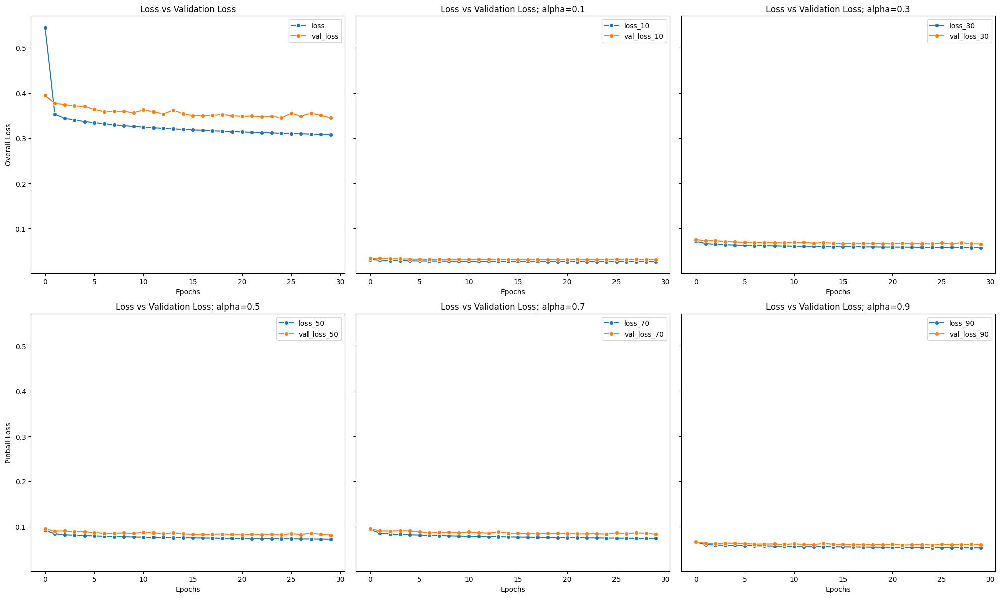

In [100]:
plot_training_metrics(history)

In [52]:
y_pred = model.predict(X_test)
y_pred = np.array(y_pred).squeeze() # compress to 2-Dimensional array
y_pred = pd.DataFrame({
  'pred_0.1': y_pred[0].ravel(),
  'pred_0.3': y_pred[1].ravel(),
  'pred_0.5': y_pred[2].ravel(),
  'pred_0.7': y_pred[3].ravel(),
  'pred_0.9': y_pred[4].ravel()
})

evaluate_model(y_pred, y_test)

2385/2385 [==============================] - 9s 4ms/step
RMSE: 0.32801402046854816
MSE: 0.10759319762394112
MAE: 0.16302482008795155
MAPE: 1716002780840.4001
R2 Score: 0.740672260046576
Adjusted R2 Score: 0.7406688618347386
Pinball loss with alpha 0.1: 0.031509841055941644
Pinball loss with alpha 0.3: 0.06546890501626555
Pinball loss with alpha 0.5: 0.08151241004397577
Pinball loss with alpha 0.7: 0.08337241647210743
Pinball loss with alpha 0.9: 0.05922420448795016


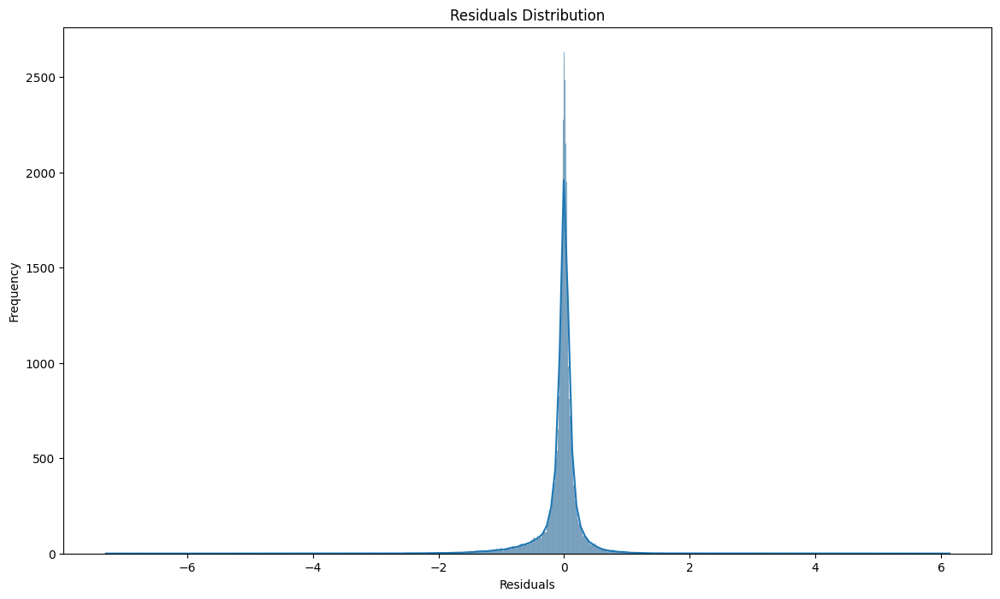

In [53]:
residuals = calculate_error(y_pred['pred_0.5'], y_test.reset_index()['energy(kWh/hh)'])

plot_error_distribution(residuals)

In [54]:
# prepare the prediction dataframe with household and testing data
quantile_lstm_pred_by_household = pd.DataFrame(np.hstack([y_pred.values.reshape(-1, 5), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9', 'household_id', 'y_test'])
quantile_lstm_pred_by_household['household_id'] = quantile_lstm_pred_by_household['household_id'].astype('int8')

# prepare the household grp
quantile_lstm_hhgroup = quantile_lstm_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
quantile_lstm_metrics = quantile_lstm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'])).reset_index()
quantile_lstm_metrics['rmse'] = quantile_lstm_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'], squared=False)).values
quantile_lstm_metrics['mae'] = quantile_lstm_hhgroup.apply(lambda x: mean_absolute_error(x['y_test'], x['pred_0.5'])).values
quantile_lstm_metrics['mape'] = quantile_lstm_hhgroup.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['pred_0.5'])).values
quantile_lstm_metrics['r2'] = quantile_lstm_hhgroup.apply(lambda x: r2_score(x['y_test'], x['pred_0.5'])).values
quantile_lstm_metrics['adjusted_r2'] = quantile_lstm_hhgroup.apply(lambda x: adjusted_r2(x['y_test'], x['pred_0.5'])).values
quantile_lstm_metrics = quantile_lstm_metrics.rename(columns={ 0: 'mse'})

# pinball losses
quantile_lstm_metrics['pinball_0.1'] = quantile_lstm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.1'], alpha=0.1)).values
quantile_lstm_metrics['pinball_0.3'] = quantile_lstm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.3'], alpha=0.3)).values
quantile_lstm_metrics['pinball_0.5'] = quantile_lstm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.5'], alpha=0.5)).values
quantile_lstm_metrics['pinball_0.7'] = quantile_lstm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.7'], alpha=0.7)).values
quantile_lstm_metrics['pinball_0.9'] = quantile_lstm_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.9'], alpha=0.9)).values


<Figure size 1400x800 with 0 Axes>

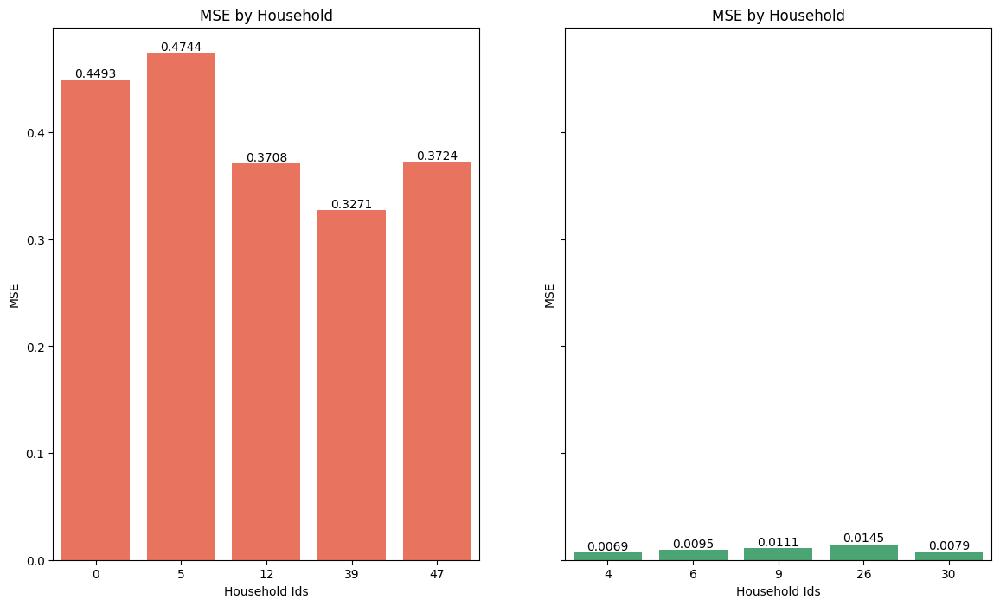

In [105]:
top5_metric = quantile_lstm_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

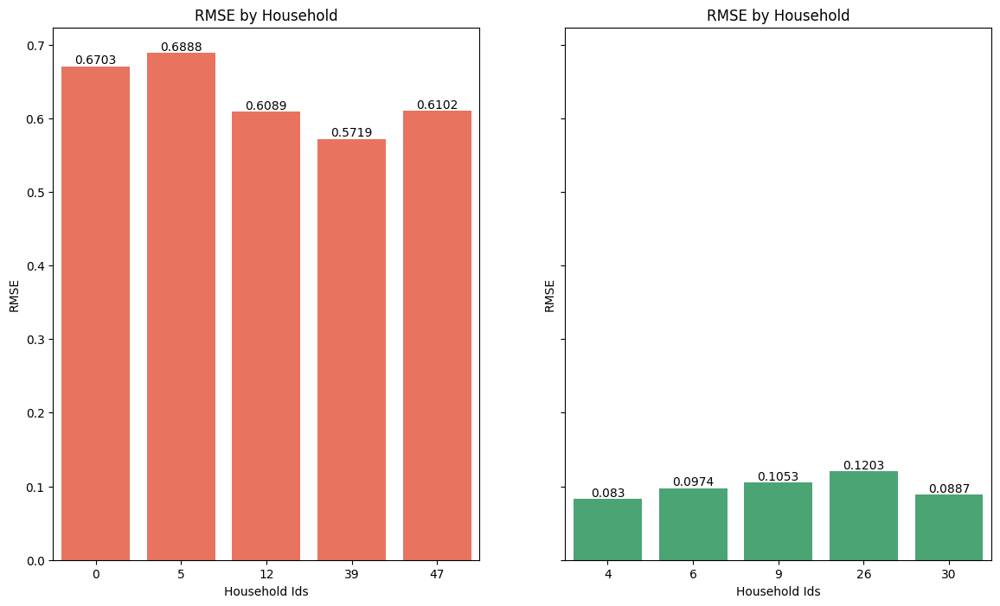

In [55]:
top5_metric = quantile_lstm_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

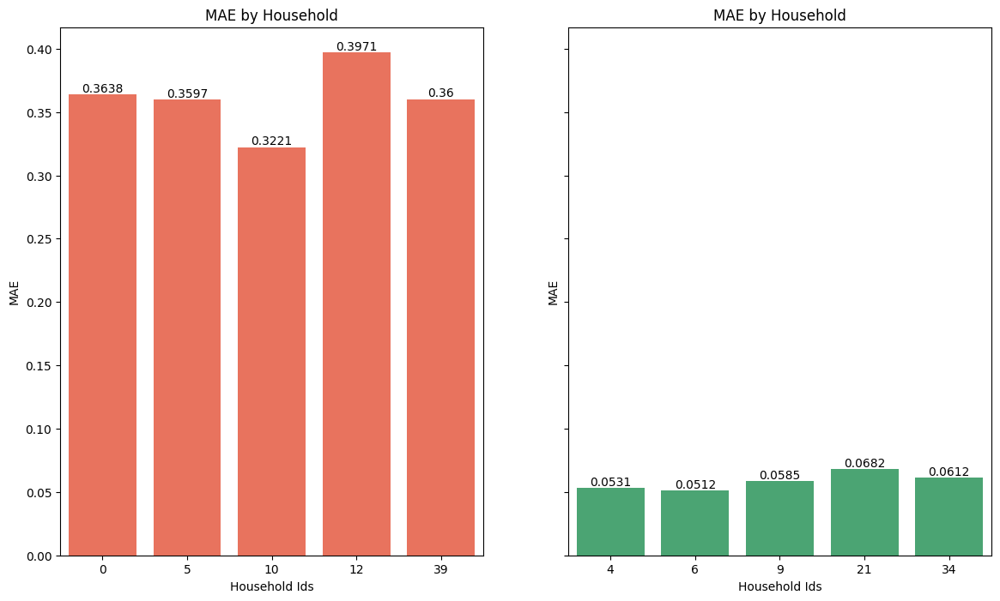

In [107]:
top5_metric = quantile_lstm_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

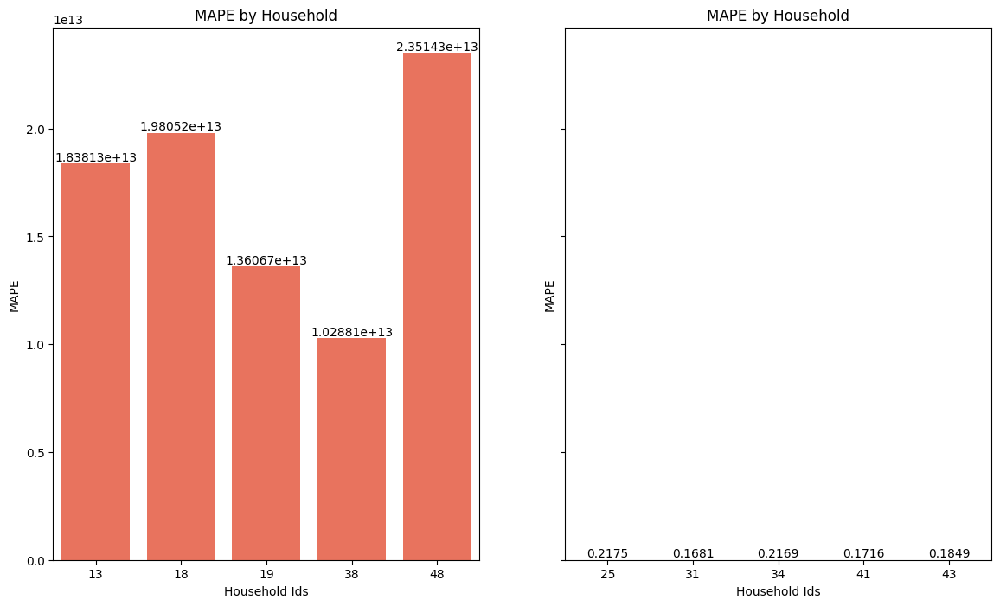

In [114]:
top5_metric = quantile_lstm_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

<Figure size 1400x800 with 0 Axes>

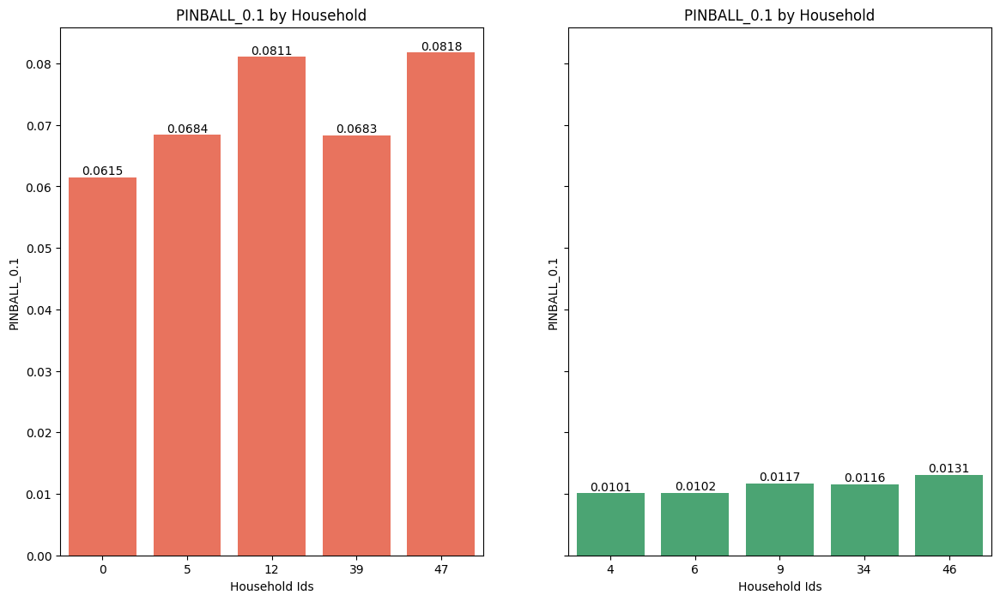

In [109]:
top5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.1', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.1', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.1')

<Figure size 1400x800 with 0 Axes>

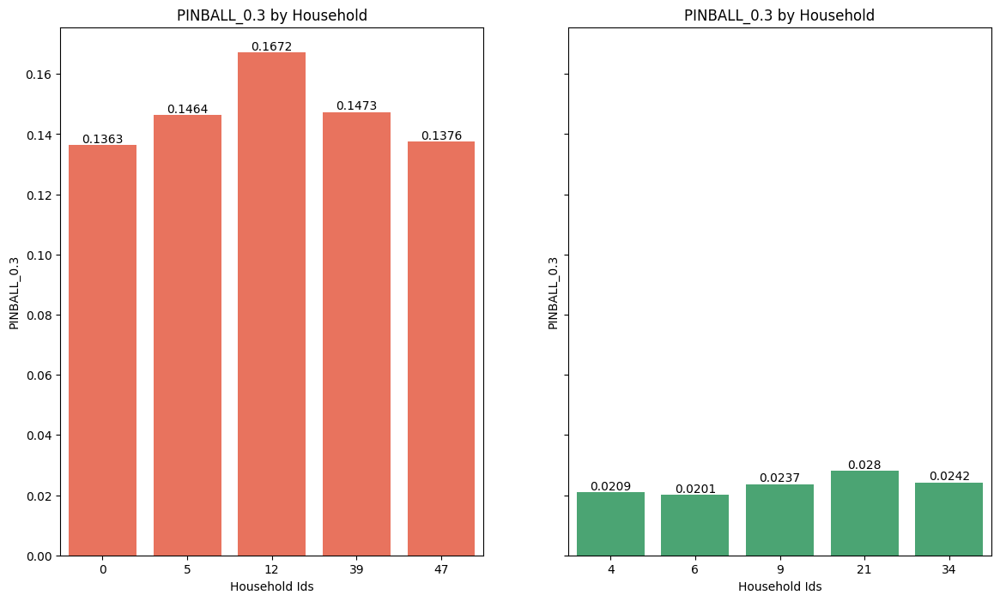

In [115]:
top5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.3', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.3', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.3')

<Figure size 1400x800 with 0 Axes>

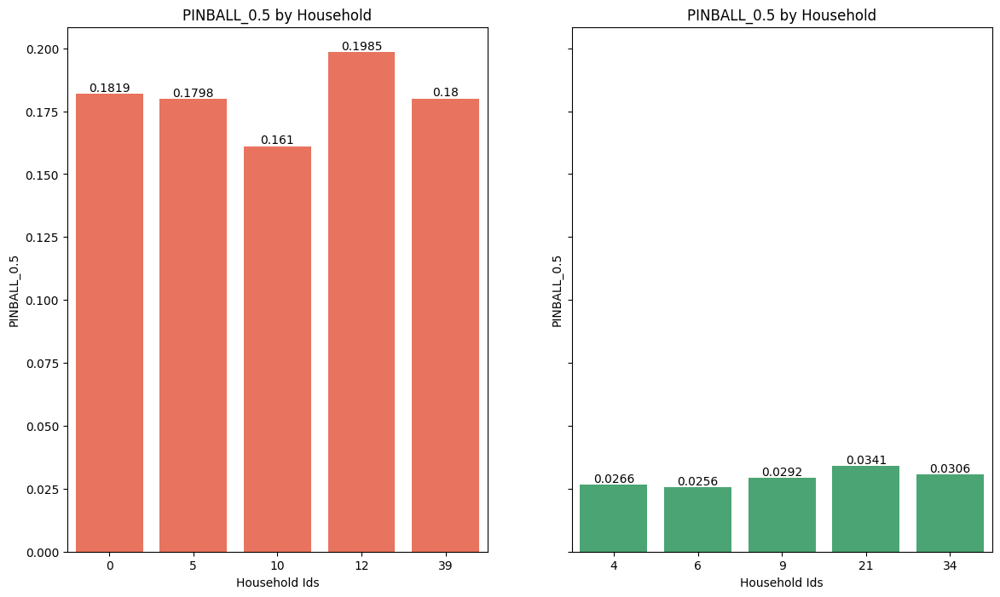

In [116]:
top5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.5', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.5', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.5')

<Figure size 1400x800 with 0 Axes>

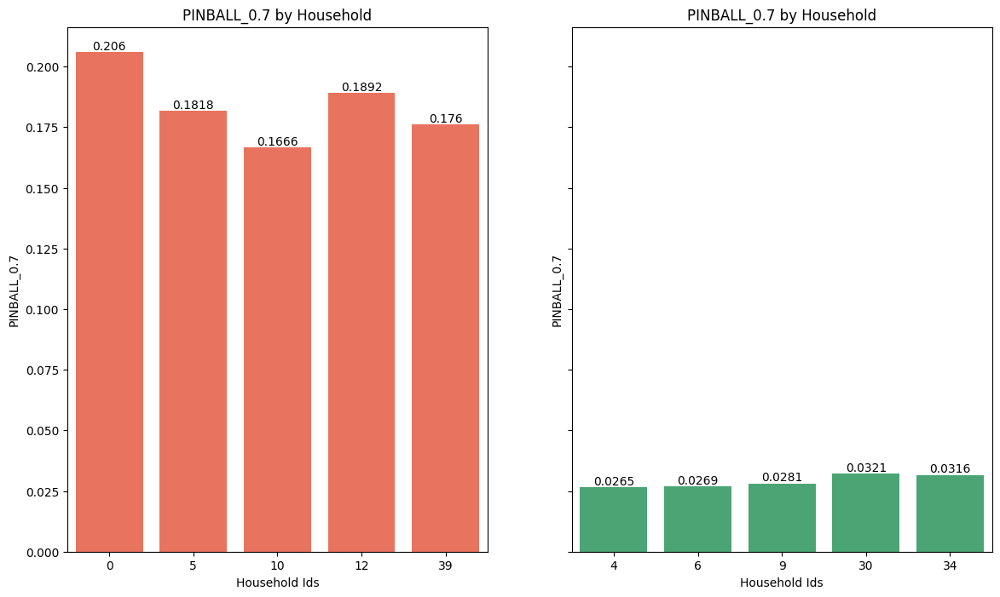

In [117]:
top5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.7', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.7', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.7')

<Figure size 1400x800 with 0 Axes>

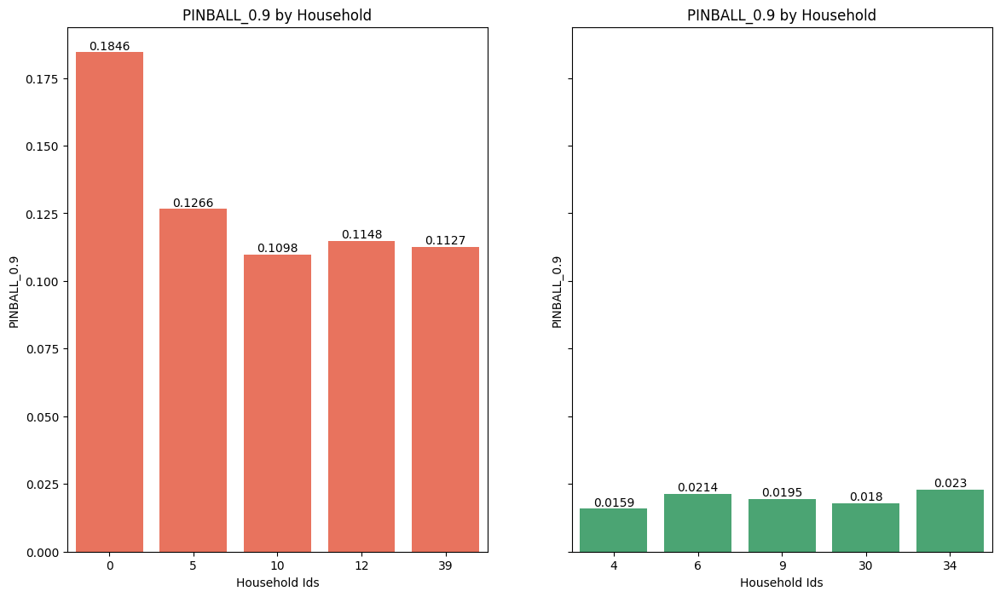

In [113]:
top5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.9', ascending=False).head(5)
bottom5_metric = quantile_lstm_metrics.sort_values(by='pinball_0.9', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.9')

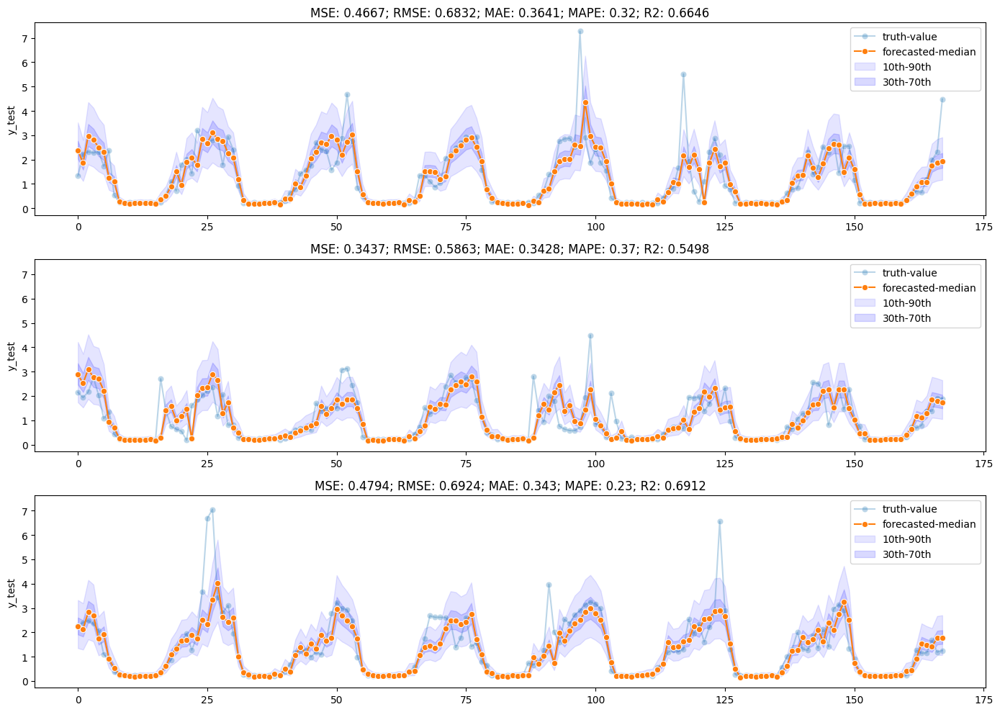

In [57]:
filtered_data = quantile_lstm_pred_by_household.loc[quantile_lstm_pred_by_household['household_id'] == 5]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

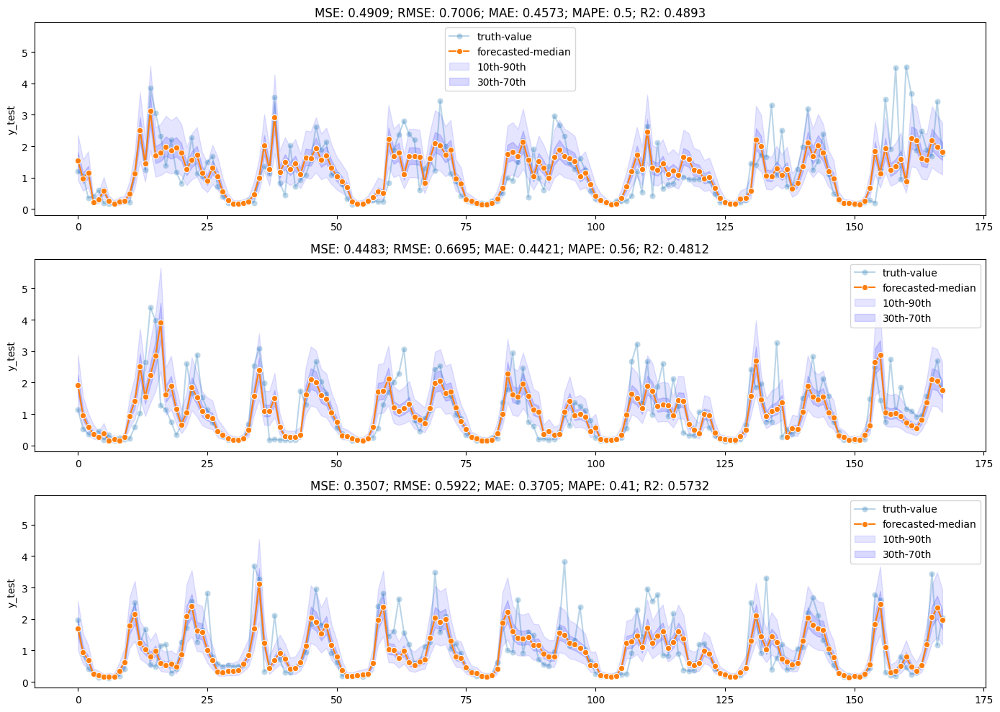

In [58]:
filtered_data = quantile_lstm_pred_by_household.loc[quantile_lstm_pred_by_household['household_id'] == 12]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

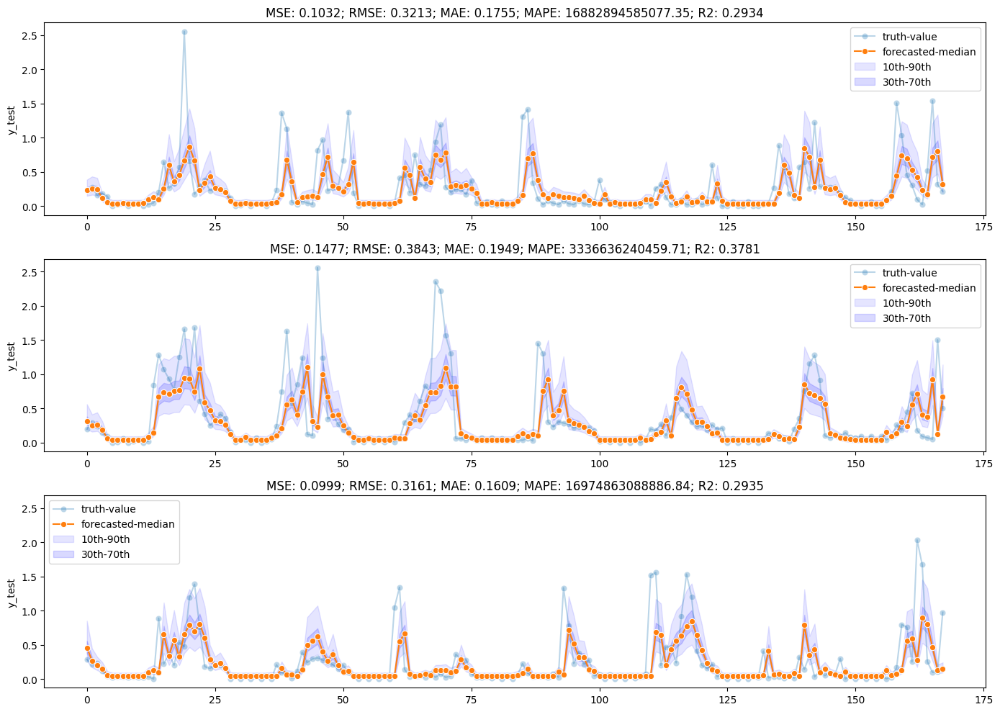

In [59]:
filtered_data = quantile_lstm_pred_by_household.loc[quantile_lstm_pred_by_household['household_id'] == 48]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

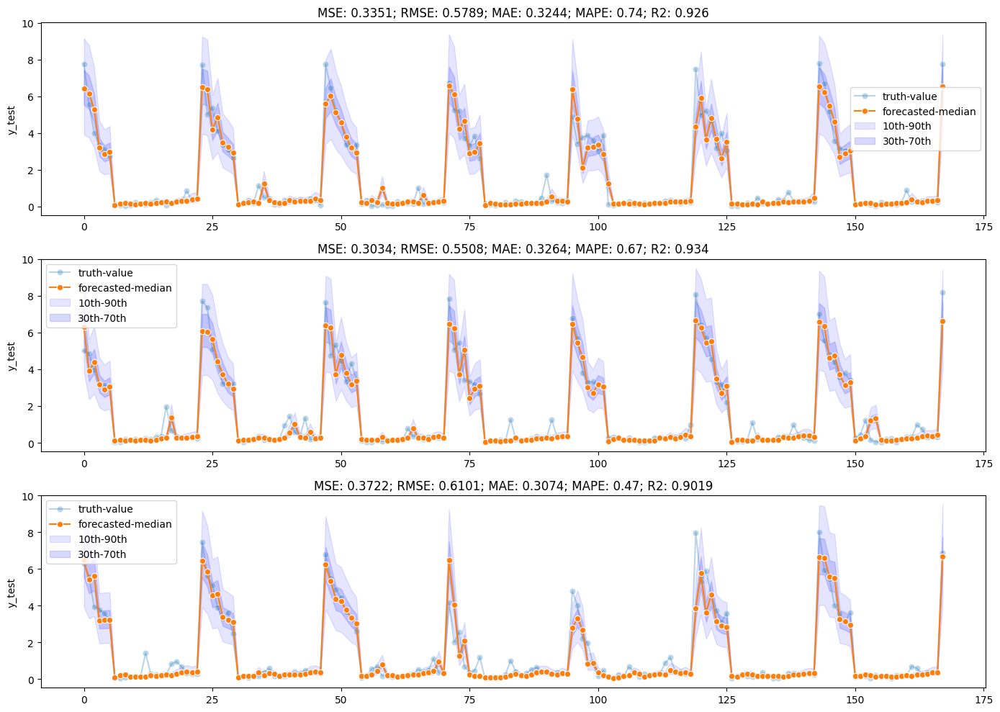

In [60]:
filtered_data = quantile_lstm_pred_by_household.loc[quantile_lstm_pred_by_household['household_id'] == 47]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

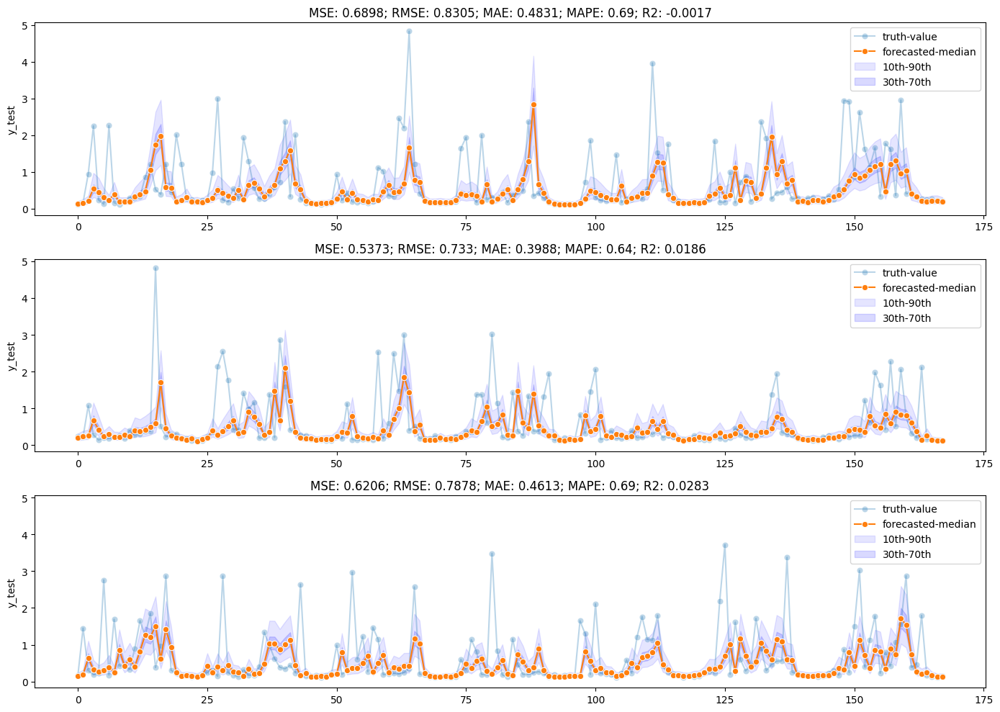

In [61]:
filtered_data = quantile_lstm_pred_by_household.loc[quantile_lstm_pred_by_household['household_id'] == 0]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

### Quantile-GRU

In [12]:
from tensorflow.keras.layers import (
  Dense, GRU, TimeDistributed, 
  Dropout, Input
)
from tensorflow.keras.models import Model
import tensorflow as tf

tf.random.set_seed(42)
tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

### Create Model
input_layer = Input(shape=(1, X_train.shape[2]))
layer = GRU(100, return_sequences=True)(input_layer)
layer = GRU(100, return_sequences=True)(layer)
layer = GRU(100, return_sequences=True)(layer)
layer = Dropout(0.4)(layer)
layer = TimeDistributed(Dense(168, activation='relu', kernel_regularizer='l1'))(layer)
layer = TimeDistributed(Dense(64, activation='relu'))(layer)
output_layer_10 = TimeDistributed(Dense(1), name="output_10")(layer)
output_layer_30 = TimeDistributed(Dense(1), name="output_30")(layer)
output_layer_50 = TimeDistributed(Dense(1), name="output_50")(layer)
output_layer_70 = TimeDistributed(Dense(1), name="output_70")(layer)
output_layer_90 = TimeDistributed(Dense(1), name="output_90")(layer)
model = Model(inputs=[input_layer], outputs=[output_layer_10, output_layer_30, output_layer_50, output_layer_70, output_layer_90])

model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
  loss={
    "output_10": lambda y, y_hat: pinball_loss(y, y_hat, 0.1),
    "output_30": lambda y, y_hat: pinball_loss(y, y_hat, 0.3),
    "output_50": lambda y, y_hat: pinball_loss(y, y_hat, 0.5),
    "output_70": lambda y, y_hat: pinball_loss(y, y_hat, 0.7),
    "output_90": lambda y, y_hat: pinball_loss(y, y_hat, 0.9)
  }
)

history = model.fit(
  X_train,
  [y_train, y_train, y_train, y_train, y_train],
  epochs=50,
  validation_data=(X_test, [y_test, y_test, y_test, y_test, y_test]),
  batch_size=168,
  callbacks=[earlystop]
)

Epoch 1/50
4087/4087 [==============================] - 54s 12ms/step - loss: 0.5402 - output_10_loss: 0.0318 - output_30_loss: 0.0709 - output_50_loss: 0.0909 - output_70_loss: 0.0930 - output_90_loss: 0.0653 - val_loss: 0.3934 - val_output_10_loss: 0.0353 - val_output_30_loss: 0.0754 - val_output_50_loss: 0.0946 - val_output_70_loss: 0.0950 - val_output_90_loss: 0.0658
Epoch 2/50
4087/4087 [==============================] - 49s 12ms/step - loss: 0.3527 - output_10_loss: 0.0303 - output_30_loss: 0.0663 - output_50_loss: 0.0843 - output_70_loss: 0.0858 - output_90_loss: 0.0604 - val_loss: 0.3769 - val_output_10_loss: 0.0341 - val_output_30_loss: 0.0725 - val_output_50_loss: 0.0904 - val_output_70_loss: 0.0913 - val_output_90_loss: 0.0632
Epoch 3/50
4087/4087 [==============================] - 49s 12ms/step - loss: 0.3443 - output_10_loss: 0.0296 - output_30_loss: 0.0646 - output_50_loss: 0.0822 - output_70_loss: 0.0839 - output_90_loss: 0.0593 - val_loss: 0.3762 - val_output_10_loss: 0

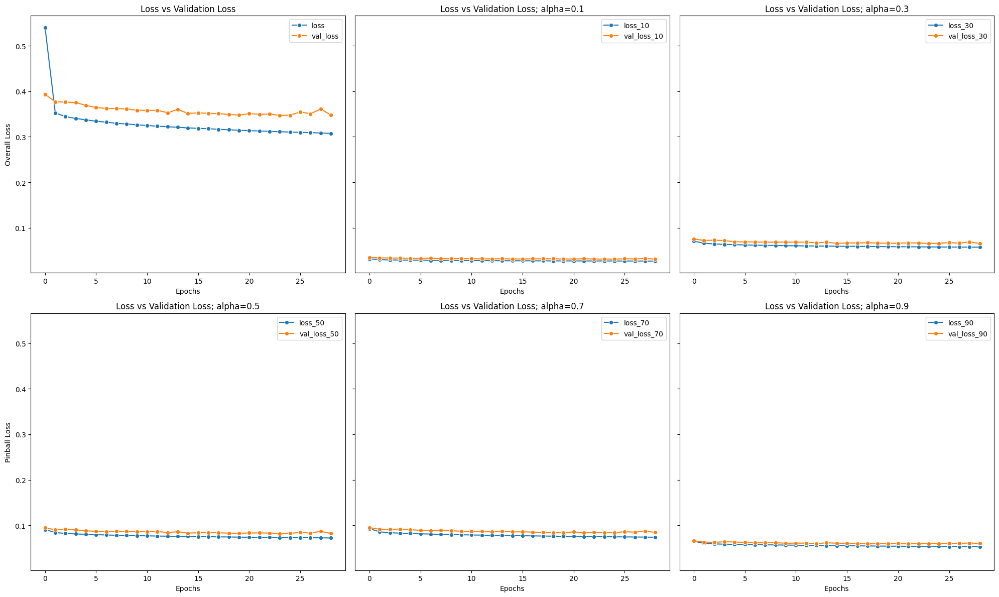

In [13]:
plot_training_metrics(history)

In [17]:
y_pred = model.predict(X_test)
y_pred = np.array(y_pred).squeeze() # compress to 2-Dimensional array
y_pred = pd.DataFrame({
  'pred_0.1': y_pred[0].ravel(),
  'pred_0.3': y_pred[1].ravel(),
  'pred_0.5': y_pred[2].ravel(),
  'pred_0.7': y_pred[3].ravel(),
  'pred_0.9': y_pred[4].ravel()
})

evaluate_model(y_pred, y_test)

2385/2385 [==============================] - 6s 3ms/step
RMSE: 0.3322330359016624
MSE: 0.1103787901444353
MAE: 0.16433203373387095
MAPE: 1688811549945.0874
R2 Score: 0.7339582536900051
Adjusted R2 Score: 0.7339547674983168
Pinball loss with alpha 0.1: 0.031449299999305895
Pinball loss with alpha 0.3: 0.06582095353631019
Pinball loss with alpha 0.5: 0.08216601686693548
Pinball loss with alpha 0.7: 0.08386644691264562
Pinball loss with alpha 0.9: 0.05986380172742282


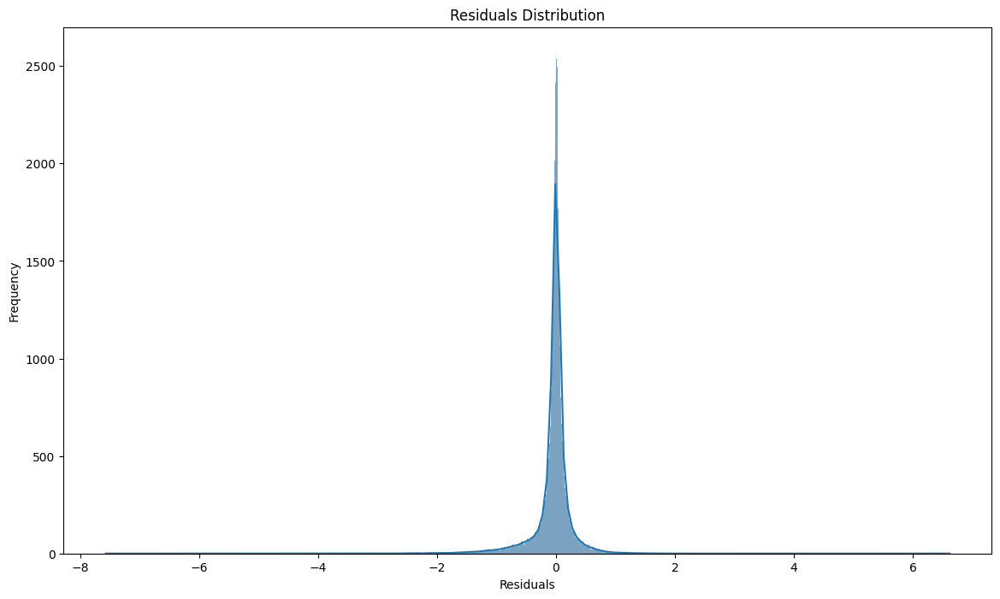

In [20]:
residuals = calculate_error(y_pred['pred_0.5'], y_test.reset_index()['energy(kWh/hh)'])

plot_error_distribution(residuals)

In [23]:
# prepare the prediction dataframe with household and testing data
quantile_gru_pred_by_household = pd.DataFrame(np.hstack([y_pred.values.reshape(-1, 5), y_test_with_ids[['household_ids', 'y_test']].to_numpy().reshape(-1, 2)]), columns=['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9', 'household_id', 'y_test'])
quantile_gru_pred_by_household['household_id'] = quantile_gru_pred_by_household['household_id'].astype('int8')

# prepare the household grp
quantile_gru_hhgroup = quantile_gru_pred_by_household.groupby('household_id')

# calculate the metrics for each individual group
quantile_gru_metrics = quantile_gru_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'])).reset_index()
quantile_gru_metrics['rmse'] = quantile_gru_hhgroup.apply(lambda x: mean_squared_error(x['y_test'], x['pred_0.5'], squared=False)).values
quantile_gru_metrics['mae'] = quantile_gru_hhgroup.apply(lambda x: mean_absolute_error(x['y_test'], x['pred_0.5'])).values
quantile_gru_metrics['mape'] = quantile_gru_hhgroup.apply(lambda x: mean_absolute_percentage_error(x['y_test'], x['pred_0.5'])).values
quantile_gru_metrics['r2'] = quantile_gru_hhgroup.apply(lambda x: r2_score(x['y_test'], x['pred_0.5'])).values
quantile_gru_metrics['adjusted_r2'] = quantile_gru_hhgroup.apply(lambda x: adjusted_r2(x['y_test'], x['pred_0.5'])).values
quantile_gru_metrics = quantile_gru_metrics.rename(columns={ 0: 'mse'})

# pinball losses
quantile_gru_metrics['pinball_0.1'] = quantile_gru_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.1'], alpha=0.1)).values
quantile_gru_metrics['pinball_0.3'] = quantile_gru_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.3'], alpha=0.3)).values
quantile_gru_metrics['pinball_0.5'] = quantile_gru_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.5'], alpha=0.5)).values
quantile_gru_metrics['pinball_0.7'] = quantile_gru_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.7'], alpha=0.7)).values
quantile_gru_metrics['pinball_0.9'] = quantile_gru_hhgroup.apply(lambda x: mean_pinball_loss(x['y_test'], x['pred_0.9'], alpha=0.9)).values


<Figure size 1400x800 with 0 Axes>

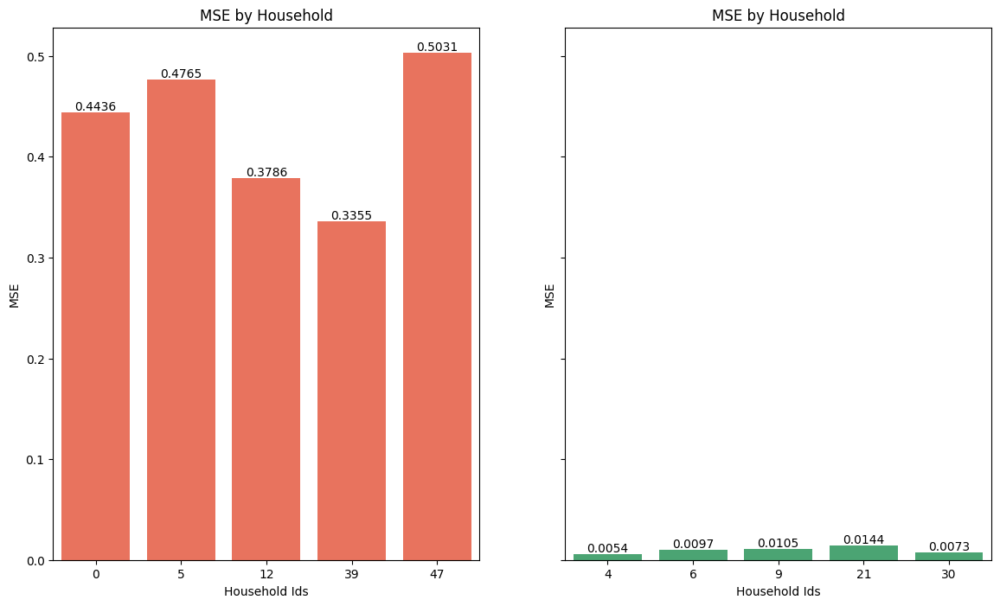

In [24]:
top5_metric = quantile_gru_metrics.sort_values(by='mse', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='mse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mse')

<Figure size 1400x800 with 0 Axes>

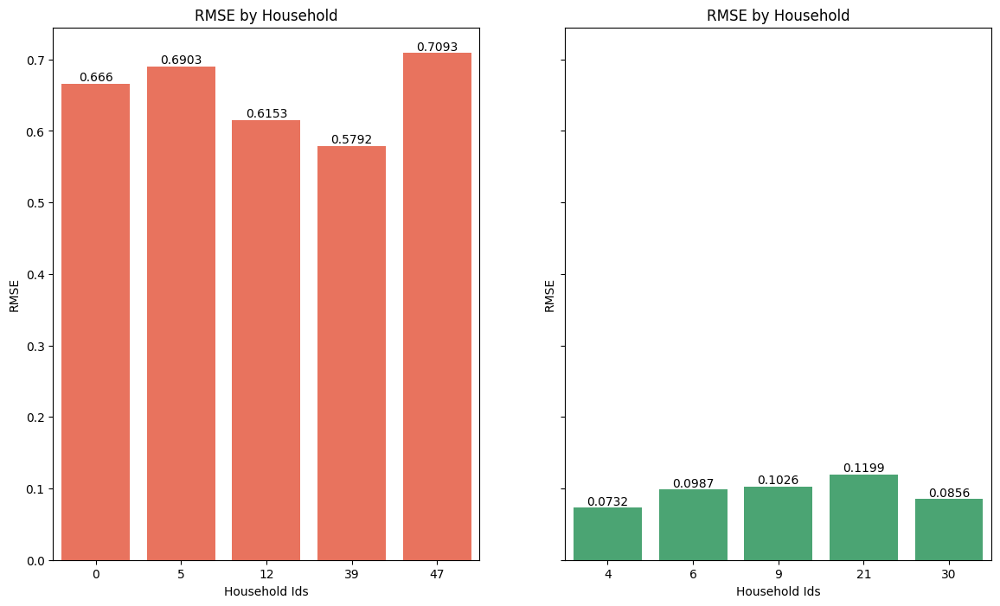

In [25]:
top5_metric = quantile_gru_metrics.sort_values(by='rmse', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='rmse', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'rmse')

<Figure size 1400x800 with 0 Axes>

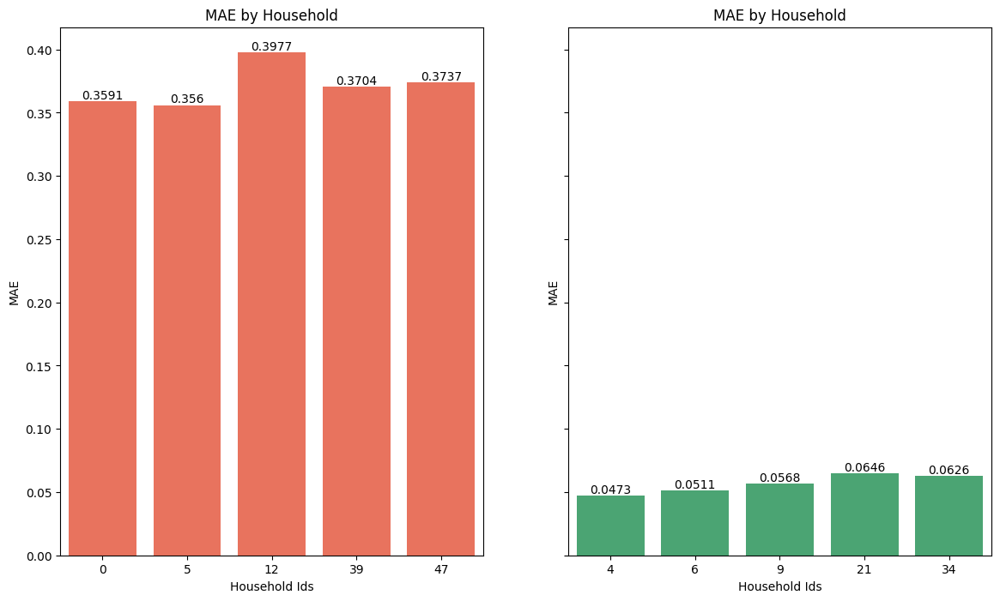

In [26]:
top5_metric = quantile_gru_metrics.sort_values(by='mae', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='mae', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mae')

<Figure size 1400x800 with 0 Axes>

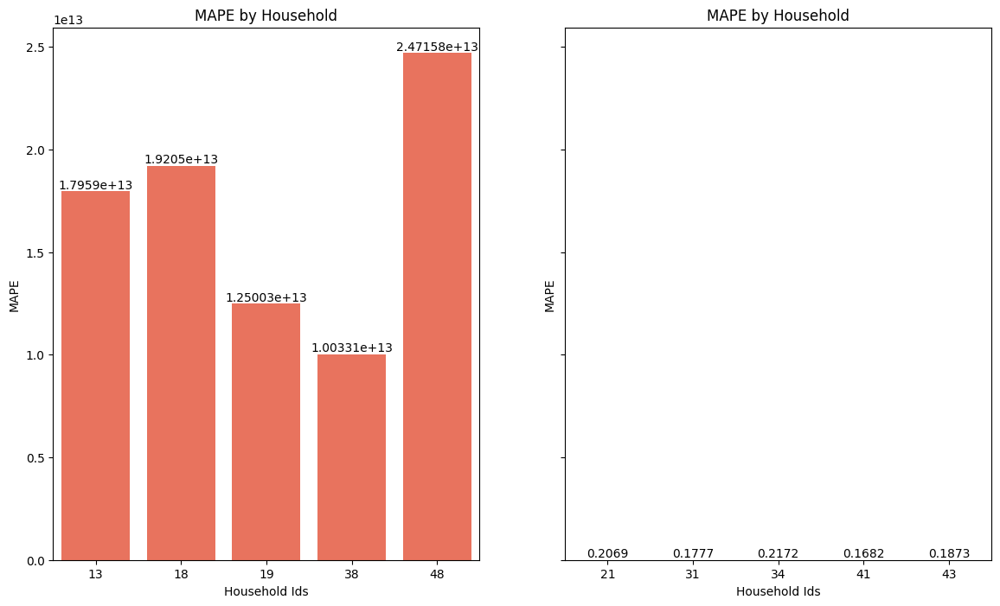

In [27]:
top5_metric = quantile_gru_metrics.sort_values(by='mape', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='mape', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'mape')

<Figure size 1400x800 with 0 Axes>

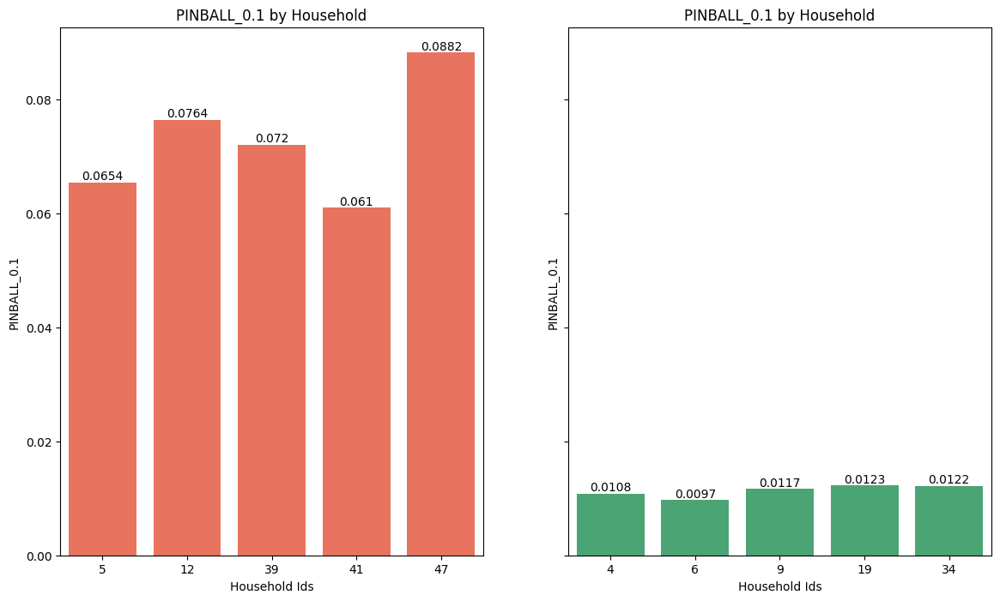

In [28]:
top5_metric = quantile_gru_metrics.sort_values(by='pinball_0.1', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='pinball_0.1', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.1')

<Figure size 1400x800 with 0 Axes>

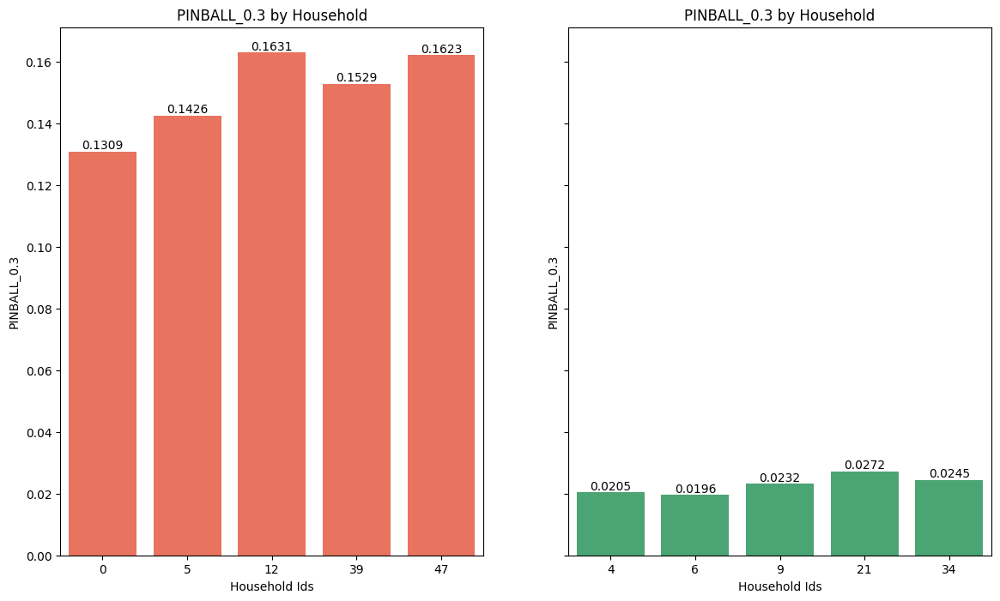

In [29]:
top5_metric = quantile_gru_metrics.sort_values(by='pinball_0.3', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='pinball_0.3', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.3')

<Figure size 1400x800 with 0 Axes>

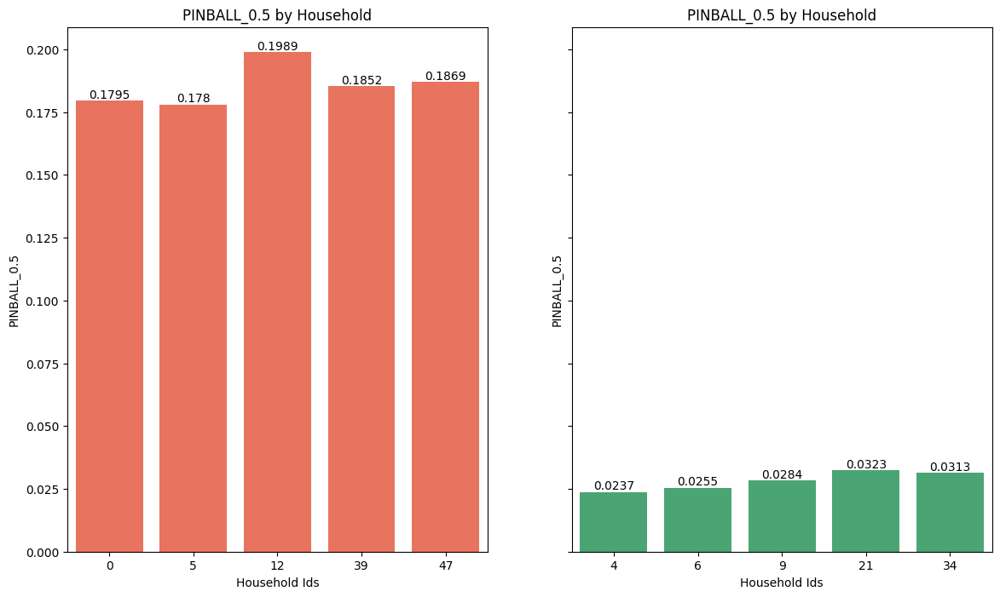

In [30]:
top5_metric = quantile_gru_metrics.sort_values(by='pinball_0.5', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='pinball_0.5', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.5')

<Figure size 1400x800 with 0 Axes>

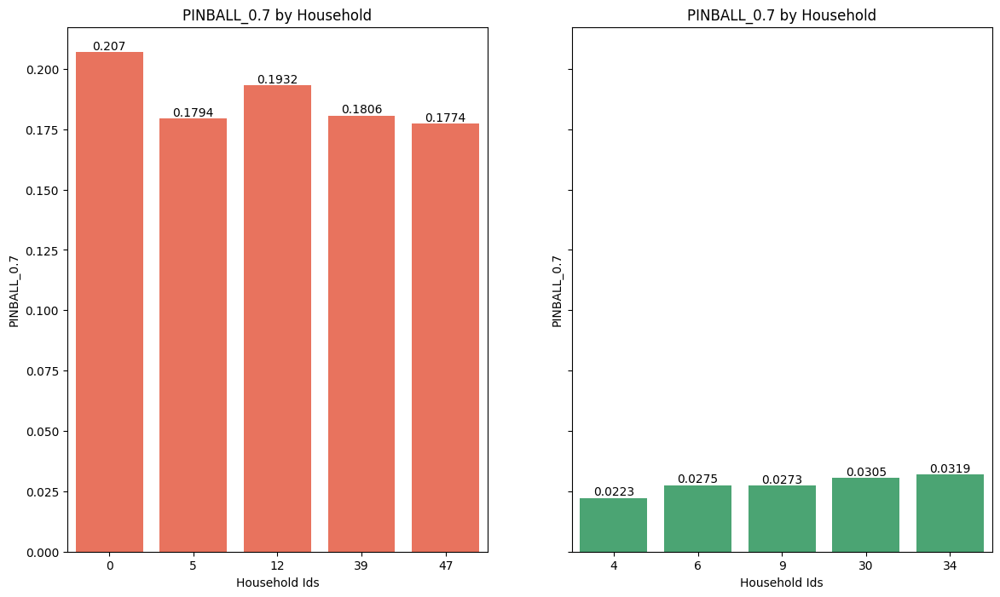

In [31]:
top5_metric = quantile_gru_metrics.sort_values(by='pinball_0.7', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='pinball_0.7', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.7')

<Figure size 1400x800 with 0 Axes>

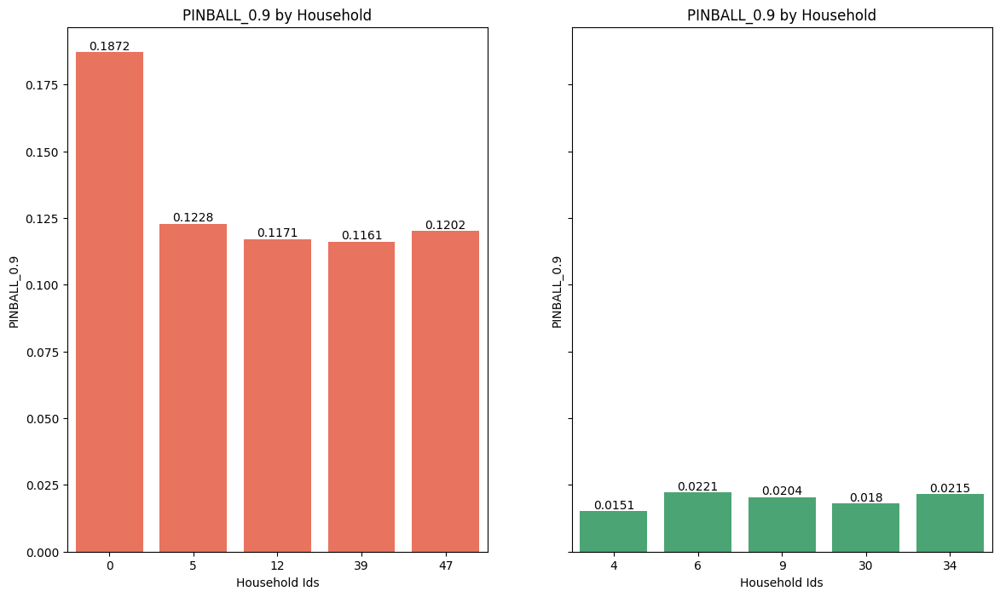

In [32]:
top5_metric = quantile_gru_metrics.sort_values(by='pinball_0.9', ascending=False).head(5)
bottom5_metric = quantile_gru_metrics.sort_values(by='pinball_0.9', ascending=True).head(5)
plot_metrics_bar(top5_metric, bottom5_metric, 'pinball_0.9')

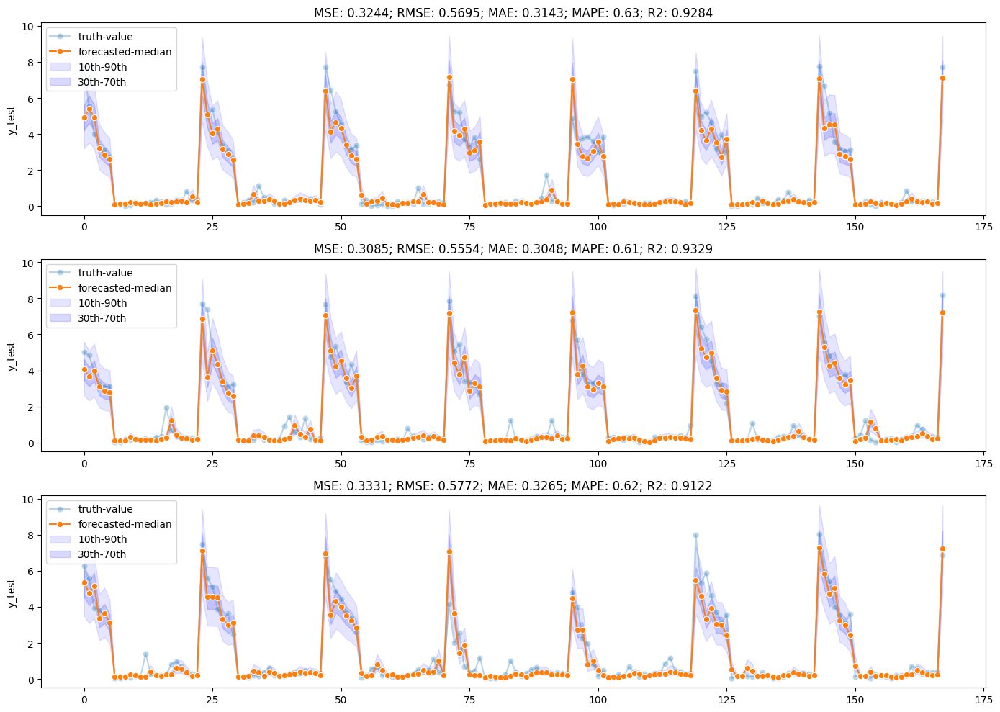

In [36]:
filtered_data = quantile_gru_pred_by_household.loc[quantile_gru_pred_by_household['household_id'] == 47]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

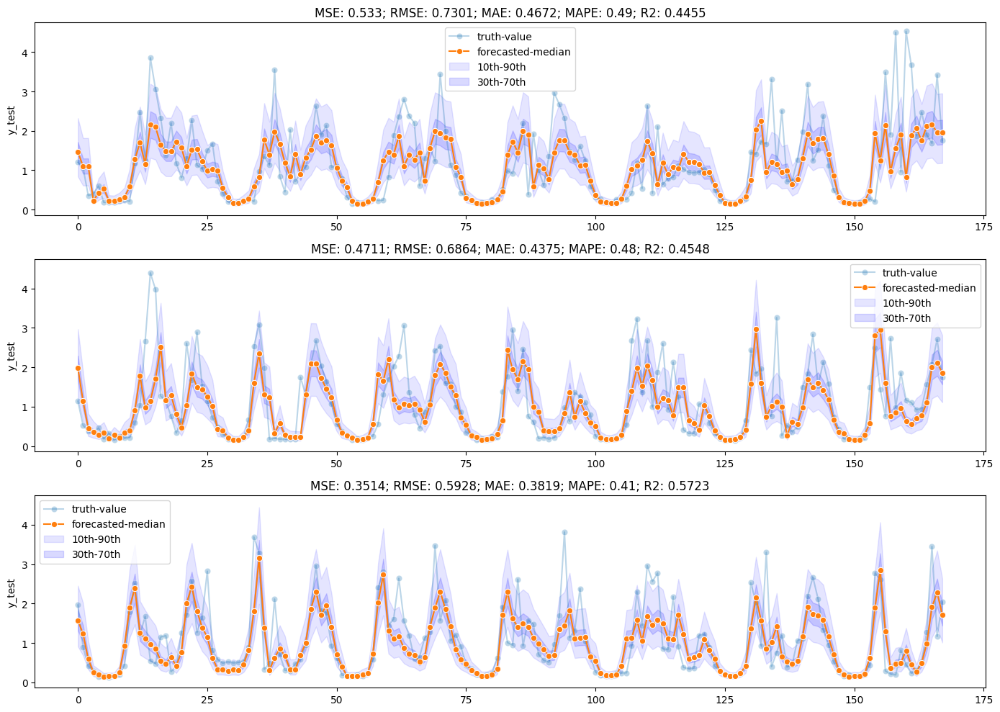

In [41]:
filtered_data = quantile_gru_pred_by_household.loc[quantile_gru_pred_by_household['household_id'] == 12]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

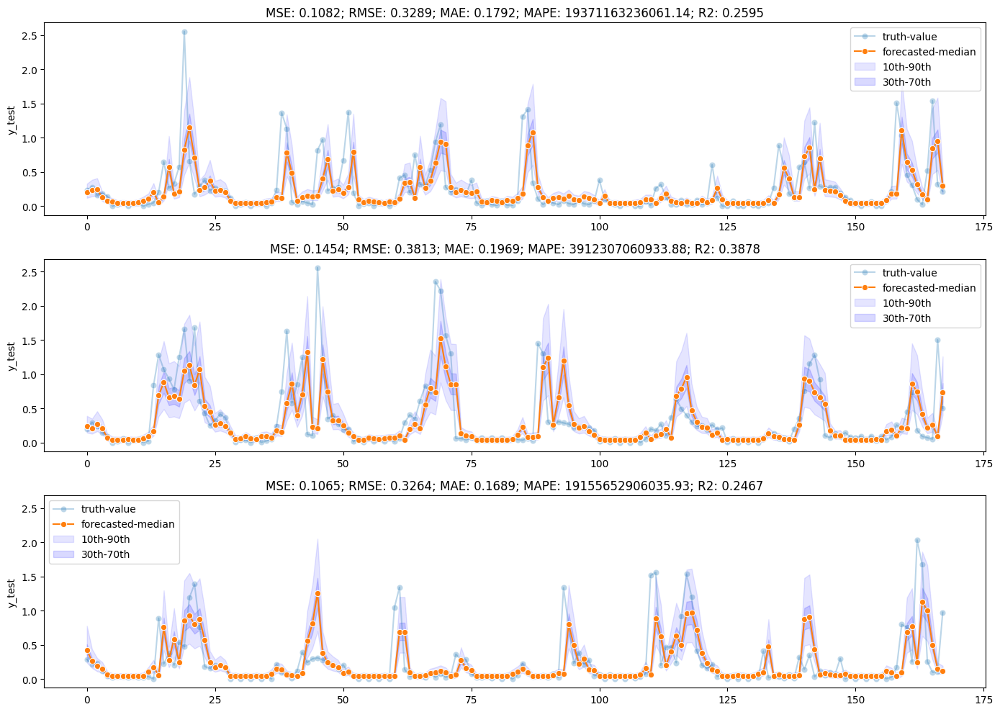

In [42]:
filtered_data = quantile_gru_pred_by_household.loc[quantile_gru_pred_by_household['household_id'] == 48]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))

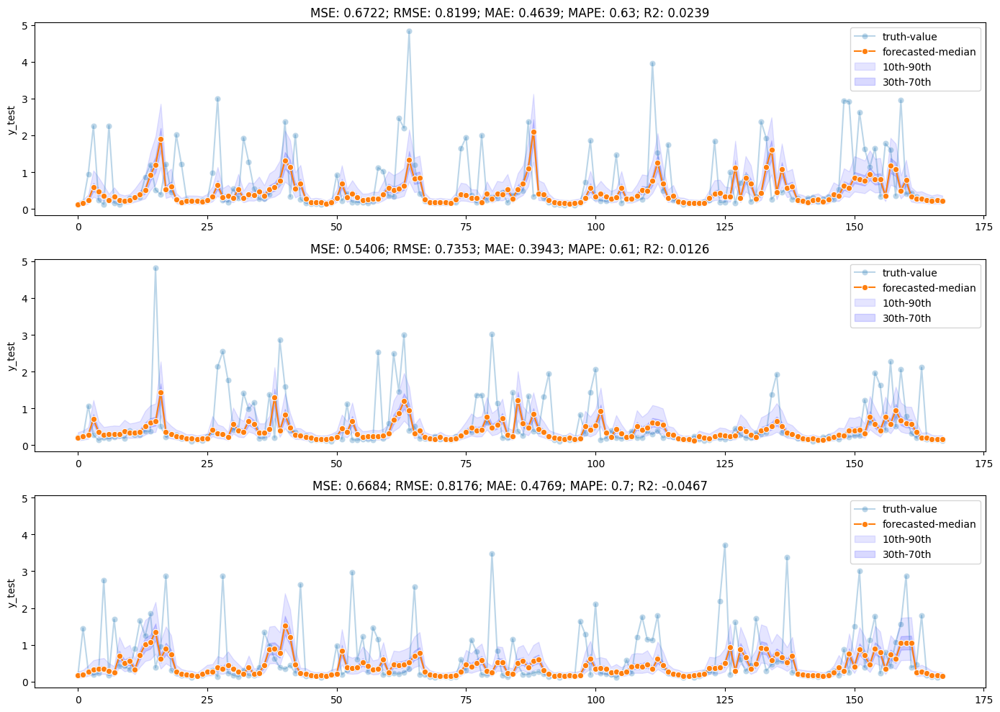

In [40]:
filtered_data = quantile_gru_pred_by_household.loc[quantile_gru_pred_by_household['household_id'] == 0]
plot_forecast(filtered_data[['pred_0.1', 'pred_0.3', 'pred_0.5', 'pred_0.7', 'pred_0.9']], filtered_data['y_test'], number_of_slices=3, steps=168, skip=(168 * 0))